### CAPSTONE 7 - Project Title:

Emotion Recognition From Speech and Beyond

### Domain: 
Audio

### Supervisor:
Dr. Sriram Ganapathy (sriramg@iisc.ac.in)

### Mentor
Karthick Raja

### Objective:

To classify various emotions (calm, happy, sad, angry, fearful, surprise, and disgust) in Audio Files using deep learning. Essentially, it a multiclass classification problem.

## Dataset 

**Ravdess Dataset**

The Ryerson Audio-Visual Database of Emotional Speech and Song [RAVDESS](https://zenodo.org/record/1188976#.YuuUNhxBzIV) contains 1440 files: 60 trials per actor x 24 actors = 1440. The RAVDESS contains 24 professional actors (12 female, 12 male), vocalizing two lexically-matched statements in a neutral North American accent. Speech includes `calm, happy, sad, angry, fearful, surprise`, `and disgust` expressions. Each expression is produced at two levels of emotional intensity (normal, strong), with an additional neutral expression. The conditions of the audio files are: 16bit, 48kHz .wav.


**File naming convention**

Each of the 1440 files has a unique filename. The filename consists of a 7-part numerical identifier (e.g., 03-01-06-01-02-01-12.wav). These identifiers define the stimulus characteristics:

**Filename identifiers**

* Modality (01 = full-AV, 02 = video-only, 03 = audio-only).
* Vocal channel (01 = speech, 02 = song).
* Emotion (01 = neutral, 02 = calm, 03 = happy, 04 = sad, 05 = angry, 06 = fearful, 07 = disgust, 08 = surprised).
* Emotional intensity (01 = normal, 02 = strong). NOTE: There is no strong intensity for the 'neutral' emotion.
* Statement (01 = "Kids are talking by the door", 02 = "Dogs are sitting by the door").
* Repetition (01 = 1st repetition, 02 = 2nd repetition).
* Actor (01 to 24. Odd numbered actors are male, even numbered actors are female).

Filename example: `03-01-06-01-02-01-12.wav`

    - Audio-only - 03
    - Speech - 01
    - Fearful - 06
    - Normal intensity - 01
    - Statement "dogs" - 02
    - 1st Repetition - 01
    - 12th Actor - 12 Female, as the actor ID number is even.

## Domain Information

**What is Speech Emotion Recognition?**

**Speech Emotion Recognition (SER)** is the task of recognizing the emotion from speech, irrespective of the semantics. Humans can efficiently perform this task as a natural part of speech communication, however, the ability to conduct it automatically using programmable devices is a field of active research.

Studies of automatic emotion recognition systems aim to create efficient, real-time methods of detecting the emotions of mobile phone users, call center operators and customers, car drivers, pilots, and many other human-machine communication users. Adding emotions to machines forms an important aspect of making machines appear and act in a human-like manner.

With the growing demand for conversational agents and personal assistants, automatic recognition
of human emotion has emerged as a key task in enabling enhanced user experience. Human emotion
recognition using multi-modal data of text, speech and video has substantial impact on various
applications like smartphones, wearable devices, smart speakers, driver monitoring in automotives,
mood analysis and mental health. This area of developing emotional intelligence would allow machines
to be more human-like in the interactions.

**Properties of an audio signal**:
An audio signal is represented in the form of an audio signal having parameters such as frequency, bandwidth, decibel etc. A typical audio signal can be expressed as a function of Amplitude and Time.

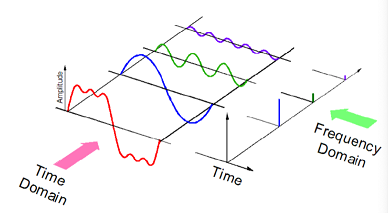

**Important Terms**

**Audio Signal** : Representation of Sound.

a) High Level:Instruments, key, Chords, Melody, Rhythm, Tempo, Lyrics, Genre and Mood.

b) Mid Level: Pitch & Beat related descriptor such note, onsets, fluctuation pattern, MFCC

c) Low Level: Amplitude Envelope, Energy, Spectral Centroid, Spectral fluc, Zero crossing rate.

**Spectrogram**: A spectrogram is a visual representation of the spectrum of frequencies of sound or other signals as they vary with time.

**MFCC**:
The Mel frequency cepstral coefficients (MFCCs) of a signal are a small set of features (usually about 10–20) which concisely describe the overall shape of a spectral envelope. It models the characteristics of the human voice. MFCC coefficients represent the envelope of the time power spectrum of the speech signal (13 coeff) Frequency bands of this spectrum are spaced logarithmically according to the Mel scale.

**Mel Spectrogram**:
Standard Spectrogram in Mel scale(perceptual scale of pitches that listeners perceive to be equally spaced from one another).
(low freq contents differentiated more than the high freq based on human audibility)
gives poor representation of pitch, but captures timbre

**Chroma**: (potential for music audio)
Full spectrum projected onto 12 bins(12 unique semitones/pitch)
It captures harmonic and melodic characteristics of music, while being robust to changes in timbre and instrumentation

**Tonnetz**:
contain harmonic content of a given audio signal.
An alternative representation of pitch and harmony can be obtained by the tonnetz function, which estimates tonal centroids - 6-dimensional basis representing the perfect fifth, minor third, and major third each as two-dimensional coordinates.

**power to db**:
specify the reference power(amplitude square) to dB ratio
ex. max power to 0 dB

**spectral contrast**:
Spectral contrast is defined as the decibel difference between peaks and valleys in the spectrum.
It considers the spectral peak, the spectral valley, and their difference in each frequency subband

**Spectral Centroid** It indicates where the ”centre of mass” for a sound is located and is calculated as the weighted mean of the frequencies present in the sound. Consider two songs, one from a blues genre and the other belonging to metal.

**Spectrogram vs Log scale spectrums** The difference between Spectrograms and log-scale spectrums, which are both being achieved by similar mathematical operations, is that while the first displays the frequencies and decibels over time, the latter shows the relation between the decibels and the frequencies.

## Stage 1: Setup

#### Importing required packages

In [ ]:
# Mount google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import numpy as np
import pandas as pd
import random
from matplotlib import pyplot as plt
import seaborn as sns
import librosa
# from tqdm import tqdm
import librosa.display
import IPython.display as ipd
from pathlib import Path
from collections import Counter, OrderedDict
import shutil
import os
from datetime import datetime
import pytz
import csv
import soundfile as sf
import time
from tqdm.notebook import tqdm, trange

from sklearn.preprocessing import minmax_scale, StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split, KFold, StratifiedKFold
from sklearn import metrics

import tensorflow as tf
from tensorflow import keras
from keras import backend as K

from keras.models import load_model
from keras.models import Sequential, Model
from keras.layers import Dense, GRU, LSTM, Flatten, TimeDistributed, Flatten, BatchNormalization, Activation, Permute
from keras.layers.convolutional import Conv3D, MaxPooling3D, Conv2D, MaxPooling2D, Conv1D, MaxPooling1D
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from keras import optimizers
from keras.optimizers import adam_v2
from keras.layers import Dropout

#### Setup random seed

In [ ]:
def set_seed(seed: int = 30) -> None:
    random.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    tf.experimental.numpy.random.seed(seed)
    tf.set_random_seed(seed)
    # When running on the CuDNN backend, two further options must be set
    os.environ['TF_CUDNN_DETERMINISTIC'] = '1'
    os.environ['TF_DETERMINISTIC_OPS'] = '1'
    # Set a fixed value for the hash seed
    os.environ["PYTHONHASHSEED"] = str(seed)
    print(f"Random seed set as {seed}")

#### Define timezone

In [ ]:
# Define timezone
IST = pytz.timezone('Asia/Kolkata')

#### Download the data

In [ ]:
# Download speech data
# !wget https://zenodo.org/record/1188976/files/Audio_Speech_Actors_01-24.zip
shutil.copy('/content/drive/MyDrive/Colab Notebooks/IISC_DL/05_CapstoneProject_SER/04_Code&Data/Data/Audio_Speech_Actors_01-24.zip', '/content/')

'/content/Audio_Speech_Actors_01-24.zip'

In [ ]:
# # Download songs data
# !wget https://zenodo.org/record/1188976/files/Audio_Song_Actors_01-24.zip

In [ ]:
!mkdir -p data/ravdess/speech
# !mkdir -p data/ravdess/song
%ls data/ravdess/speech

In [ ]:
# Unzip the ravdess speech and songs dataset files
!unzip Audio_Speech_Actors_01-24.zip -d data/ravdess/speech
# !unzip Audio_Song_Actors_01-24.zip -d data/ravdess/songs

Archive:  Audio_Speech_Actors_01-24.zip
   creating: data/ravdess/speech/Actor_01/
  inflating: data/ravdess/speech/Actor_01/03-01-01-01-01-01-01.wav  
  inflating: data/ravdess/speech/Actor_01/03-01-01-01-01-02-01.wav  
  inflating: data/ravdess/speech/Actor_01/03-01-01-01-02-01-01.wav  
  inflating: data/ravdess/speech/Actor_01/03-01-01-01-02-02-01.wav  
  inflating: data/ravdess/speech/Actor_01/03-01-02-01-01-01-01.wav  
  inflating: data/ravdess/speech/Actor_01/03-01-02-01-01-02-01.wav  
  inflating: data/ravdess/speech/Actor_01/03-01-02-01-02-01-01.wav  
  inflating: data/ravdess/speech/Actor_01/03-01-02-01-02-02-01.wav  
  inflating: data/ravdess/speech/Actor_01/03-01-02-02-01-01-01.wav  
  inflating: data/ravdess/speech/Actor_01/03-01-02-02-01-02-01.wav  
  inflating: data/ravdess/speech/Actor_01/03-01-02-02-02-01-01.wav  
  inflating: data/ravdess/speech/Actor_01/03-01-02-02-02-02-01.wav  
  inflating: data/ravdess/speech/Actor_01/03-01-03-01-01-01-01.wav  
  inflating: data/ra

In [ ]:
data_path = 'data/ravdess/speech'

In [ ]:
%ls 'data/ravdess/speech'

Actor_01/  Actor_05/  Actor_09/  Actor_13/  Actor_17/  Actor_21/
Actor_02/  Actor_06/  Actor_10/  Actor_14/  Actor_18/  Actor_22/
Actor_03/  Actor_07/  Actor_11/  Actor_15/  Actor_19/  Actor_23/
Actor_04/  Actor_08/  Actor_12/  Actor_16/  Actor_20/  Actor_24/


In [ ]:
%ls 'data/ravdess/speech/Actor_01'

03-01-01-01-01-01-01.wav  03-01-04-01-01-01-01.wav  03-01-06-02-01-01-01.wav
03-01-01-01-01-02-01.wav  03-01-04-01-01-02-01.wav  03-01-06-02-01-02-01.wav
03-01-01-01-02-01-01.wav  03-01-04-01-02-01-01.wav  03-01-06-02-02-01-01.wav
03-01-01-01-02-02-01.wav  03-01-04-01-02-02-01.wav  03-01-06-02-02-02-01.wav
03-01-02-01-01-01-01.wav  03-01-04-02-01-01-01.wav  03-01-07-01-01-01-01.wav
03-01-02-01-01-02-01.wav  03-01-04-02-01-02-01.wav  03-01-07-01-01-02-01.wav
03-01-02-01-02-01-01.wav  03-01-04-02-02-01-01.wav  03-01-07-01-02-01-01.wav
03-01-02-01-02-02-01.wav  03-01-04-02-02-02-01.wav  03-01-07-01-02-02-01.wav
03-01-02-02-01-01-01.wav  03-01-05-01-01-01-01.wav  03-01-07-02-01-01-01.wav
03-01-02-02-01-02-01.wav  03-01-05-01-01-02-01.wav  03-01-07-02-01-02-01.wav
03-01-02-02-02-01-01.wav  03-01-05-01-02-01-01.wav  03-01-07-02-02-01-01.wav
03-01-02-02-02-02-01.wav  03-01-05-01-02-02-01.wav  03-01-07-02-02-02-01.wav
03-01-03-01-01-01-01.wav  03-01-05-02-01-01-01.wav  03-01-08-01-01-01-01.wav

In [ ]:
# %ls 'data/ravdess/songs'

In [ ]:
# %ls 'data/ravdess/songs/Actor_01'

## Stage 2: Load the data audio files

In [ ]:
# Function to get the .wav files and Map the labels for each wav file
def get_files(path, extension='.wav'):
    return list(path.rglob(f'*{extension}'))

# Emotion (01 = neutral, 02 = calm, 03 = happy, 04 = sad, 05 = angry, 06 = fearful, 07 = disgust, 08 = surprised)

label_id = {"neutral": 0, 
            "calm": 1, 
            "happy": 2, 
            "sad": 3,
            "angry": 4, 
            "fearful": 5, 
            "disgust": 6, 
            "surprised": 7,
           } #let label_id = label_id - 1, eg: 01 = 0, 02=1, etc       

label_id_rev = {v:k for k, v in label_id.items()}

In [ ]:
categories = list(label_id.keys())

In [ ]:
# label_id_rev

In [ ]:
# Get all files from the ravdess data folders
all_files = get_files(Path(data_path))
print(f'Number of audio files: {len(all_files)}')

# storing 24 actors files
speakers = set([str(l).split('/')[-2] for l in all_files])

# Assigning labels to each .wav file in all the actor folders
# Note: the label id starts from 0 to 7
labels = {str(l):int(l.stem.split('-')[2][-1])-1 for l in all_files}
print(f'Number of speakers: {len(speakers)}')
print(f'Speakers: {speakers}')

Number of audio files: 1440
Number of speakers: 24
Speakers: {'Actor_12', 'Actor_06', 'Actor_21', 'Actor_18', 'Actor_16', 'Actor_22', 'Actor_03', 'Actor_04', 'Actor_20', 'Actor_02', 'Actor_14', 'Actor_23', 'Actor_05', 'Actor_13', 'Actor_11', 'Actor_09', 'Actor_10', 'Actor_15', 'Actor_24', 'Actor_19', 'Actor_17', 'Actor_08', 'Actor_01', 'Actor_07'}


In [ ]:
emotion_values = [int(f.stem.split('-')[2][-1])-1 for f in all_files]
statements = [int(f.stem.split('-')[4][-1]) for f in all_files]
gender = ['Female' if int(f.stem.split('-')[6][-1]) % 2 == 0 else "Male" for f in all_files] 
durations = [librosa.get_duration(filename=f) for f in all_files]

In [ ]:
ravdess_speech_df = pd.DataFrame(list(zip(all_files, emotion_values, statements, gender, durations)), columns = ['Path', 'Labels', 'Statement', 'Gender', 'Duration'])
ravdess_speech_df['Emotions'] = ravdess_speech_df['Labels'].map(label_id_rev)
ravdess_speech_df.head()

,Path,Labels,Statement,Gender,Duration,Emotions
0,data/ravdess/speech/Actor_05/03-01-05-01-01-02...,4,1,Male,3.803792,angry
1,data/ravdess/speech/Actor_05/03-01-03-02-01-01...,2,1,Male,4.137479,happy
2,data/ravdess/speech/Actor_05/03-01-06-01-01-02...,5,1,Male,3.370021,fearful
3,data/ravdess/speech/Actor_05/03-01-04-01-02-02...,3,2,Male,3.703688,sad
4,data/ravdess/speech/Actor_05/03-01-03-01-01-01...,2,1,Male,4.004000,happy


In [ ]:
ravdess_speech_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1440 entries, 0 to 1439
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Path       1440 non-null   object 
 1   Labels     1440 non-null   int64  
 2   Statement  1440 non-null   int64  
 3   Gender     1440 non-null   object 
 4   Duration   1440 non-null   float64
 5   Emotions   1440 non-null   object 
dtypes: float64(1), int64(2), object(3)
memory usage: 67.6+ KB


## Stage 3: Data Exploration and Visualization

#### Find count of each label and plot bar graph

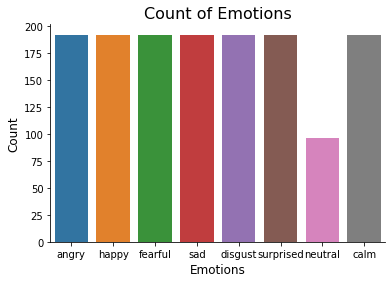

In [ ]:
plt.title('Count of Emotions', size=16)
plt.rcParams["figure.figsize"] = (8,6)
sns.countplot(x=ravdess_speech_df["Emotions"])
plt.ylabel('Count', size=12)
plt.xlabel('Emotions', size=12)
sns.despine(top=True, right=True, left=False, bottom=False)
plt.show()

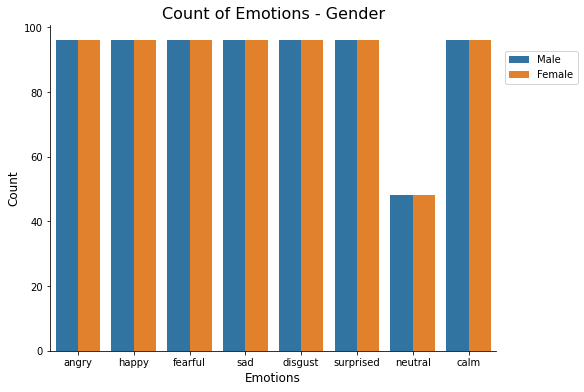

In [ ]:
plt.title('Count of Emotions - Gender', size=16)
sns.countplot(data=ravdess_speech_df, x="Emotions", hue="Gender")
plt.ylabel('Count', size=12)
plt.xlabel('Emotions', size=12)
sns.despine(top=True, right=True, left=False, bottom=False)
plt.legend(bbox_to_anchor=(1.02, 0.92), loc='upper left', borderaxespad=0)
plt.show()

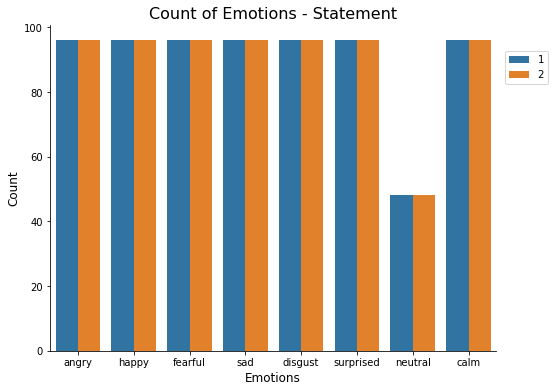

In [ ]:
plt.title('Count of Emotions - Statement', size=16)
sns.countplot(data=ravdess_speech_df, x="Emotions", hue="Statement")
plt.ylabel('Count', size=12)
plt.xlabel('Emotions', size=12)
sns.despine(top=True, right=True, left=False, bottom=False)
plt.legend(bbox_to_anchor=(1.02, 0.92), loc='upper left', borderaxespad=0)
plt.show()

This dataset is well balanced except for <b><i>Neutral</i></b> category. Hence stratified k fold is used.

#### Find minimum and maximum duration of audio files

[]

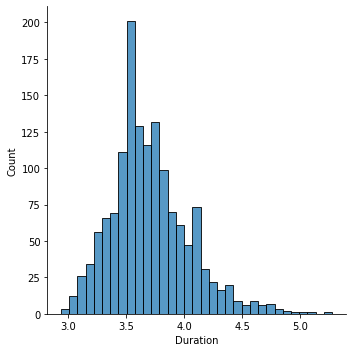

In [ ]:
sns.displot(ravdess_speech_df["Duration"])
plt.plot()

In [ ]:
ravdess_speech_df["Duration"].describe()

count    1440.000000
mean        3.700665
std         0.336676
min         2.936271
25%         3.470146
50%         3.670333
75%         3.870542
max         5.271937
Name: Duration, dtype: float64

In [ ]:
min_len_audio_path = ravdess_speech_df['Path'][ravdess_speech_df[['Duration']].idxmin().item()]
max_len_audio_path = ravdess_speech_df['Path'][ravdess_speech_df[['Duration']].idxmax().item()]

In [ ]:
print(f"Audio file with minimum number of samples: {min_len_audio_path}")
print(f"Minimum duration: {ravdess_speech_df['Duration'].min():.3f} seconds")
print(f"\nAudio file with Maximum number of samples: {max_len_audio_path}")
print(f"Maximum duration: {ravdess_speech_df['Duration'].max():.3f} seconds")

Audio file with minimum number of samples: data/ravdess/speech/Actor_13/03-01-02-01-02-02-13.wav
Minimum duration: 2.936 seconds

Audio file with Maximum number of samples: data/ravdess/speech/Actor_19/03-01-07-02-01-02-19.wav
Maximum duration: 5.272 seconds


#### Set hyperparameters

In [ ]:
# Hyper-parameters
SAMPLE_RATE = 22050
DURATION = 4.5
OFFSET = 0.0
HOP_LEN = 512
WIN_LEN = 512
WINDOW = 'hann'
N_FFT = 2048
N_MFCC = 30
N_CHROMA = 12
N_MELS = 13                 # Number of mel bands
N_BANDS = 6
FMAX = 1024
MAX_INPUT_LEN = 194         # time axis
FEATURE_LIST = ['mfcc']     # List of features; Available features: 'mfcc', 'chroma', 'logmelspectrogram', 'contrast', 'tonnetz' 
NORM = False
AUDIO_AUGMENT = True
SPECAUGMENT = False
TEST_SIZE = 0.2
BATCH_SIZE = 128
max_epochs = 100
initial_lr = 0.001
weight_decay = None
momentum = None
FILTERS = 16
KERNEL_SIZE = 3
LSTM_OUT = 512
DP = 0.2
N_FOLDS = 5                 # number of k folds

# Convert list of features to one dim
feature_list_converted = FEATURE_LIST[0]
if len(FEATURE_LIST) > 1:
    for i in range(1, len(FEATURE_LIST)):
        feature_list_converted += ', ' + FEATURE_LIST[i]
feature_list_converted

'mfcc'

#### Visualization of a sample audio signal using librosa in time series domain

In [ ]:
def display_waveplot(signal, sr):
    plt.figure(figsize=(15, 5))
    plt.title('Waveplot for audio', size=15)
    librosa.display.waveshow(signal, sr=sr)
    plt.xlabel("Time")
    plt.ylabel("Amplitude")
    plt.show()

def display_spectrogram(signal, sr):
    # stft function converts the data into short term fourier transform
    X = librosa.stft(signal)
    Xdb = librosa.amplitude_to_db(abs(X))
    plt.figure(figsize=(18, 5))
    plt.title('Spectrogram for audio', size=15)
    librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')   
    #librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log')
    plt.colorbar()

def display_spectral_centroids_plot(signal, sr): 
    spectral_centroids = librosa.feature.spectral_centroid(signal, sr=sr)[0]
    frames = range(len(spectral_centroids))
    t = librosa.frames_to_time(frames, sr=sr, hop_length=HOP_LEN, n_fft=N_FFT) 

    fig, ax1 = plt.subplots(figsize=(15,5)) 
    plt.title('Spectral Centroids plot', size=15)
    librosa.display.waveplot(signal, sr=sr, alpha=0.4)
    ax1.set_ylabel("Amplitude")
    ax2 = ax1.twinx()
    ax2.plot(t, minmax_scale(spectral_centroids,  axis=0), color='r')
    ax2.set_ylim([-1,1])
    ax2.set_ylabel("Spectral Centroid")
    plt.show()

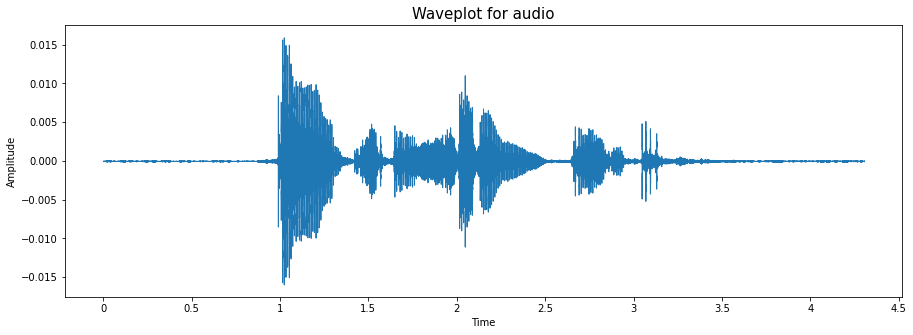

In [ ]:
sample_audio_path = 'data/ravdess/speech/Actor_05/03-01-02-02-02-02-05.wav'
# sample_audio_path = 'data/ravdess/speech/Actor_13/03-01-03-02-01-01-13.wav'
signal, sr = librosa.load(sample_audio_path, sr=SAMPLE_RATE)
display_waveplot(signal, sr)
ipd.Audio(sample_audio_path)

In [ ]:
print(f"Total number of samples: {signal.shape[0]}")
print(f"Sampling rate: {sr}")
print(f"Length of file in seconds: {librosa.get_duration(y=signal, sr=SAMPLE_RATE)}")

Total number of samples: 94910
Sampling rate: 22050
Length of file in seconds: 4.304308390022676


#### Plot spectral centroids, waveplot and spectograms for various emotions 

In [ ]:
sample_audio_files = [Path('/content/data/ravdess/speech/Actor_11/03-01-01-01-01-01-11.wav'),
                      Path('/content/data/ravdess/speech/Actor_11/03-01-02-01-01-01-11.wav'),
                      Path('/content/data/ravdess/speech/Actor_11/03-01-03-01-01-01-11.wav'),
                      Path('/content/data/ravdess/speech/Actor_11/03-01-04-01-01-01-11.wav'),
                      Path('/content/data/ravdess/speech/Actor_11/03-01-05-01-01-01-11.wav'),
                      Path('/content/data/ravdess/speech/Actor_11/03-01-06-01-01-01-11.wav'),
                      Path('/content/data/ravdess/speech/Actor_11/03-01-07-01-01-01-11.wav'),
                      Path('/content/data/ravdess/speech/Actor_11/03-01-08-01-01-01-11.wav')]


path_labels = {str(l):int(l.stem.split('-')[2][-1])-1 for l in sample_audio_files}
path_labels = {k:label_id_rev[v] for k,v in path_labels.items()}

In [ ]:
path_labels

{'/content/data/ravdess/speech/Actor_11/03-01-01-01-01-01-11.wav': 'neutral',
 '/content/data/ravdess/speech/Actor_11/03-01-02-01-01-01-11.wav': 'calm',
 '/content/data/ravdess/speech/Actor_11/03-01-03-01-01-01-11.wav': 'happy',
 '/content/data/ravdess/speech/Actor_11/03-01-04-01-01-01-11.wav': 'sad',
 '/content/data/ravdess/speech/Actor_11/03-01-05-01-01-01-11.wav': 'angry',
 '/content/data/ravdess/speech/Actor_11/03-01-06-01-01-01-11.wav': 'fearful',
 '/content/data/ravdess/speech/Actor_11/03-01-07-01-01-01-11.wav': 'disgust',
 '/content/data/ravdess/speech/Actor_11/03-01-08-01-01-01-11.wav': 'surprised'}

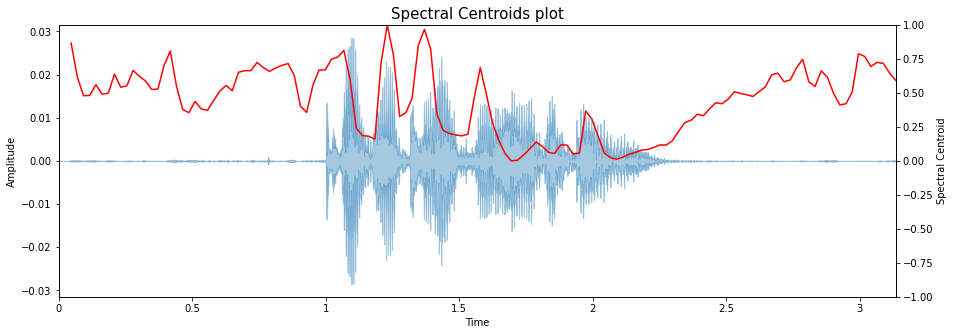

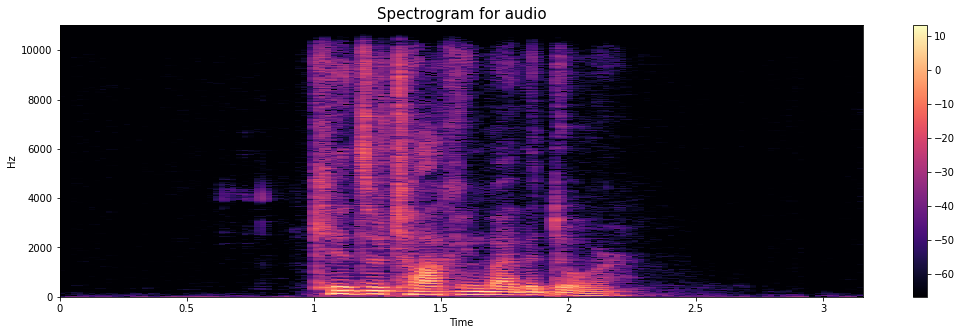

In [ ]:
# Emotion: Neutral
sample_audio_path = '/content/data/ravdess/speech/Actor_11/03-01-01-01-01-01-11.wav'
signal, sr = librosa.load(sample_audio_path, sr=SAMPLE_RATE)
display_spectral_centroids_plot(signal, sr)
display_spectrogram(signal, sr)
ipd.Audio(sample_audio_path)

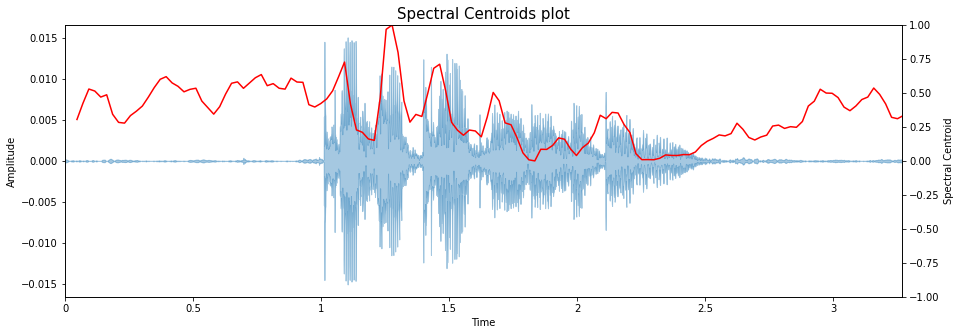

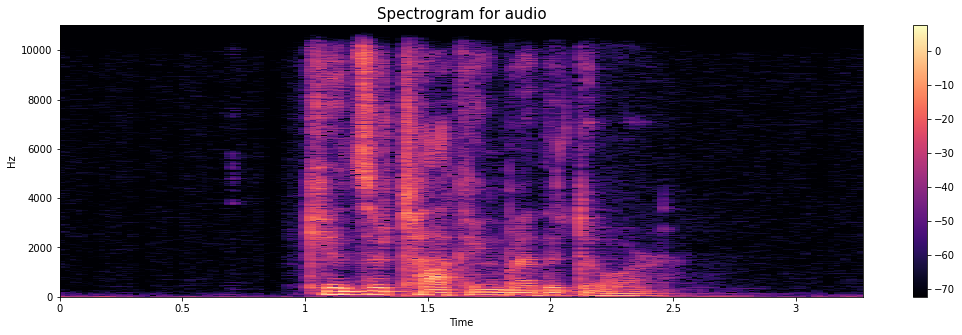

In [ ]:
# Emotion: Calm
sample_audio_path = '/content/data/ravdess/speech/Actor_11/03-01-02-01-01-01-11.wav'
signal, sr = librosa.load(sample_audio_path, sr=SAMPLE_RATE)
display_spectral_centroids_plot(signal, sr)
display_spectrogram(signal, sr)
ipd.Audio(sample_audio_path)

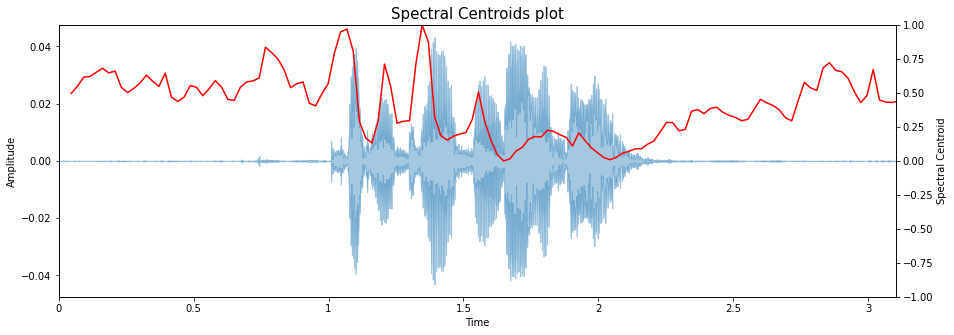

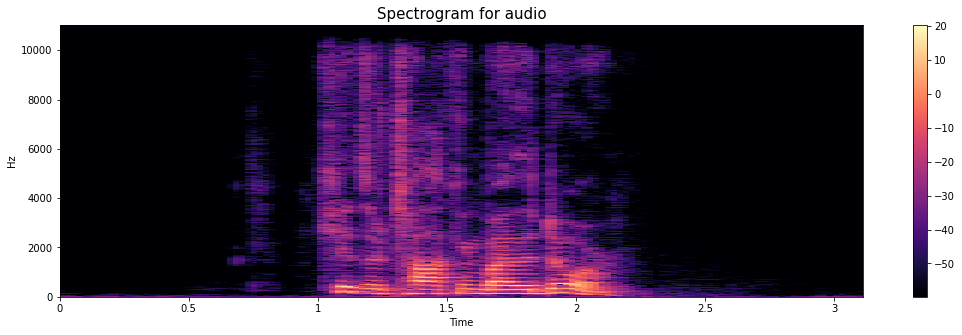

In [ ]:
# Emotion: Happy
sample_audio_path = '/content/data/ravdess/speech/Actor_11/03-01-03-01-01-01-11.wav'
signal, sr = librosa.load(sample_audio_path, sr=SAMPLE_RATE)
display_spectral_centroids_plot(signal, sr)
display_spectrogram(signal, sr)
ipd.Audio(sample_audio_path)

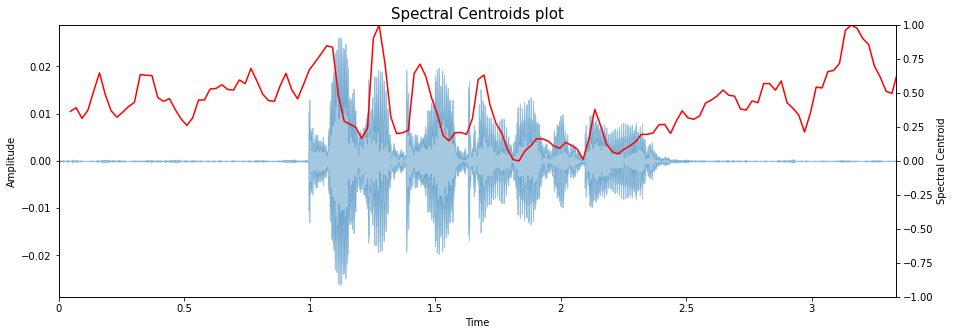

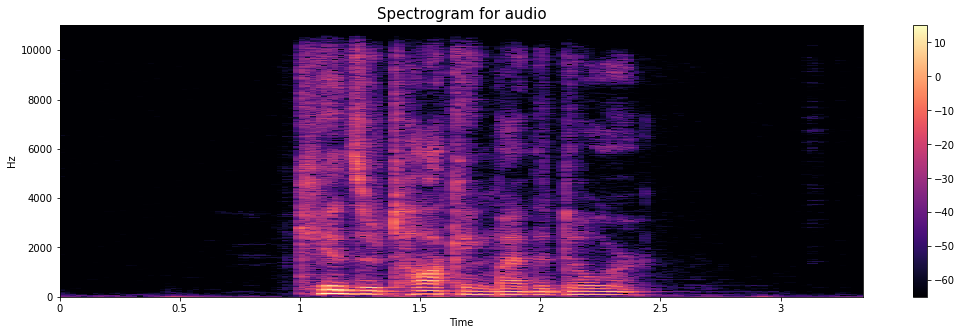

In [ ]:
# Emotion: Sad
sample_audio_path = '/content/data/ravdess/speech/Actor_11/03-01-04-01-01-01-11.wav'
signal, sr = librosa.load(sample_audio_path, sr=SAMPLE_RATE)
display_spectral_centroids_plot(signal, sr)
display_spectrogram(signal, sr)
ipd.Audio(sample_audio_path)

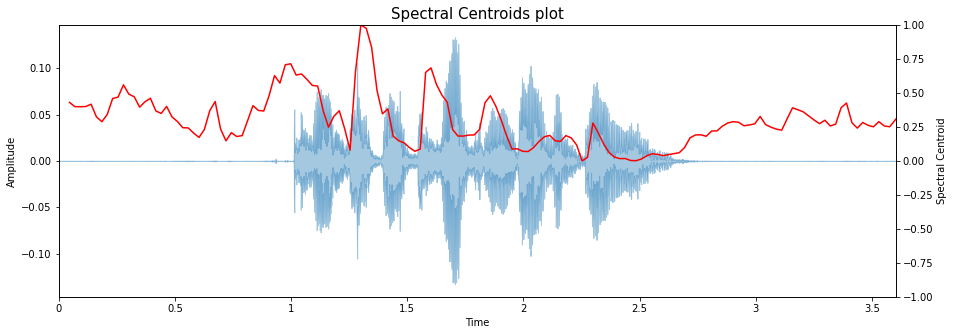

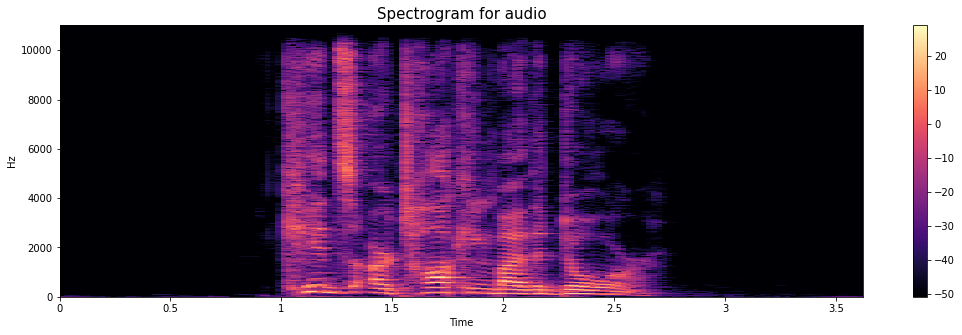

In [ ]:
# Emotion: Angry
sample_audio_path = '/content/data/ravdess/speech/Actor_11/03-01-05-01-01-01-11.wav'
signal, sr = librosa.load(sample_audio_path, sr=SAMPLE_RATE)
display_spectral_centroids_plot(signal, sr)
display_spectrogram(signal, sr)
ipd.Audio(sample_audio_path)

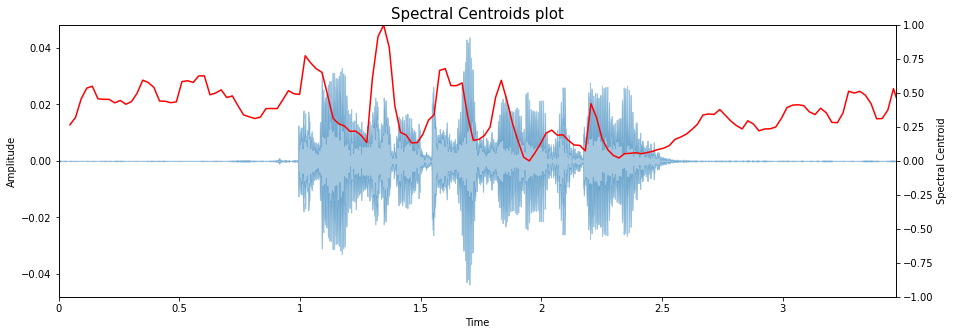

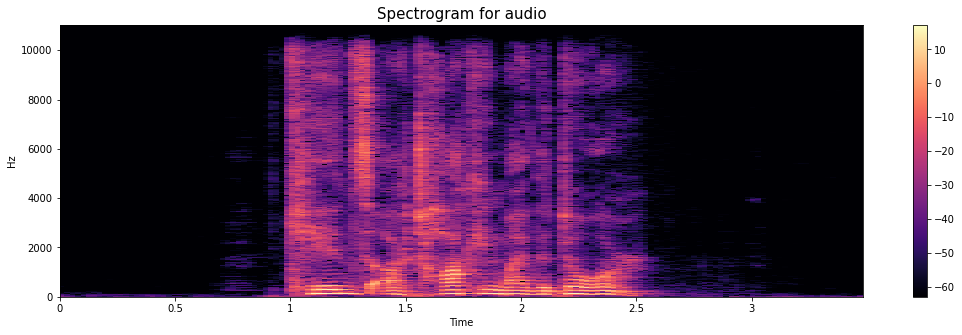

In [ ]:
# Emotion: Fearful
sample_audio_path = '/content/data/ravdess/speech/Actor_11/03-01-06-01-01-01-11.wav'
signal, sr = librosa.load(sample_audio_path, sr=SAMPLE_RATE)
display_spectral_centroids_plot(signal, sr)
display_spectrogram(signal, sr)
ipd.Audio(sample_audio_path)

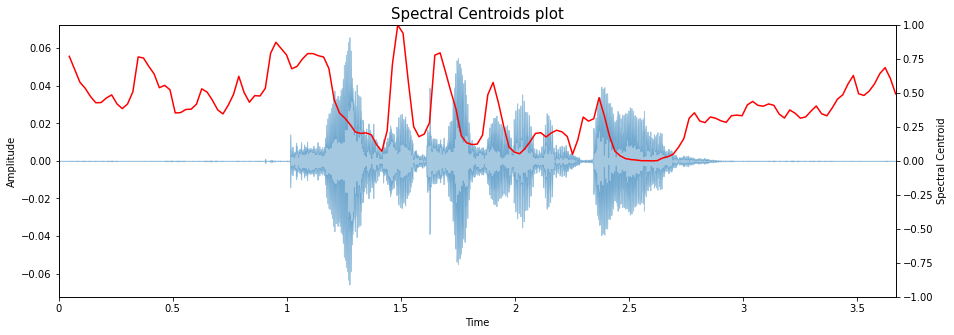

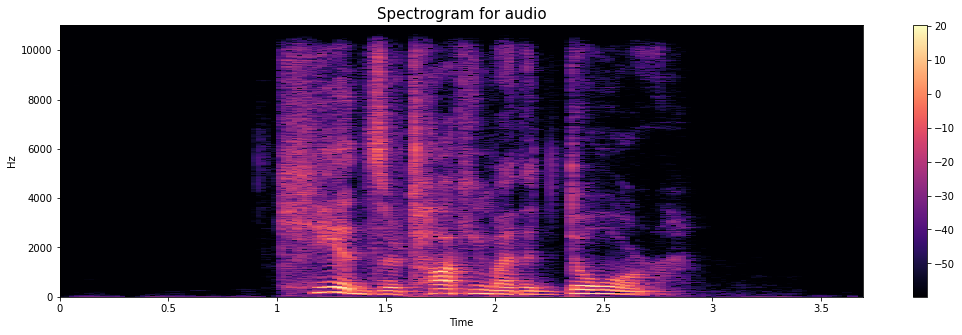

In [ ]:
# Emotion: Disgust
sample_audio_path = '/content/data/ravdess/speech/Actor_11/03-01-07-01-01-01-11.wav'
signal, sr = librosa.load(sample_audio_path, sr=SAMPLE_RATE)
display_spectral_centroids_plot(signal, sr)
display_spectrogram(signal, sr)
ipd.Audio(sample_audio_path)

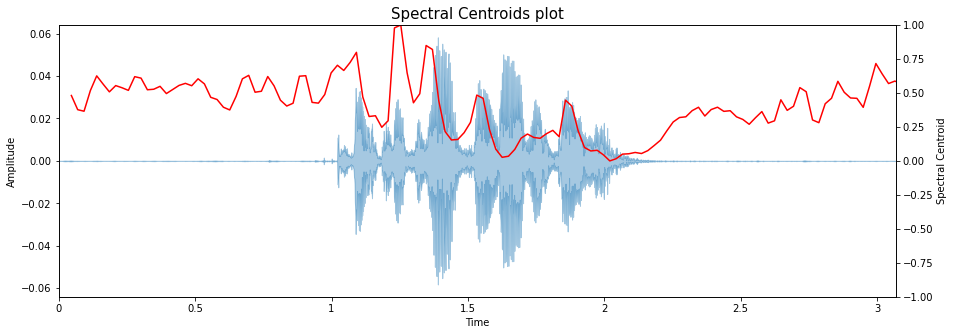

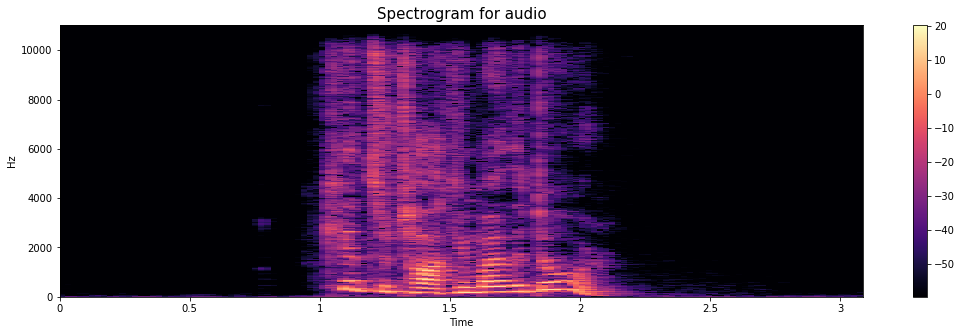

In [ ]:
# Emotion: Surprised
sample_audio_path = '/content/data/ravdess/speech/Actor_11/03-01-08-01-01-01-11.wav'
signal, sr = librosa.load(sample_audio_path, sr=SAMPLE_RATE)
display_spectral_centroids_plot(signal, sr)
display_spectrogram(signal, sr)
ipd.Audio(sample_audio_path)

**Observations**:

Anger, Fear emotions are touching a higher amplitude. Because people are generally loud with such emotions. But this also shows that these emotions will have a significant overlap in the time domain.

Emotions like Sad, Neutral, Disgust have a lower amplitude Also there is more breathing noise in these emotions as compared to Fear and Anger.

**Max Amplitude values**:

Sad: 0.01

Disgusted: 0.02

Happy : 0.04

Surprise: 0.04

Fearful : 0.15

Angry: 0.80

## Stage 4: Data augumentation 

In [ ]:
def noise(signal):
    ''' Noise addition using normal distribution '''

    noise_amp = 0.015*np.random.uniform()*np.amax(signal)
    signal += noise_amp*np.random.normal(size=signal.shape[0])
    return signal

def stretch(signal, factor=0.85):
    ''' Permissible factor values = 0 < x < 1.0 '''

    return librosa.effects.time_stretch(signal, factor)

def shift(signal, sr):
    ''' Permissible factor values = sr/10'''
    
    # shift_range = int(np.random.uniform(low=-5, high = 5)*1000)
    return np.roll(signal, int(sr/10))

def pitch(signal, sr, pitch_factor=0.7):
    ''' Permissible factor values = -5 <= x <= 5 '''

    return librosa.effects.pitch_shift(signal, sr, pitch_factor)

#### 1. Original audio

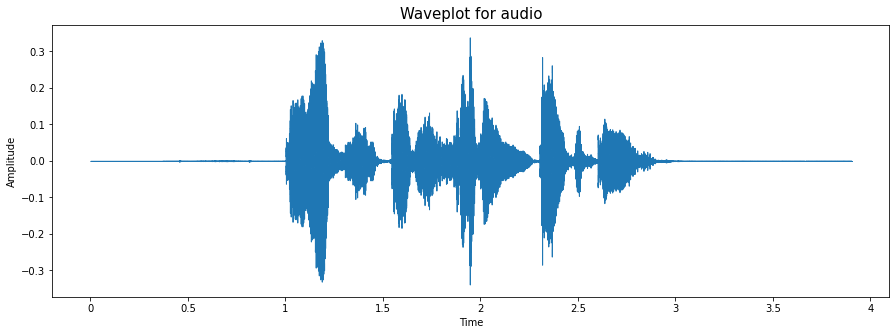

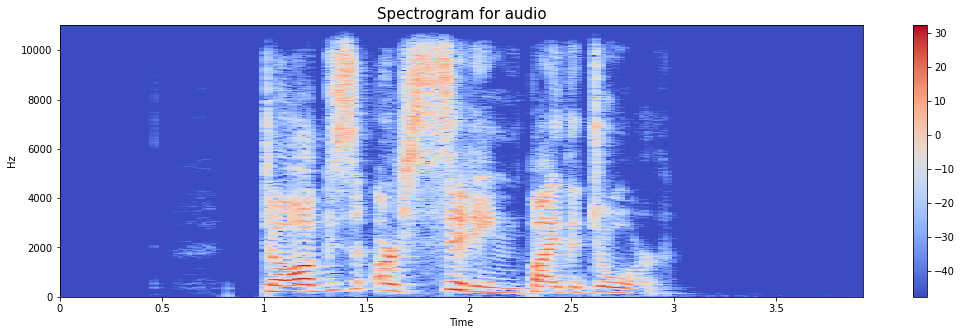

In [ ]:
# taking any example of orinial audio
path = all_files[153]
signal, sr = librosa.load(path, sr=SAMPLE_RATE)

display_waveplot(signal, sr)
display_spectrogram(signal, sr)
ipd.Audio(signal, rate=sr)

#### 2. Noise addition

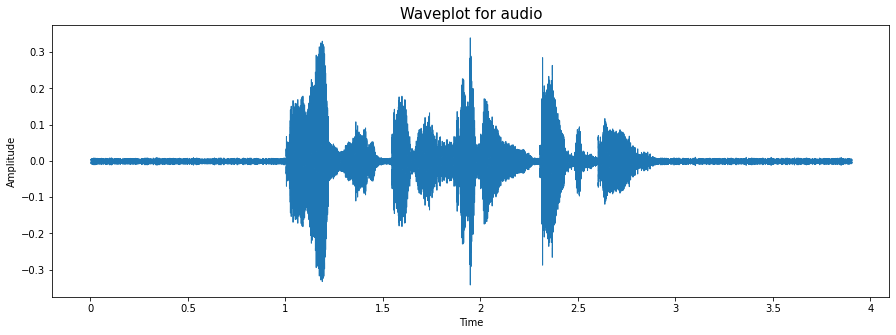

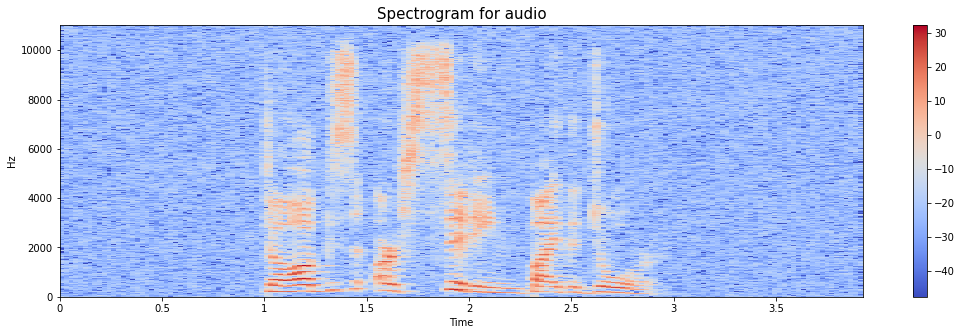

In [ ]:
# taking any example and checking for noise addition
path = all_files[153]
signal, sr = librosa.load(path, sr=SAMPLE_RATE)

aug_noise = noise(signal)
display_waveplot(aug_noise, sr)
display_spectrogram(aug_noise, sr)
ipd.Audio(aug_noise, rate=sr)

#### 3. Time stretching

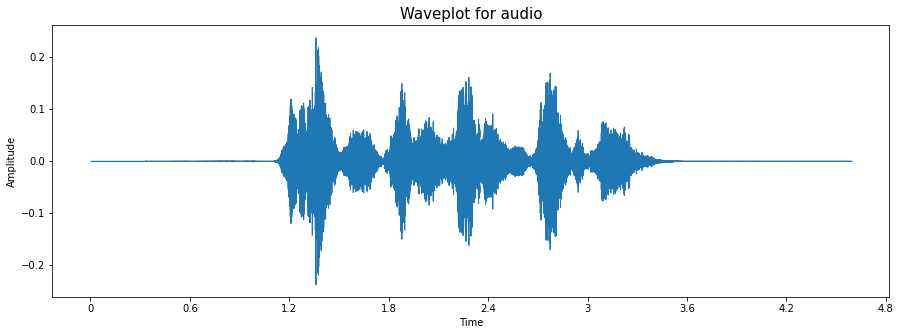

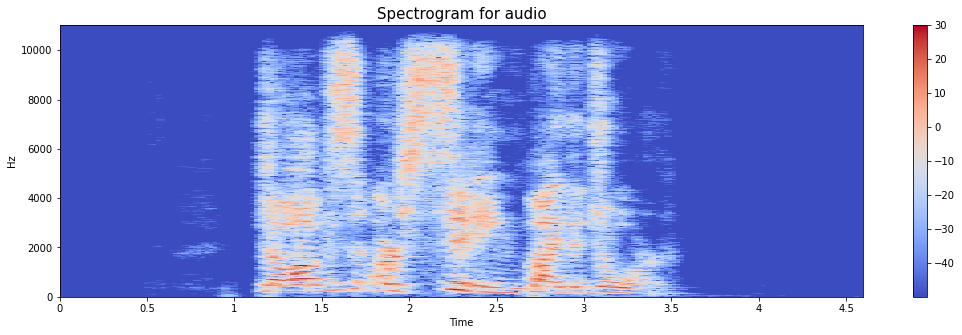

In [ ]:
# taking any example and checking for time stretching
path = all_files[153]
signal, sr = librosa.load(path, sr=SAMPLE_RATE)

aug_stretch = stretch(signal)
display_waveplot(aug_stretch, sr)
display_spectrogram(aug_stretch, sr)
ipd.Audio(aug_stretch, rate=SAMPLE_RATE)

#### 4. Time shifting

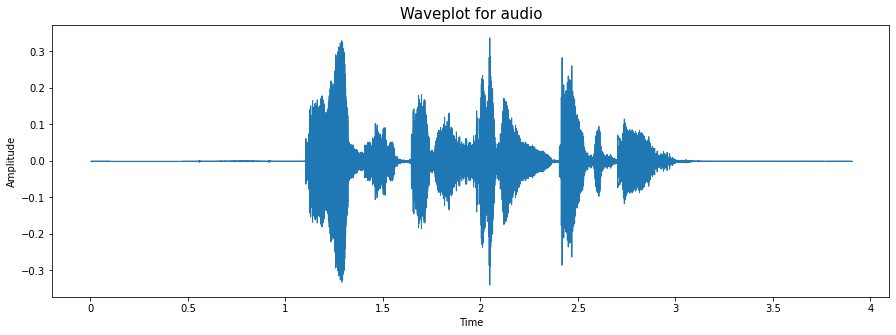

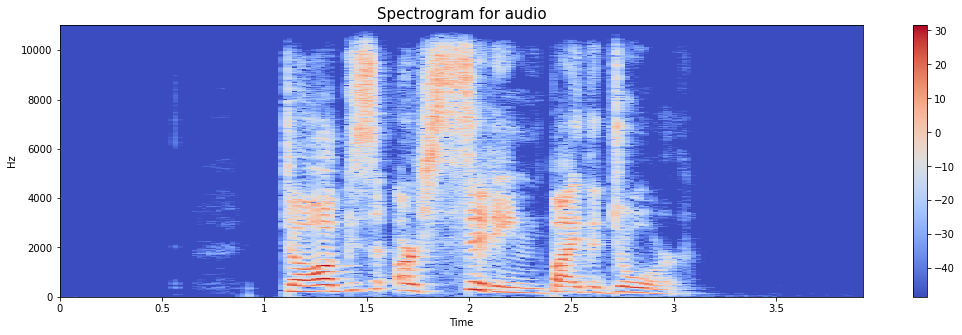

In [ ]:
# taking any example and checking for time shifting
path = all_files[153]
signal, sr = librosa.load(path, sr=SAMPLE_RATE)

aug_shift = shift(signal, sr)
display_waveplot(aug_shift, sr)
display_spectrogram(aug_shift, sr)
ipd.Audio(aug_shift, rate=SAMPLE_RATE)

#### 5. Pitch shifting

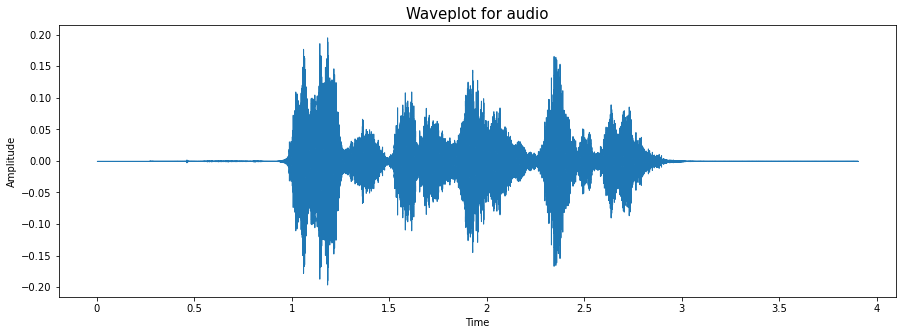

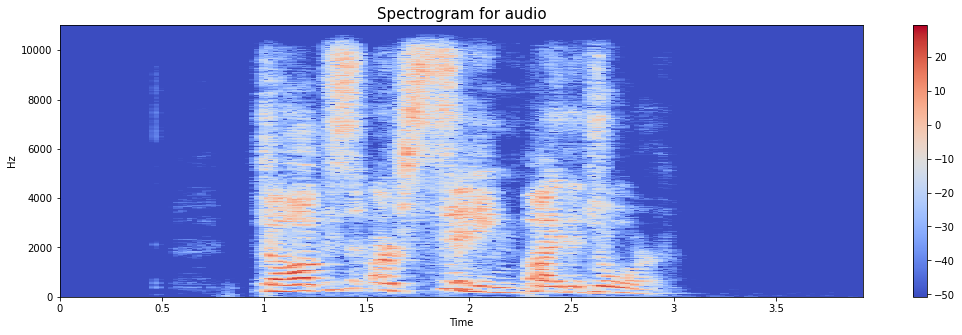

In [ ]:
# taking any example and checking for time shifting
path = all_files[153]
signal, sr = librosa.load(path, sr=SAMPLE_RATE)

aug_pitch = pitch(signal, sr)
display_waveplot(aug_pitch, sr)
display_spectrogram(aug_pitch, sr)
ipd.Audio(aug_pitch, rate=SAMPLE_RATE)

#### Perform data augmentation

In [ ]:
augumented_data_dir = 'data/ravdess/speech/augment3'
if not os.path.exists(augumented_data_dir):
    os.mkdir(augumented_data_dir)

In [ ]:
# new_path = os.path.join(augumented_data_dir, sample_audio_path.stem.split('/')[-1]+'_aug.wav')

In [ ]:
def audio_augment(path, aug_funcs):

    # Choose augment function randomly
    function = random.choice(aug_funcs)
    signal, sr = librosa.load(path, sr=SAMPLE_RATE)

    if function in [pitch, shift]:
        fn_signal = function(signal, sr)

    elif function in [noise, stretch]:
        fn_signal = function(signal)
    
    elif function == "None":
        fn_signal = signal
    
    else:
        fn_signal = signal
    
    new_path = os.path.join(augumented_data_dir, path.stem.split('/')[-1]+'_aug.wav')

    # Save augmented audio file
    if function is not None:
        sf.write(new_path, fn_signal, samplerate=SAMPLE_RATE)
        # print("Augemented file generated ")
    
    # return fn_signal

In [ ]:
aug_funcs = [noise, pitch, stretch, shift]

#### Save files for reuse - to be done one time

In [ ]:
# # Data augumentation on sample file
# audio_augment(all_files[151], aug_funcs)

In [ ]:
# # Data augumentation on all files - to be done one time and reused as takes a lot of time
# [audio_augment(path, aug_funcs) for path in all_files]

In [ ]:
# !pwd

In [ ]:
# os.chdir('/content/data/ravdess/speech/augment3')

In [ ]:
# !pwd

In [ ]:
# # Create zip file of augumented files - to be done one time
# !zip -r /content/Audio_Speech_Actors_01-24_aug3.zip *.wav

In [ ]:
# os.chdir('/content')

In [ ]:
# !pwd

In [ ]:
# # Save zip file of augmented audio date to Google Drive for reuse
# shutil.copy('/content/Audio_Speech_Actors_01-24_aug3.zip', '/content/drive/MyDrive/Colab Notebooks/IISC_DL/05_CapstoneProject_SER/04_Code&Data/Data/')

#### Get augmented files

In [ ]:
# shutil.rmtree('/content/data/ravdess/speech/augment')

In [ ]:
shutil.copy('/content/drive/MyDrive/Colab Notebooks/IISC_DL/05_CapstoneProject_SER/04_Code&Data/Data/Audio_Speech_Actors_01-24_aug3.zip', '/content/')

'/content/Audio_Speech_Actors_01-24_aug3.zip'

In [ ]:
!unzip Audio_Speech_Actors_01-24_aug3.zip -d /content/data/ravdess/speech/augment3

Archive:  Audio_Speech_Actors_01-24_aug3.zip
  inflating: /content/data/ravdess/speech/augment3/03-01-01-01-01-01-01_aug.wav  
  inflating: /content/data/ravdess/speech/augment3/03-01-01-01-01-01-02_aug.wav  
  inflating: /content/data/ravdess/speech/augment3/03-01-01-01-01-01-03_aug.wav  
  inflating: /content/data/ravdess/speech/augment3/03-01-01-01-01-01-04_aug.wav  
  inflating: /content/data/ravdess/speech/augment3/03-01-01-01-01-01-05_aug.wav  
  inflating: /content/data/ravdess/speech/augment3/03-01-01-01-01-01-06_aug.wav  
  inflating: /content/data/ravdess/speech/augment3/03-01-01-01-01-01-07_aug.wav  
  inflating: /content/data/ravdess/speech/augment3/03-01-01-01-01-01-08_aug.wav  
  inflating: /content/data/ravdess/speech/augment3/03-01-01-01-01-01-09_aug.wav  
  inflating: /content/data/ravdess/speech/augment3/03-01-01-01-01-01-10_aug.wav  
  inflating: /content/data/ravdess/speech/augment3/03-01-01-01-01-01-11_aug.wav  
  inflating: /content/data/ravdess/speech/augment3/03

## Stage 5: Feature extraction

In [ ]:
# frames = np.ceil(np.ceil(116247 - WIN_LEN) / HOP_LEN) + 1
# frames

In [ ]:
signal, sr = librosa.load(min_len_audio_path, sr=SAMPLE_RATE)
mfcc = librosa.feature.mfcc(signal,
                            sr=SAMPLE_RATE,
                            n_fft=N_FFT,
                            hop_length=HOP_LEN,
                            win_length=WIN_LEN,
                            window=WINDOW,
                            n_mfcc=N_MFCC)

print(f"Shape of spectrogram (Minimum Length): {mfcc.shape}")

Shape of spectrogram (Minimum Length): (30, 127)


In [ ]:
signal, sr = librosa.load(max_len_audio_path, sr=SAMPLE_RATE)
mfcc = librosa.feature.mfcc(signal,
                            sr=SAMPLE_RATE,
                            n_fft=N_FFT,
                            hop_length=HOP_LEN,
                            win_length=WIN_LEN,
                            window=WINDOW,
                            n_mfcc=N_MFCC)

print(f"Shape of spectrogram (Maximum Length) w/o fixed duration: {mfcc.shape}")

Shape of spectrogram (Maximum Length) w/o fixed duration: (30, 228)


In [ ]:
signal, sr = librosa.load(max_len_audio_path, sr=SAMPLE_RATE, duration=DURATION)
mfcc = librosa.feature.mfcc(signal,
                            sr=SAMPLE_RATE,
                            n_fft=N_FFT,
                            hop_length=HOP_LEN,
                            win_length=WIN_LEN,
                            window=WINDOW,
                            n_mfcc=N_MFCC)

print(f"Shape of spectrogram (Maximum Length) with fixed duration: {mfcc.shape}")

Shape of spectrogram (Maximum Length) with fixed duration: (30, 194)


#### MFCCs


Shape of spectrogram: (30, 136)


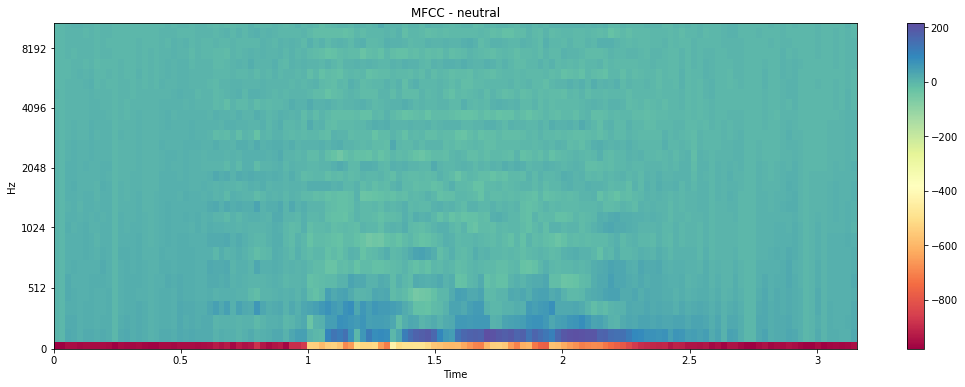


Shape of spectrogram: (30, 141)


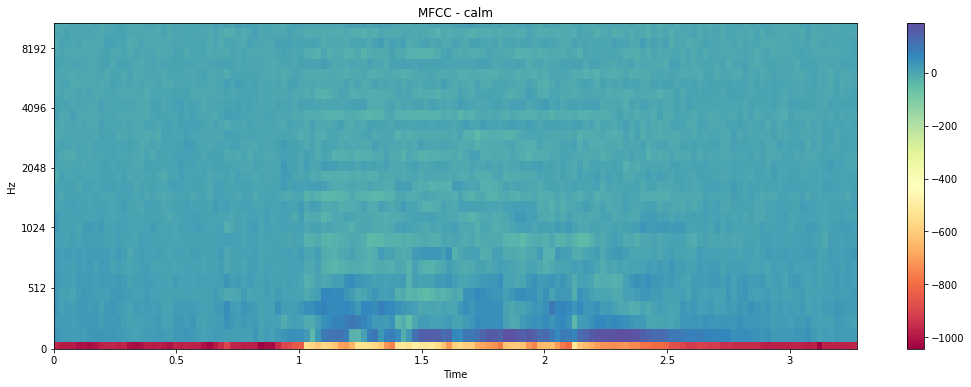


Shape of spectrogram: (30, 134)


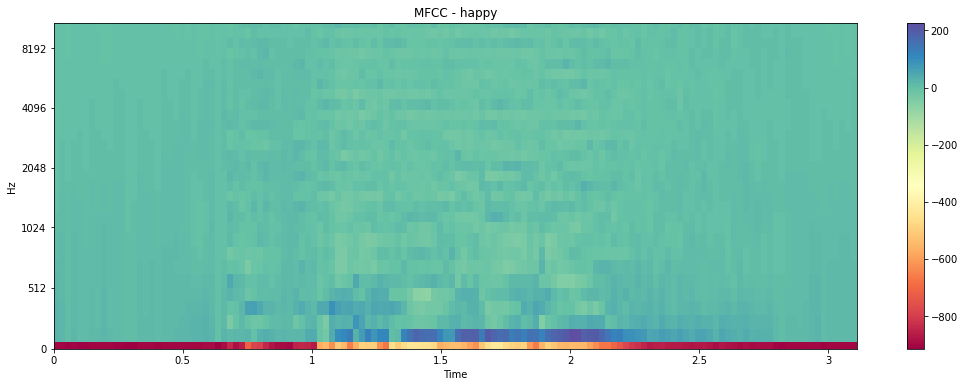


Shape of spectrogram: (30, 144)


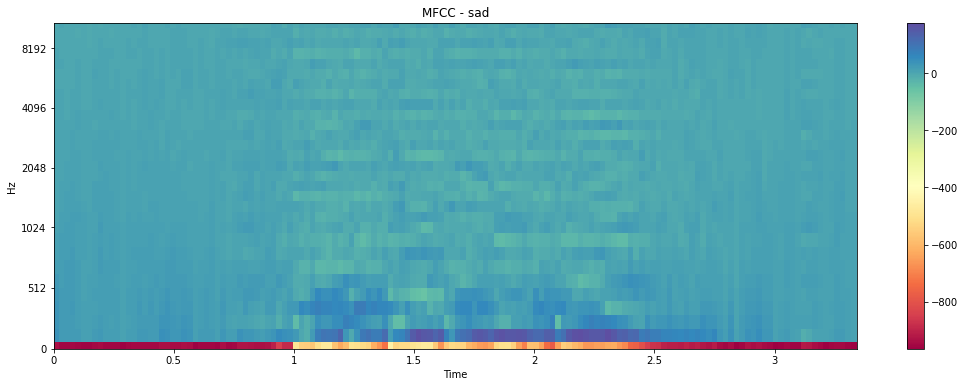


Shape of spectrogram: (30, 156)


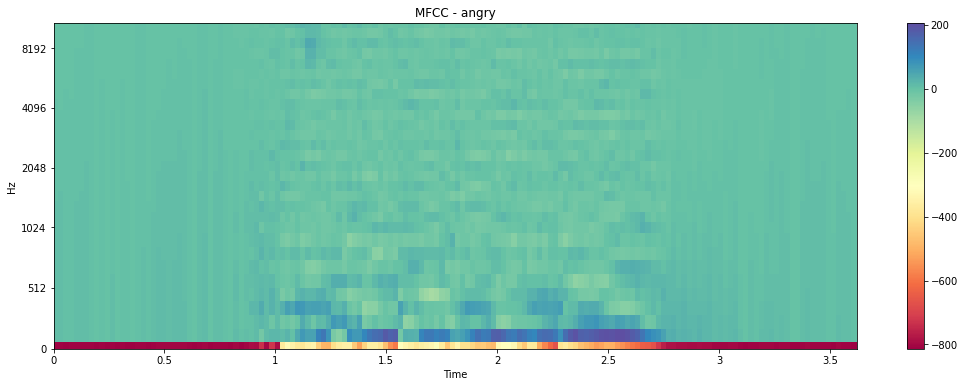


Shape of spectrogram: (30, 150)


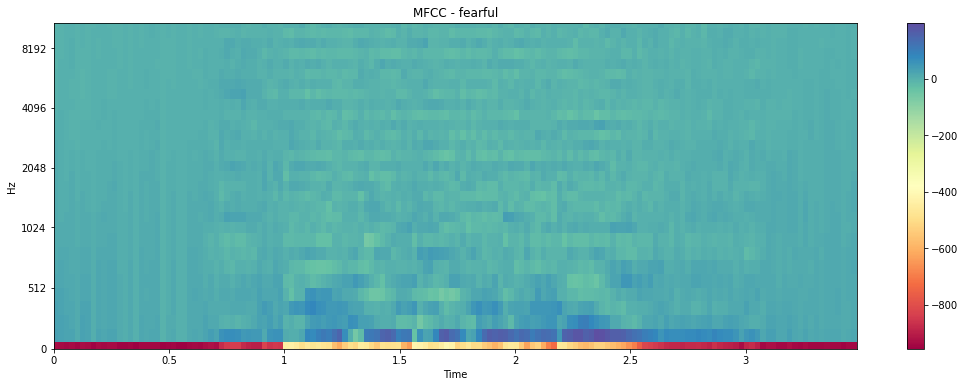


Shape of spectrogram: (30, 159)


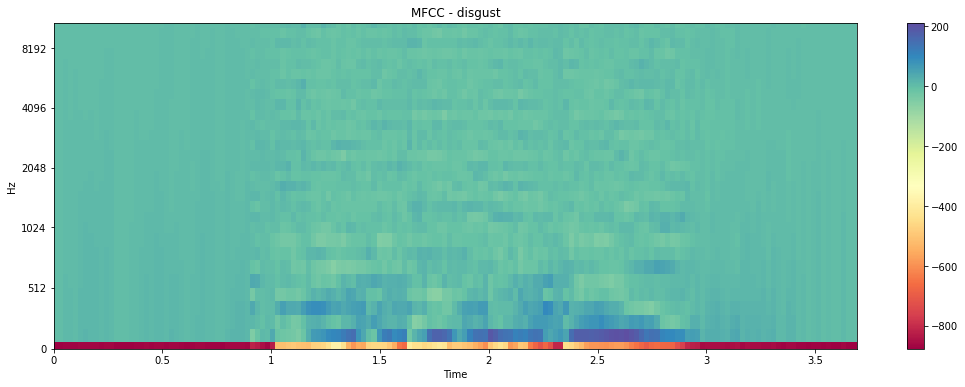


Shape of spectrogram: (30, 133)


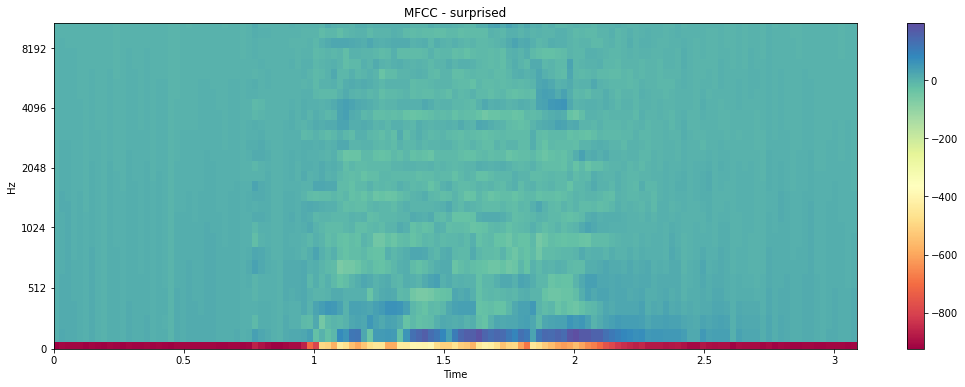

In [ ]:
# Transform example waveforms into a MFCC spectrograms and visualize the result:
for key, value in path_labels.items():
    signal, sr = librosa.load(key, sr=SAMPLE_RATE, duration=DURATION)
    mfcc = librosa.feature.mfcc(signal,
                                sr=SAMPLE_RATE,
                                n_fft=N_FFT,
                                hop_length=HOP_LEN,
                                win_length=WIN_LEN,
                                window=WINDOW,
                                n_mfcc=N_MFCC)

    print(f"\nShape of spectrogram: {mfcc.shape}")

    plt.figure(figsize=(18,6))
    librosa.display.specshow(mfcc, sr=SAMPLE_RATE, hop_length=HOP_LEN, x_axis='time', y_axis='mel', cmap='Spectral')
    plt.title(f'MFCC - {value}')
    plt.colorbar()
    plt.show()

MFCC features represent better distinctions in between various emotions in terms of loudness, the spread of emotions, and frequency ranges. This is the reason why MFCC features are best suited for acoustic modeling and are used widely in the research work.

**Inference from MFCC charts**

Emotions like calm and sad, which are having low amplitudes shows much more dark blue regions. These emotions are difficult to differentiate.

Emotions like angry and disgust, which are having large amplitudes shows much more light blue regions in MFCC spectral plot. These emotions are also difficult to differentiate.

Emotions like surprised and happy are impulsive and occurs for a shorter duration.

We are trying to make the model learn these key differences.


Shape of normalized spectrogram: (30, 136)


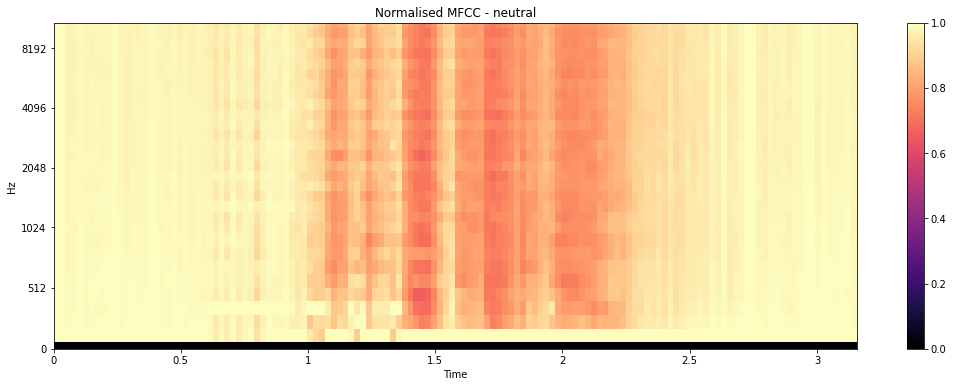


Shape of normalized spectrogram: (30, 141)


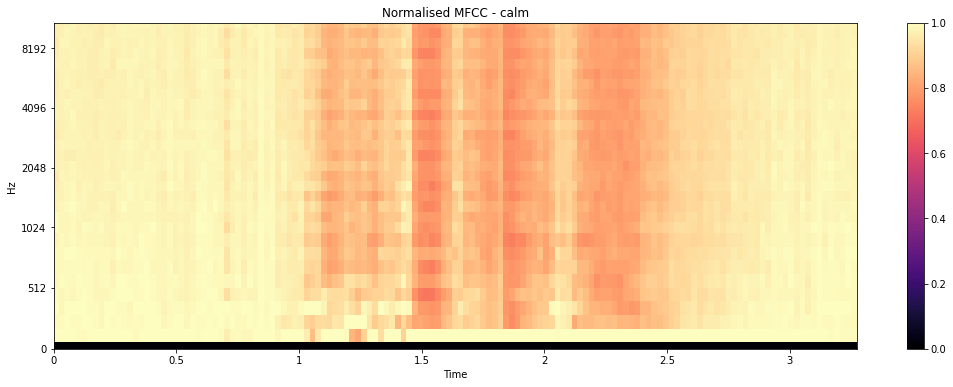


Shape of normalized spectrogram: (30, 134)


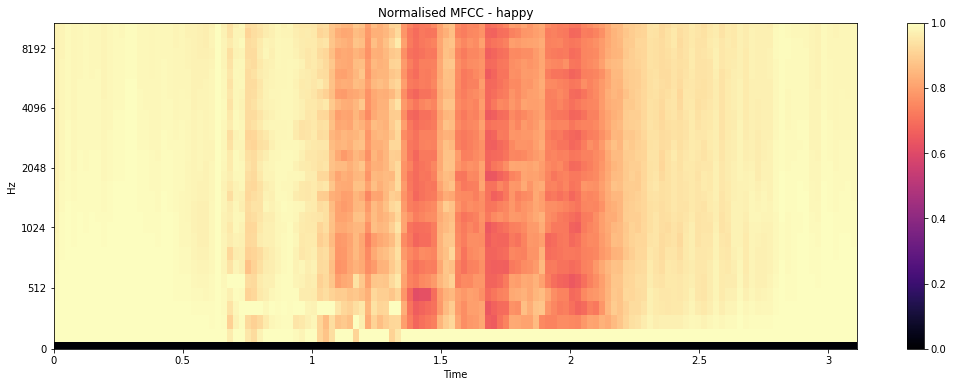


Shape of normalized spectrogram: (30, 144)


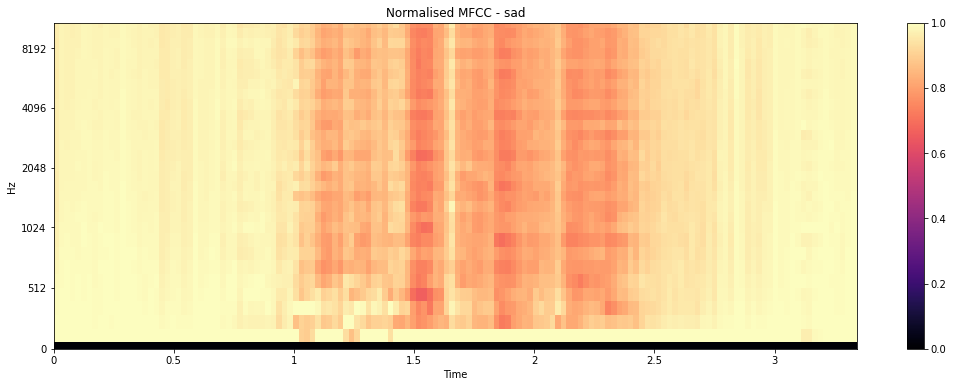


Shape of normalized spectrogram: (30, 156)


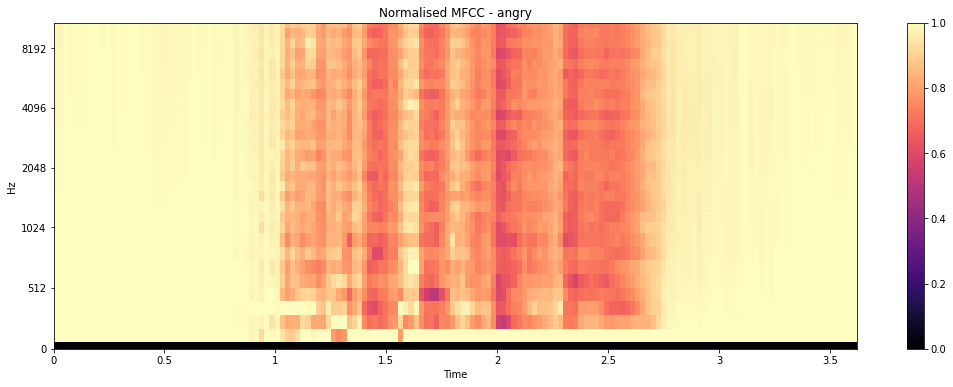


Shape of normalized spectrogram: (30, 150)


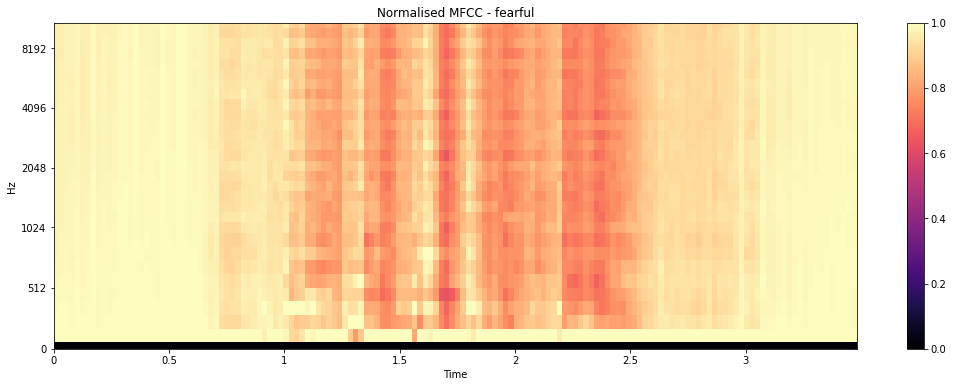


Shape of normalized spectrogram: (30, 159)


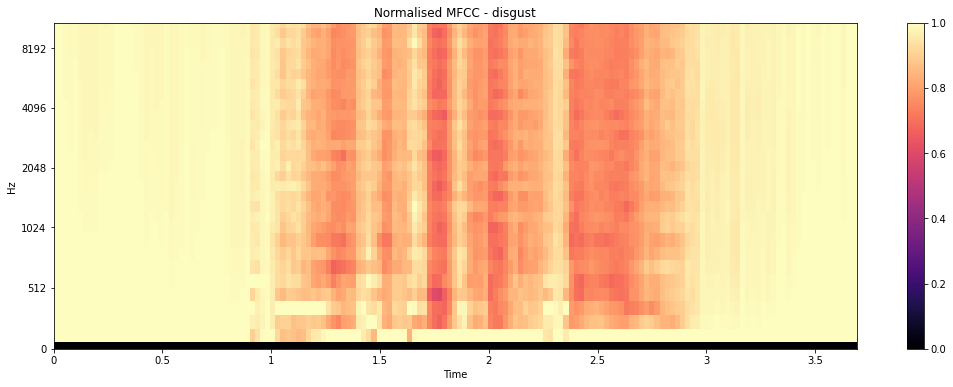


Shape of normalized spectrogram: (30, 133)


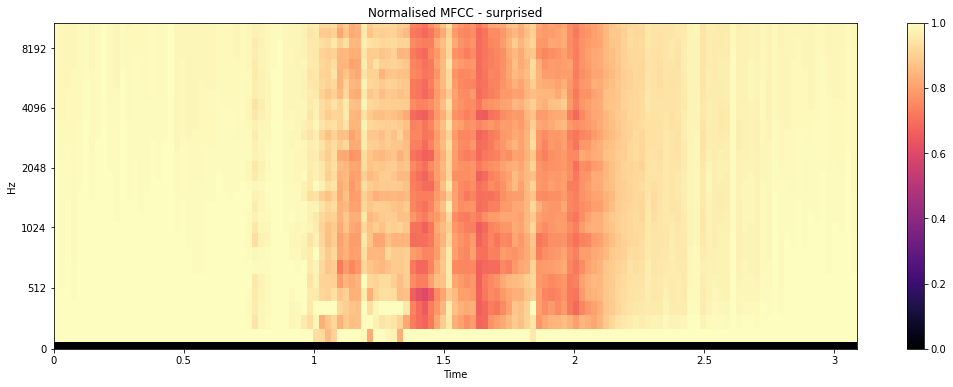

In [ ]:
# Transform example waveforms into a normalized MFCC spectrograms and visualize the result:
for key, value in path_labels.items():
    signal, sr = librosa.load(key, sr=SAMPLE_RATE, duration=DURATION)
    mfcc = librosa.feature.mfcc(signal,
                                sr=SAMPLE_RATE,
                                n_fft=N_FFT,
                                hop_length=HOP_LEN,
                                win_length=WIN_LEN,
                                window=WINDOW,
                                n_mfcc=N_MFCC)
    mfcc_norm = minmax_scale(mfcc, feature_range=(0,1), axis=0)
    print(f"\nShape of normalized spectrogram: {mfcc_norm.shape}")

    plt.figure(figsize=(18,6))
    librosa.display.specshow(mfcc_norm, sr=SAMPLE_RATE, hop_length=HOP_LEN, x_axis='time', y_axis='mel')
    plt.title(f'Normalised MFCC - {value}')
    plt.colorbar()
    plt.show()

#### Cromagram


Shape of chromagram: (12, 136)


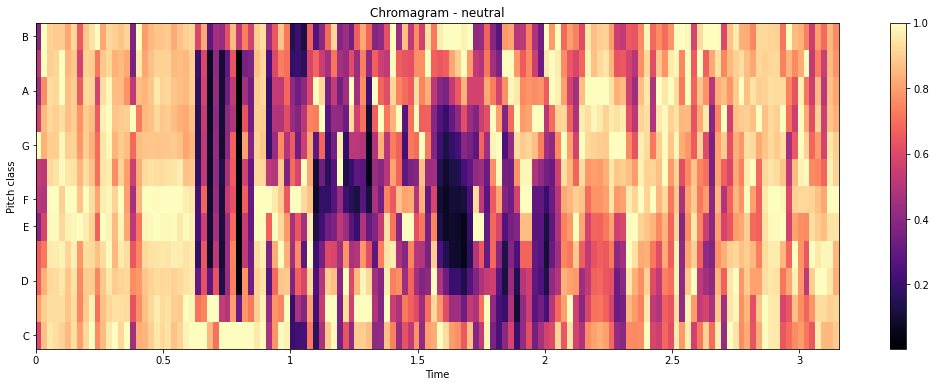


Shape of chromagram: (12, 141)


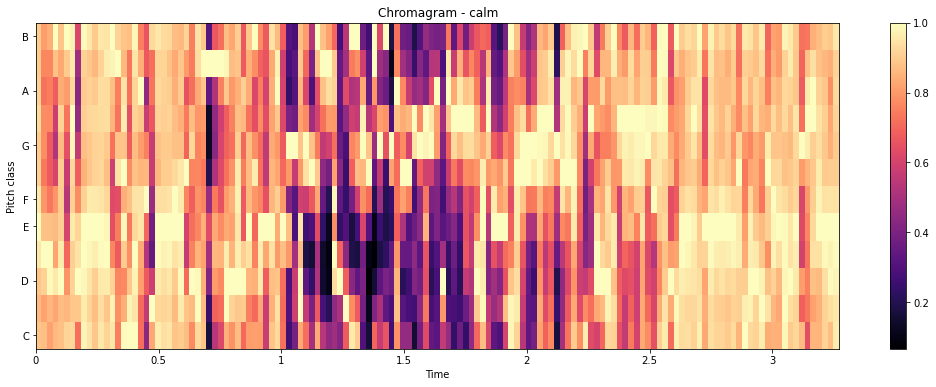


Shape of chromagram: (12, 134)


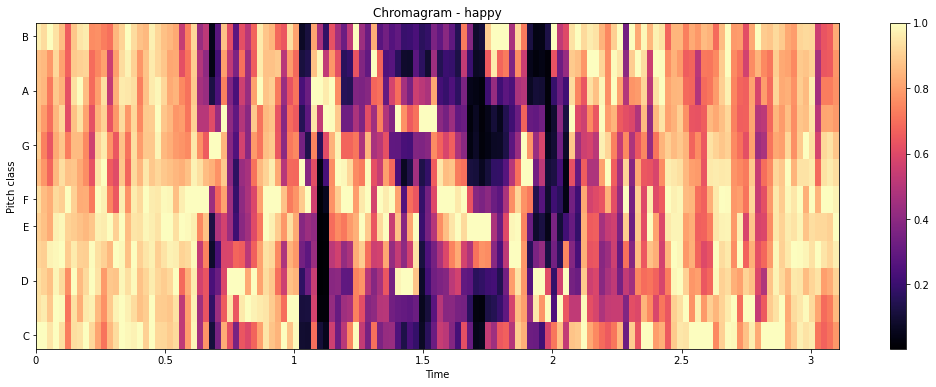


Shape of chromagram: (12, 144)


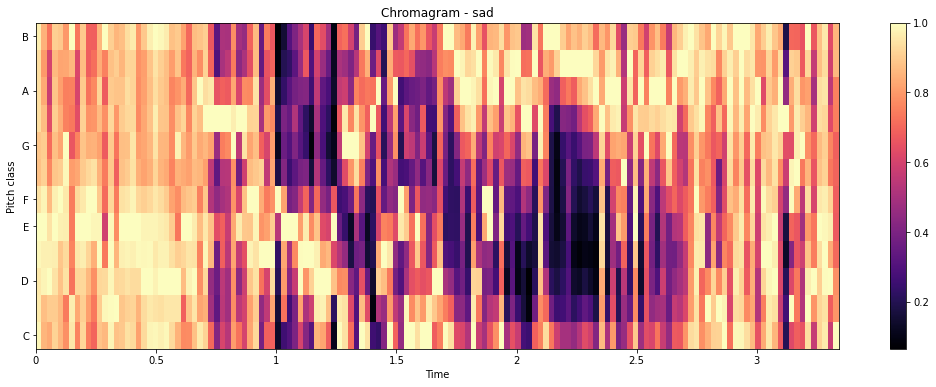


Shape of chromagram: (12, 156)


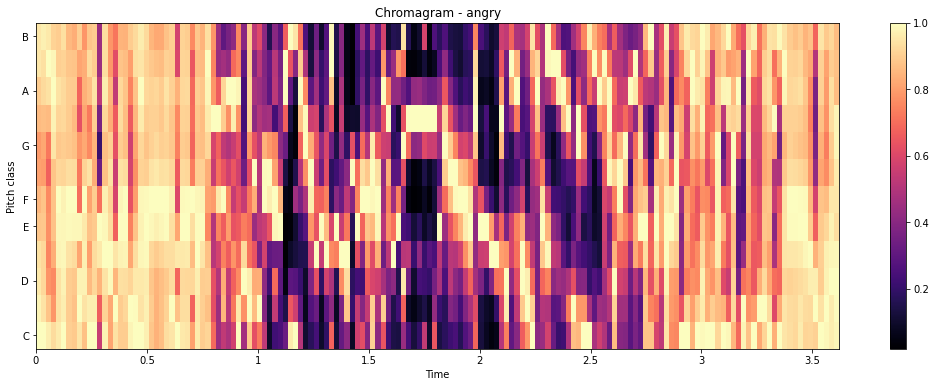


Shape of chromagram: (12, 150)


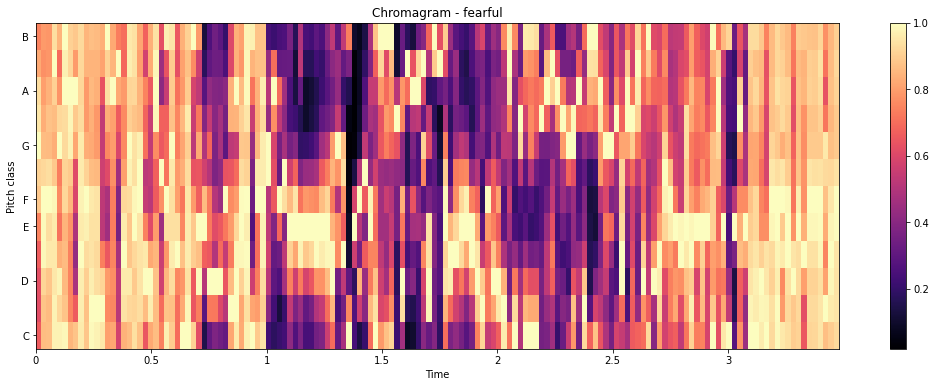


Shape of chromagram: (12, 159)


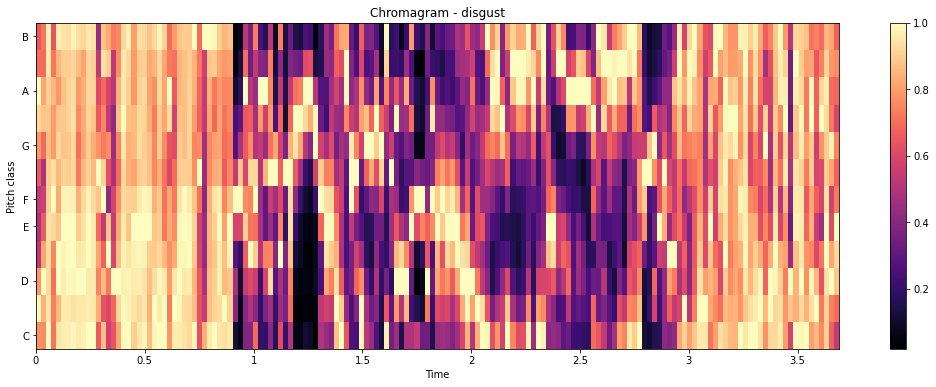


Shape of chromagram: (12, 133)


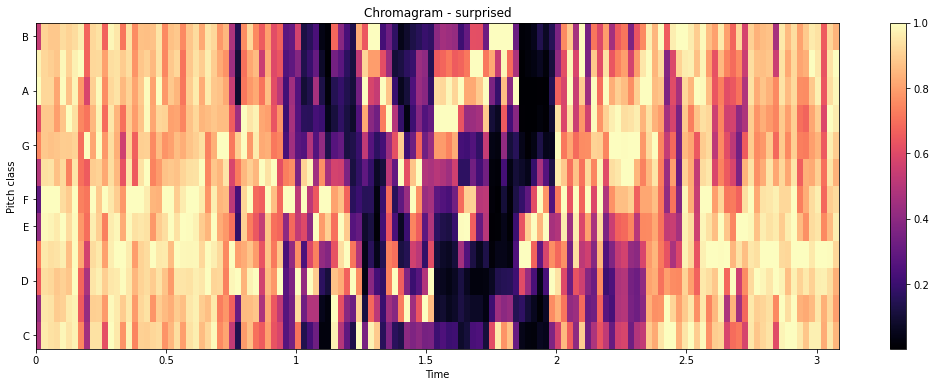

In [ ]:
# Transform example waveforms into a chromagrams and visualize the result:
for key, value in path_labels.items():
    signal, sr = librosa.load(key, sr=SAMPLE_RATE, duration=DURATION)    
    chroma = librosa.feature.chroma_stft(signal,
                                        sr=SAMPLE_RATE,
                                        n_fft=N_FFT,
                                        hop_length=HOP_LEN,
                                        win_length=WIN_LEN,
                                        window=WINDOW,
                                        n_chroma=N_CHROMA)

    print(f"\nShape of chromagram: {chroma.shape}")

    plt.figure(figsize=(18,6))
    librosa.display.specshow(chroma, sr=SAMPLE_RATE, hop_length=HOP_LEN, x_axis='time', y_axis='chroma')
    plt.title(f'Chromagram - {value}')
    plt.colorbar()
    plt.show()

#### Log Mel-scaled spectrogram


Shape of spectrogram: (13, 136)


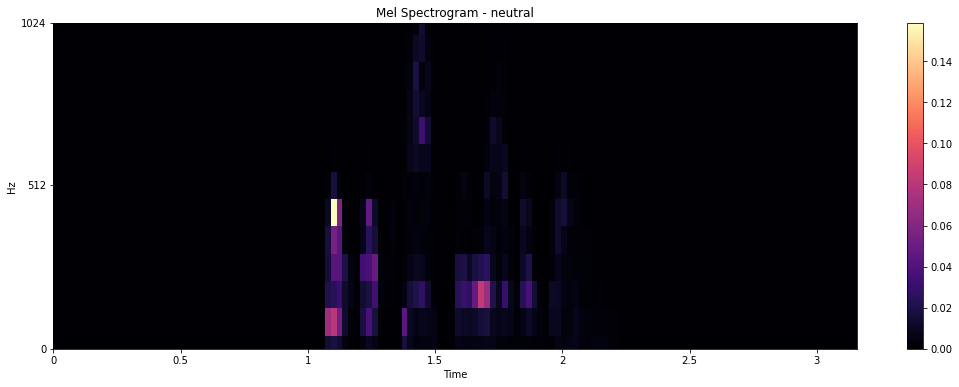


Shape of spectrogram: (13, 141)


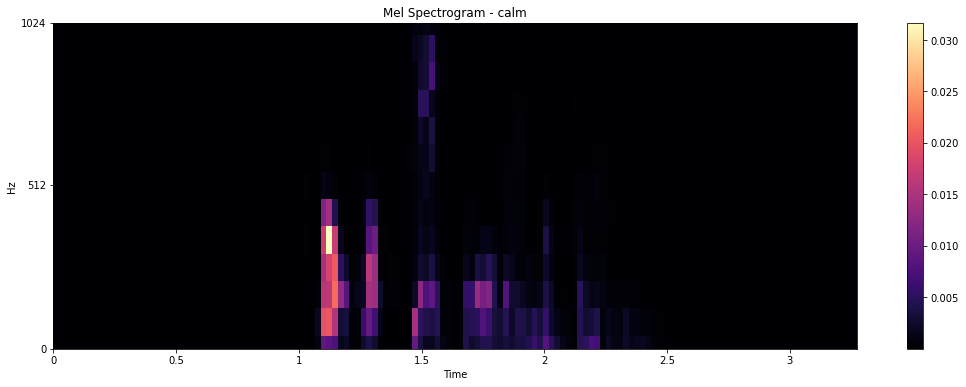


Shape of spectrogram: (13, 134)


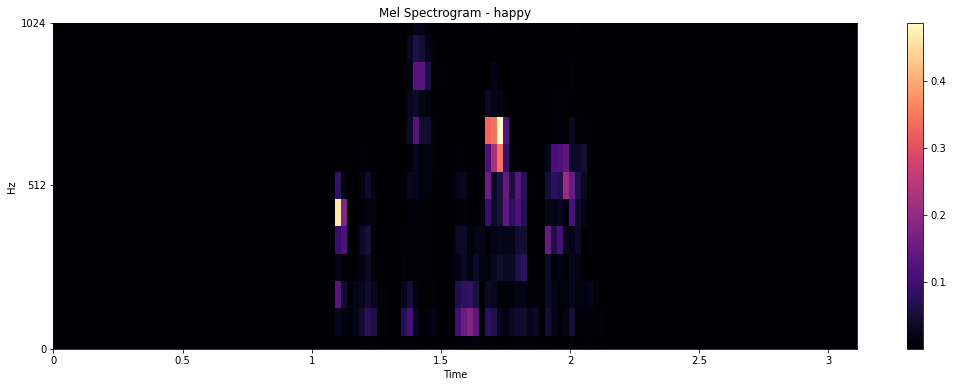


Shape of spectrogram: (13, 144)


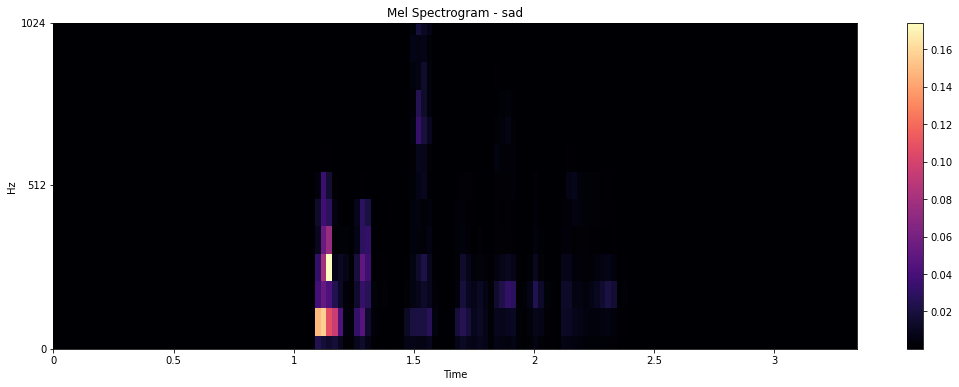


Shape of spectrogram: (13, 156)


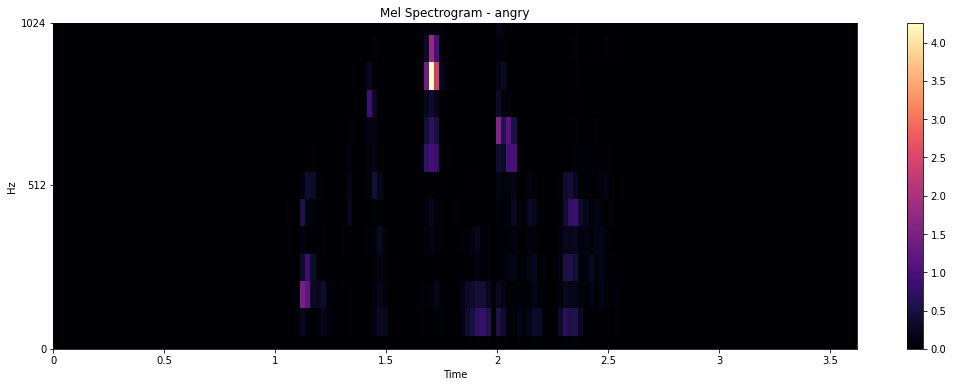


Shape of spectrogram: (13, 150)


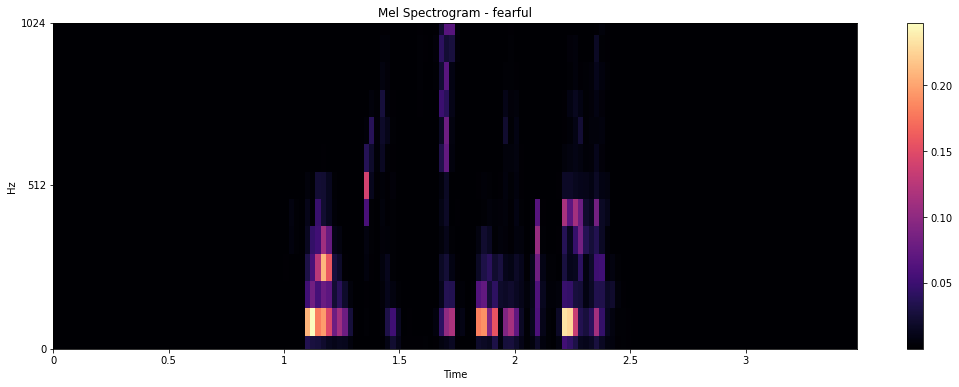


Shape of spectrogram: (13, 159)


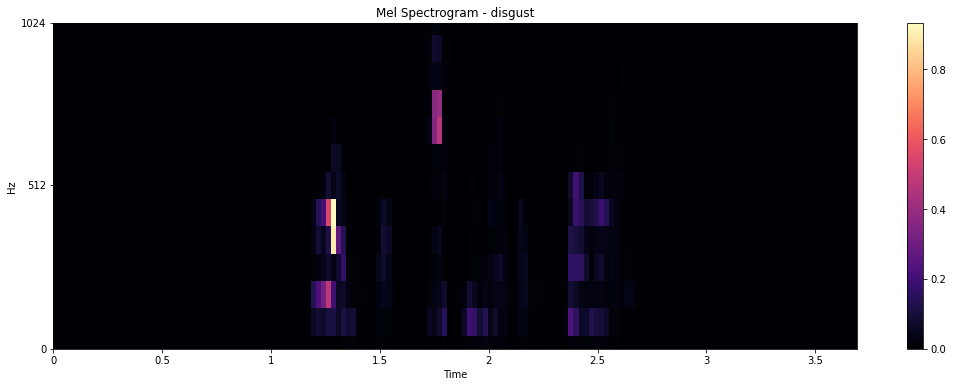


Shape of spectrogram: (13, 133)


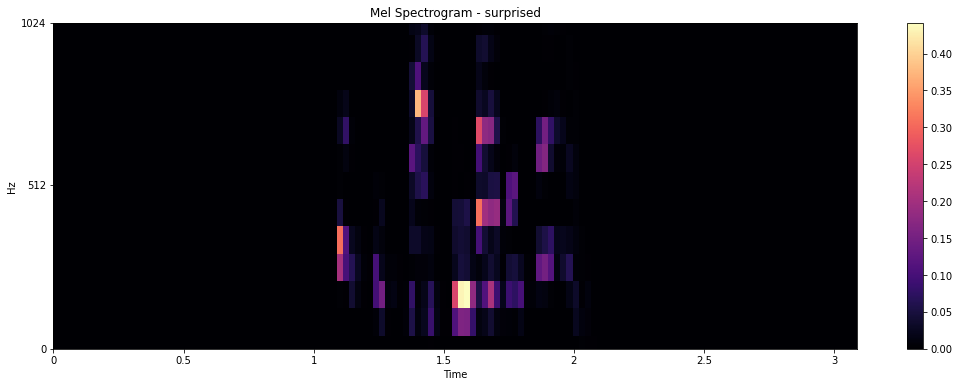

In [ ]:
# Transform example waveforms into a mel-scaled spectrograms and visualize the result:
for key, value in path_labels.items():
    signal, sr = librosa.load(key, sr=SAMPLE_RATE, duration=DURATION)    
    mel_spectrogram = librosa.feature.melspectrogram(signal,
                            sr=SAMPLE_RATE,
                            n_fft=N_FFT,
                            hop_length=HOP_LEN,
                            win_length=WIN_LEN,
                            window=WINDOW,
                            n_mels=N_MELS,
                            fmax=FMAX)

    print(f"\nShape of spectrogram: {mel_spectrogram.shape}")

    plt.figure(figsize=(18,6))
    librosa.display.specshow(mel_spectrogram, sr=SAMPLE_RATE, hop_length=HOP_LEN, x_axis='time', y_axis='mel', fmax=FMAX)
    plt.title(f'Mel Spectrogram - {value}')
    plt.colorbar()
    plt.show()


Shape of normalized mel spectrogram: (13, 136)


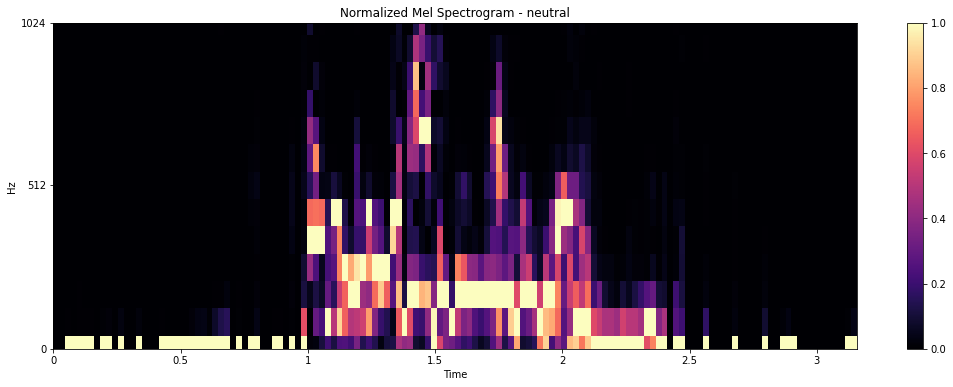


Shape of normalized mel spectrogram: (13, 141)


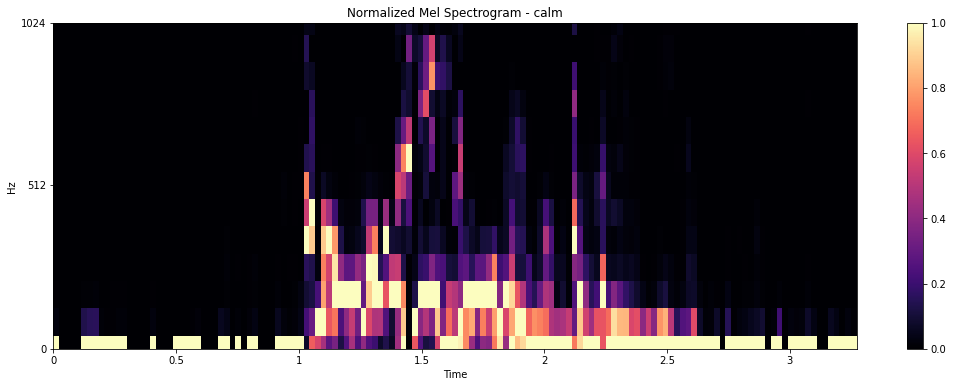


Shape of normalized mel spectrogram: (13, 134)


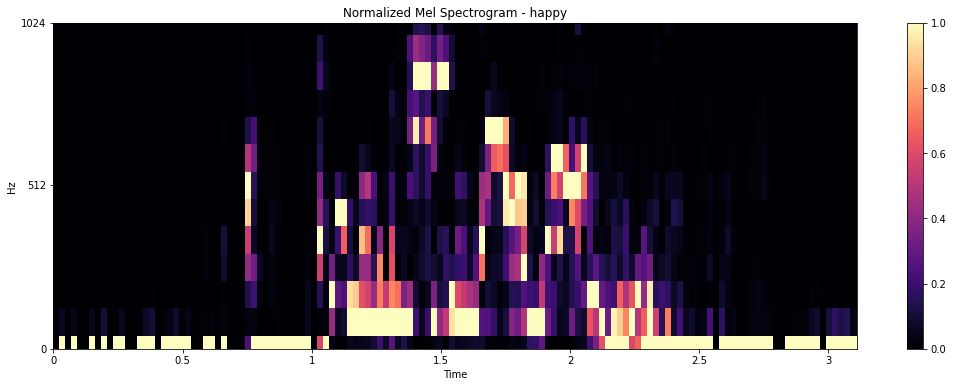


Shape of normalized mel spectrogram: (13, 144)


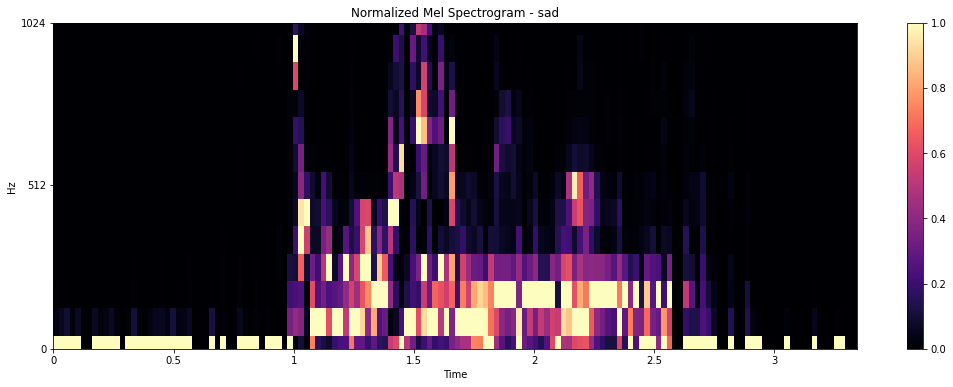


Shape of normalized mel spectrogram: (13, 156)


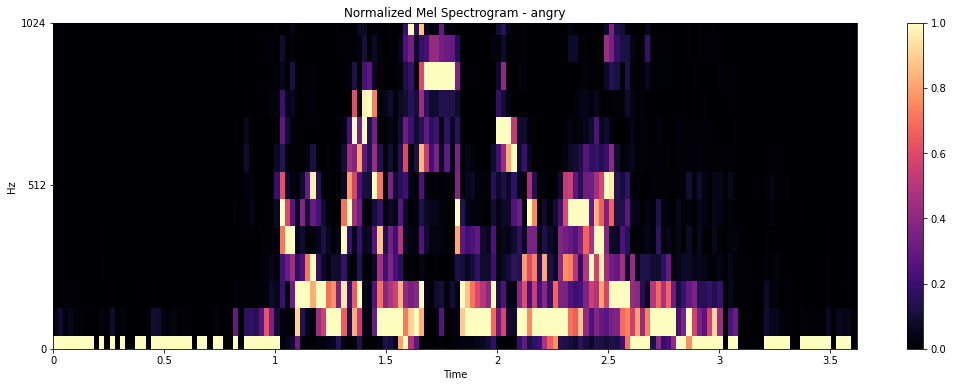


Shape of normalized mel spectrogram: (13, 150)


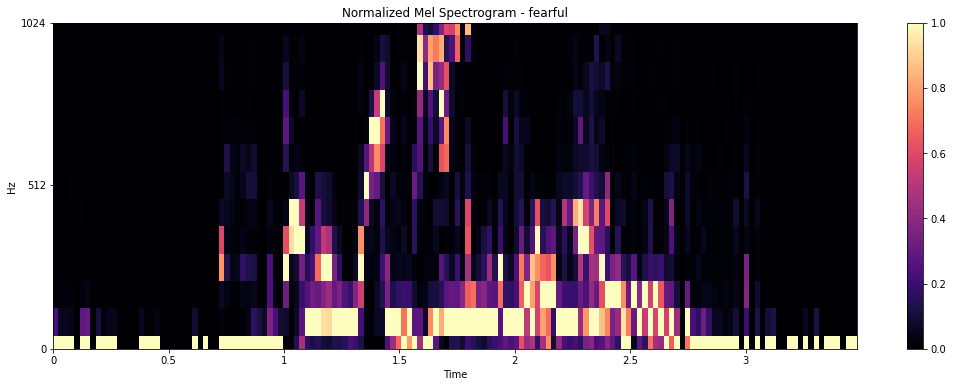


Shape of normalized mel spectrogram: (13, 159)


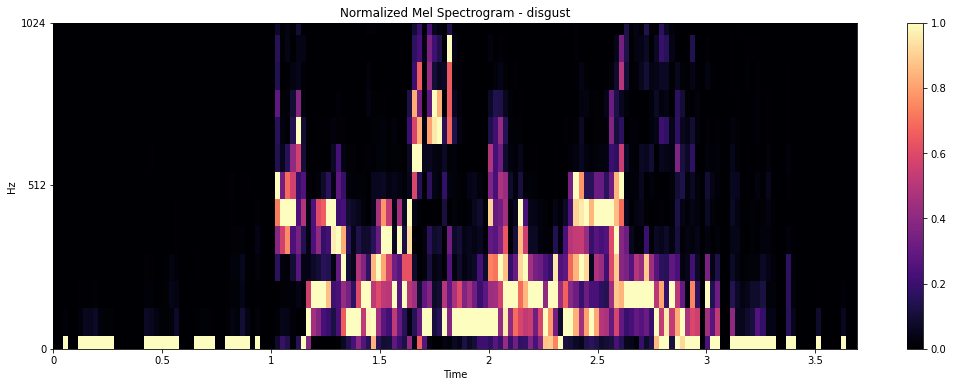


Shape of normalized mel spectrogram: (13, 133)


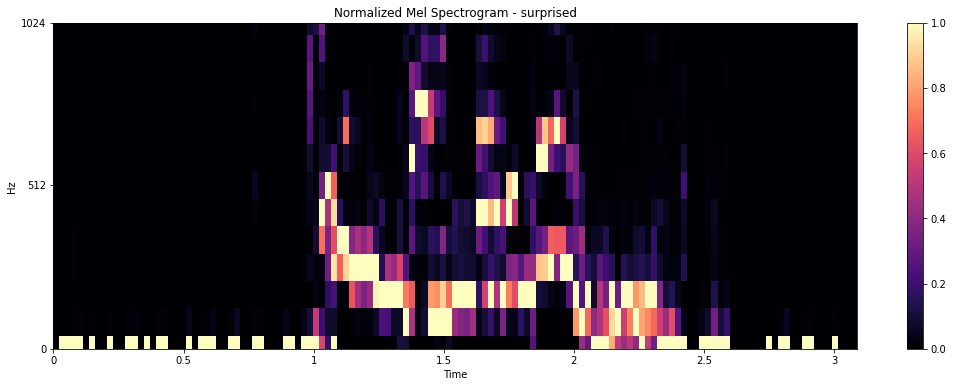

In [ ]:
# Transform example waveforms into a normalized mel-scaled spectrograms and visualize the result:
for key, value in path_labels.items():
    signal, sr = librosa.load(key, sr=SAMPLE_RATE, duration=DURATION)   
    mel_spectrogram = librosa.feature.melspectrogram(signal,
                            sr=SAMPLE_RATE,
                            n_fft=N_FFT,
                            hop_length=HOP_LEN,
                            win_length=WIN_LEN,
                            window=WINDOW,
                            n_mels=N_MELS,
                            fmax=FMAX)
    mel_spectrogram_norm = minmax_scale(mel_spectrogram, feature_range=(0,1), axis=0)
    print(f"\nShape of normalized mel spectrogram: {mel_spectrogram_norm.shape}")

    plt.figure(figsize=(18,6))
    librosa.display.specshow(mel_spectrogram_norm, sr=SAMPLE_RATE, hop_length=HOP_LEN, x_axis='time', y_axis='mel', fmax=FMAX)
    plt.title(f'Normalized Mel Spectrogram - {value}')
    plt.colorbar()
    plt.show()


Shape of Log Mel spectrogram: (13, 136)


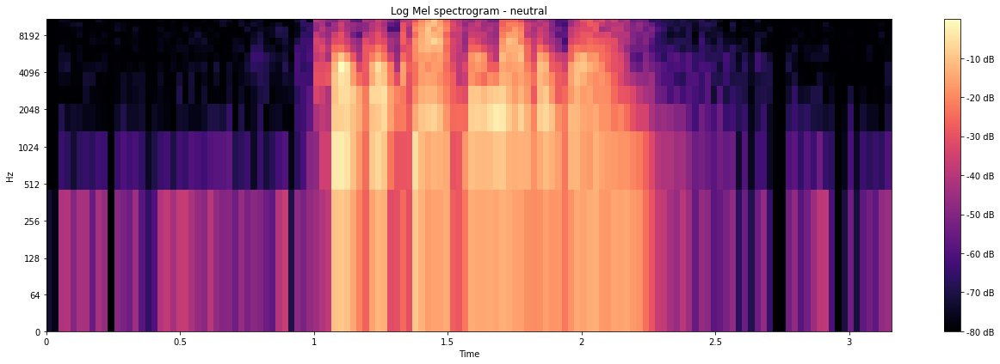


Shape of Log Mel spectrogram: (13, 141)


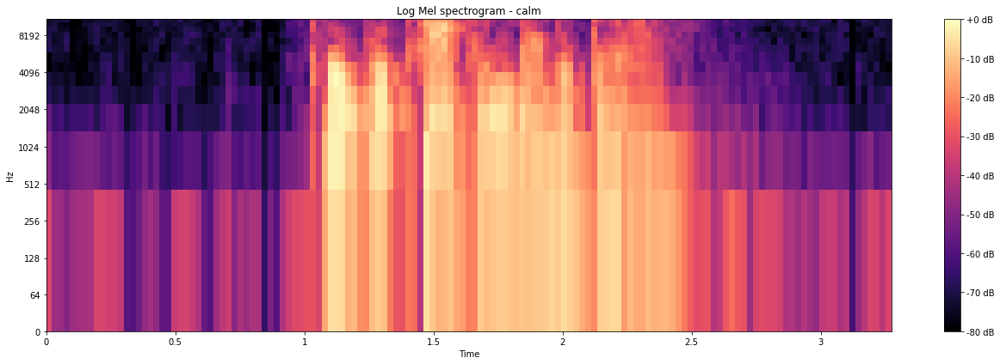


Shape of Log Mel spectrogram: (13, 134)


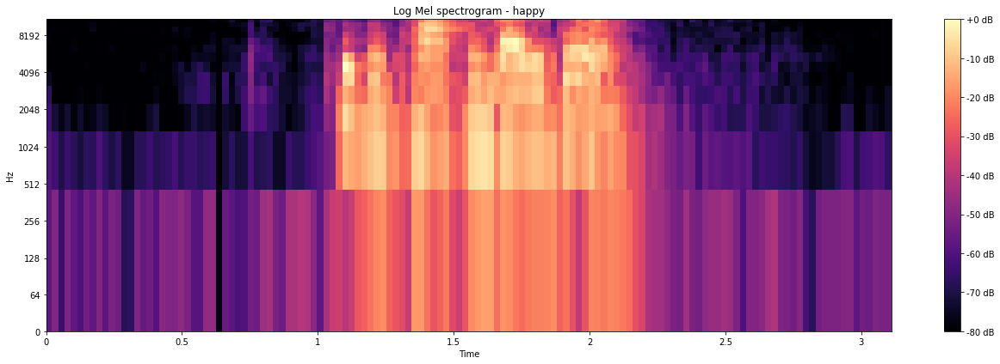


Shape of Log Mel spectrogram: (13, 144)


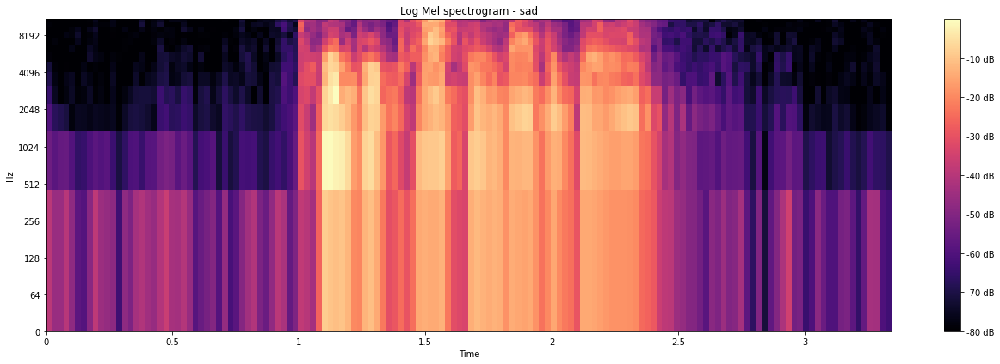


Shape of Log Mel spectrogram: (13, 156)


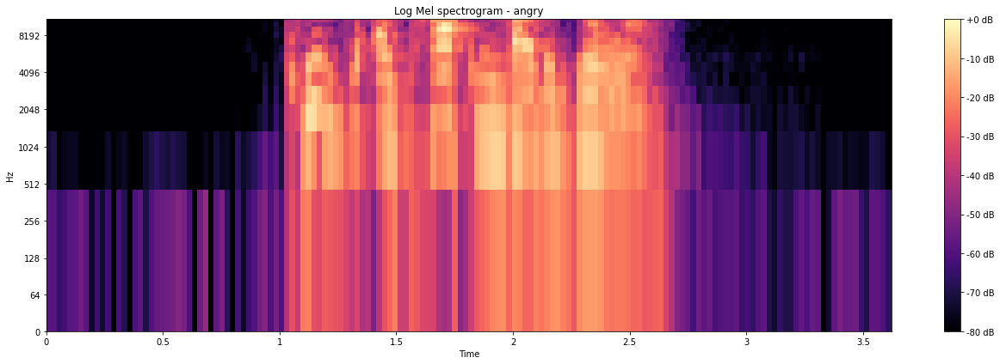


Shape of Log Mel spectrogram: (13, 150)


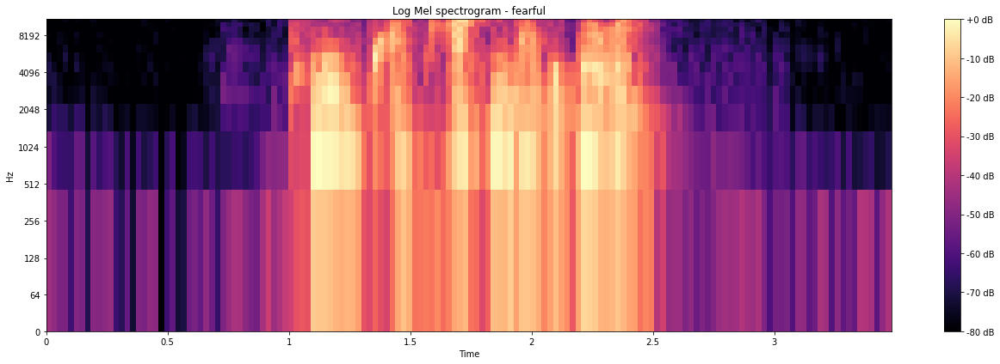


Shape of Log Mel spectrogram: (13, 159)


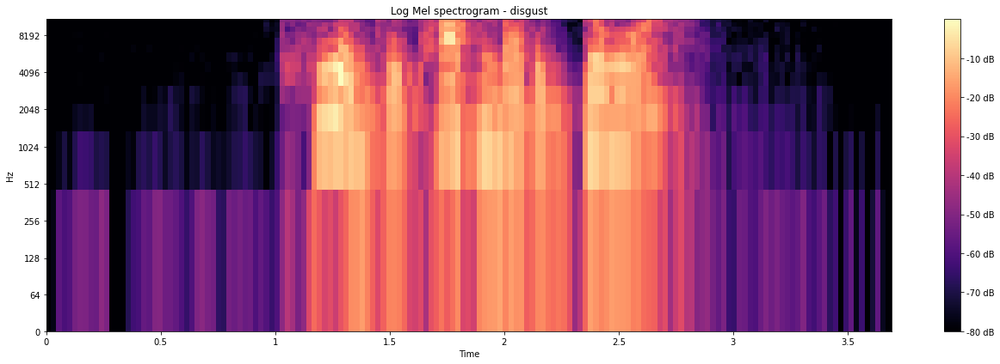


Shape of Log Mel spectrogram: (13, 133)


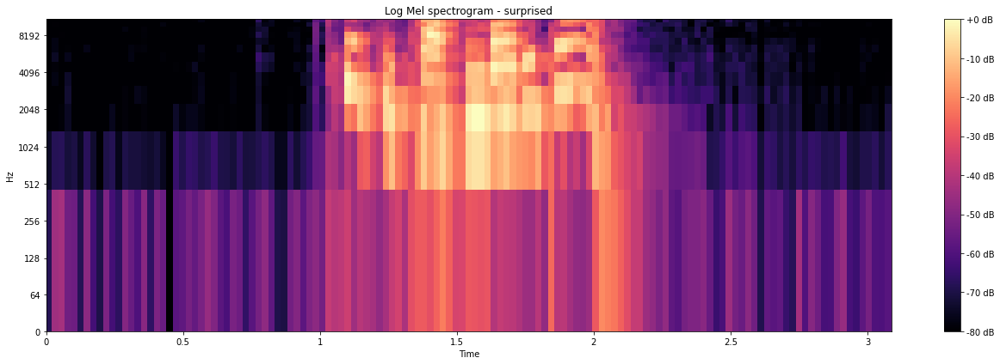

In [ ]:
# Transform example waveforms into log mel-scaled spectrograms and visualize the result:
for key, value in path_labels.items():
    signal, sr = librosa.load(key, sr=SAMPLE_RATE, duration=DURATION)   
    mel_spectrogram = librosa.feature.melspectrogram(signal,
                                                    sr=SAMPLE_RATE,
                                                    n_fft=N_FFT,
                                                    hop_length=HOP_LEN,
                                                    win_length=WIN_LEN,
                                                    window=WINDOW,
                                                    n_mels=N_MELS,
                                                    fmax=FMAX)
    mel_spectrogram_db = librosa.power_to_db(mel_spectrogram, ref=np.max)
    print(f"\nShape of Log Mel spectrogram: {mel_spectrogram_db.shape}")

    plt.figure(figsize=(18,6))
    librosa.display.specshow(mel_spectrogram_db, sr=sr, x_axis='time', y_axis='log',hop_length=HOP_LEN, fmax=FMAX)
    plt.colorbar(format="%+2.f dB")
    plt.title(f'Log Mel spectrogram - {value}')
    plt.tight_layout()
    plt.show()


Shape of normalized log mel spectrogram: (13, 136)


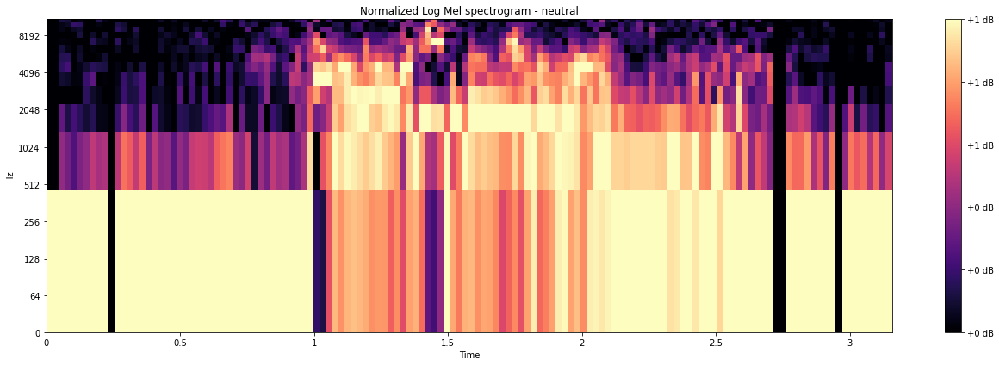


Shape of normalized log mel spectrogram: (13, 141)


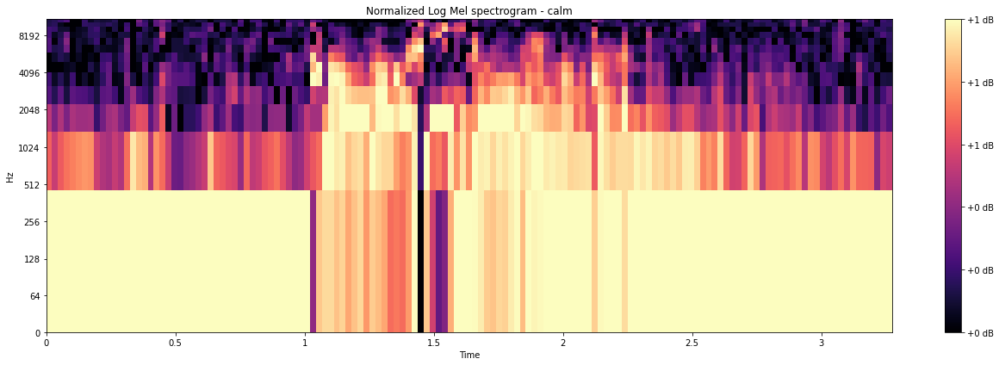


Shape of normalized log mel spectrogram: (13, 134)


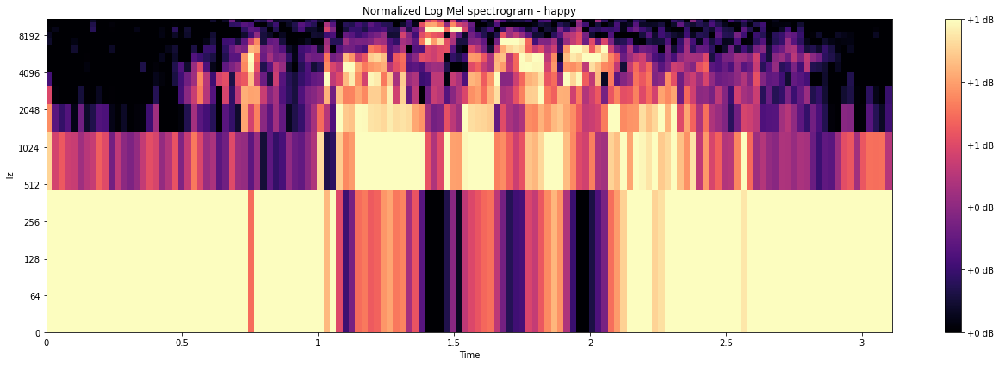


Shape of normalized log mel spectrogram: (13, 144)


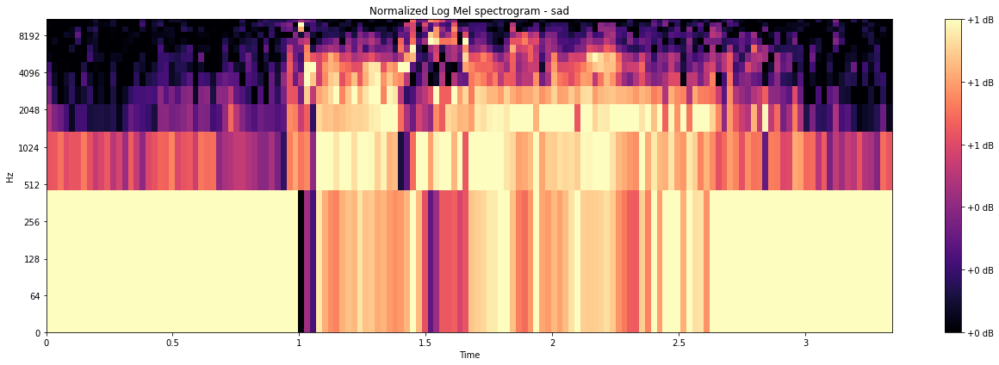


Shape of normalized log mel spectrogram: (13, 156)


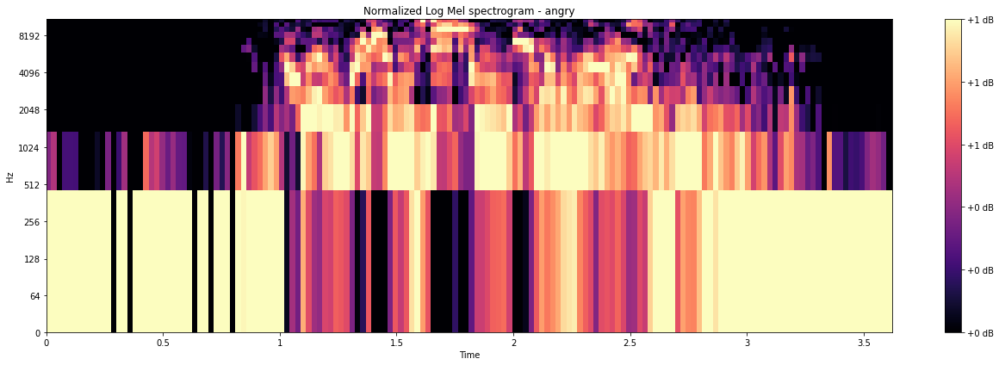


Shape of normalized log mel spectrogram: (13, 150)


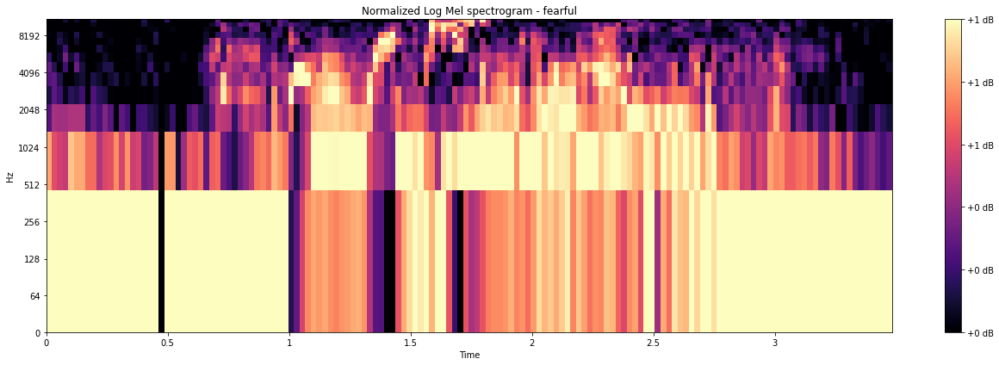


Shape of normalized log mel spectrogram: (13, 159)


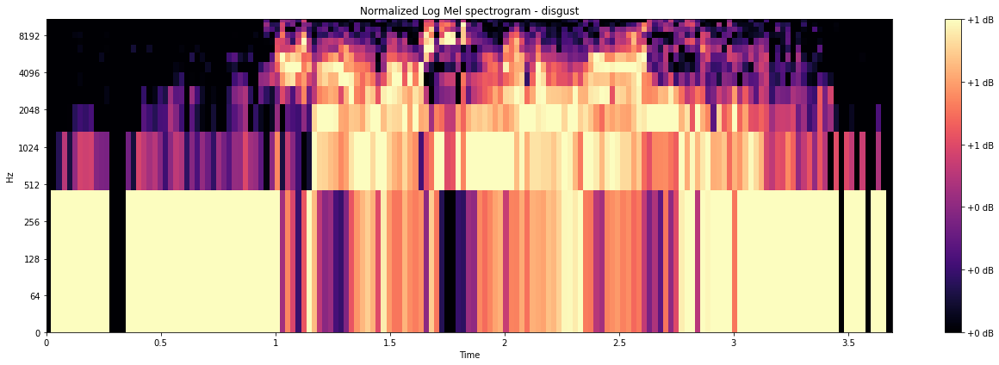


Shape of normalized log mel spectrogram: (13, 133)


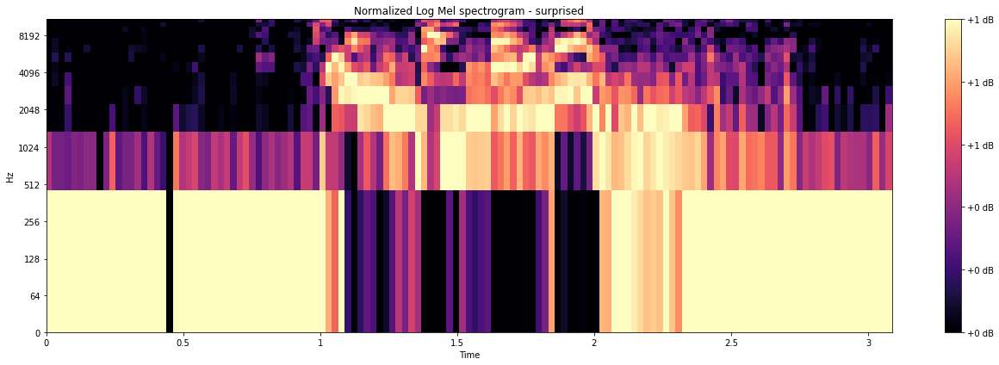

In [ ]:
# Transform example waveforms into normalized log mel-scaled spectrograms and visualize the result:
for key, value in path_labels.items():
    signal, sr = librosa.load(key, sr=SAMPLE_RATE, duration=DURATION)   
    mel_spectrogram = librosa.feature.melspectrogram(signal,
                                                    sr=SAMPLE_RATE,
                                                    n_fft=N_FFT,
                                                    hop_length=HOP_LEN,
                                                    win_length=WIN_LEN,
                                                    window=WINDOW,
                                                    n_mels=N_MELS,
                                                    fmax=FMAX)
    mel_spectrogram_db = librosa.power_to_db(mel_spectrogram, ref=np.max)
    mel_spectrogram_db_norm = minmax_scale(mel_spectrogram_db, feature_range=(0,1), axis=0)
    print(f"\nShape of normalized log mel spectrogram: {mel_spectrogram_db_norm.shape}")

    plt.figure(figsize=(18,6))
    librosa.display.specshow(mel_spectrogram_db_norm, sr=sr, x_axis='time', y_axis='log',hop_length=HOP_LEN, fmax=FMAX)
    plt.colorbar(format="%+2.f dB")
    plt.title(f'Normalized Log Mel spectrogram - {value}')
    plt.tight_layout()
    plt.show()

#### Spectral Contrast


Shape of spectral contrast: (7, 136)


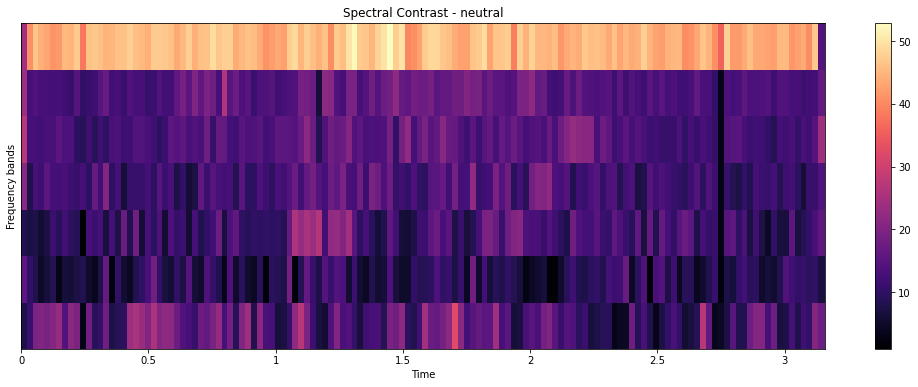


Shape of spectral contrast: (7, 141)


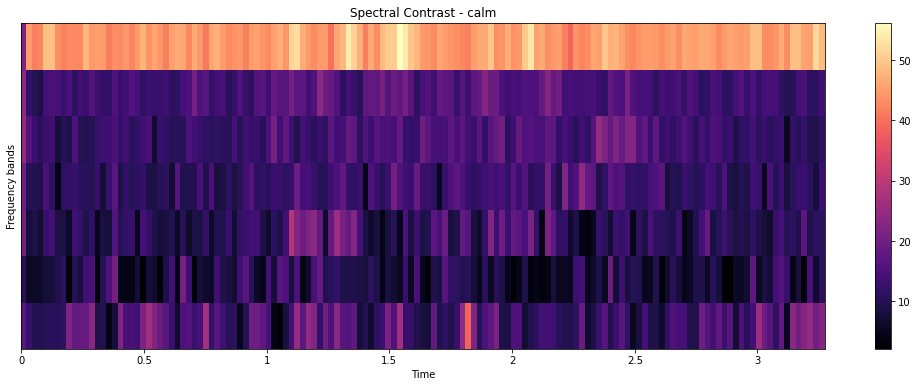


Shape of spectral contrast: (7, 134)


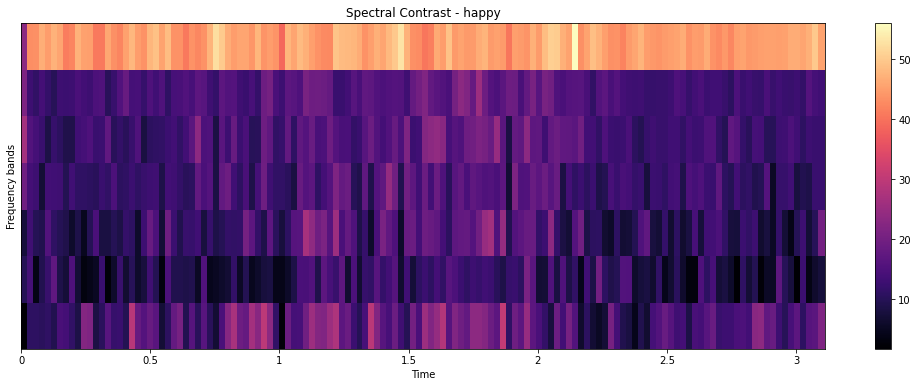


Shape of spectral contrast: (7, 144)


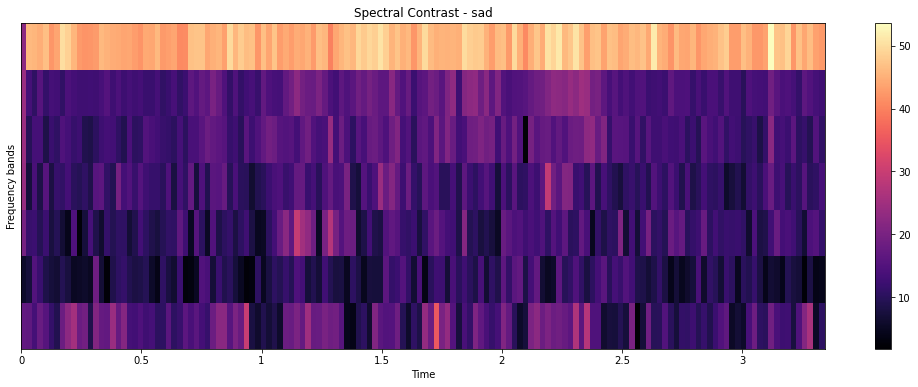


Shape of spectral contrast: (7, 156)


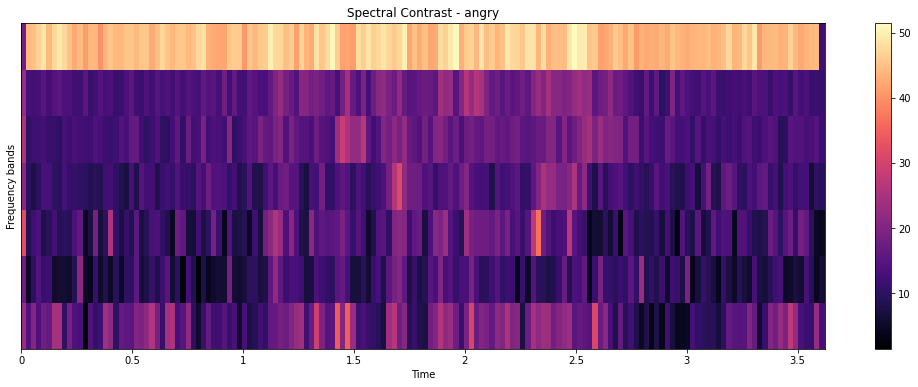


Shape of spectral contrast: (7, 150)


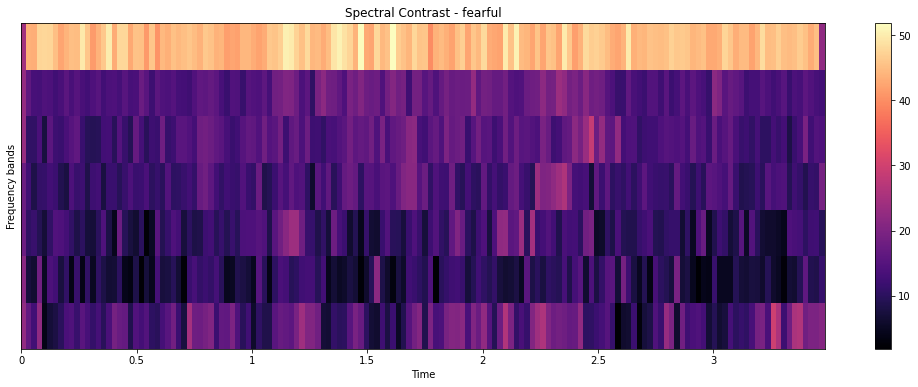


Shape of spectral contrast: (7, 159)


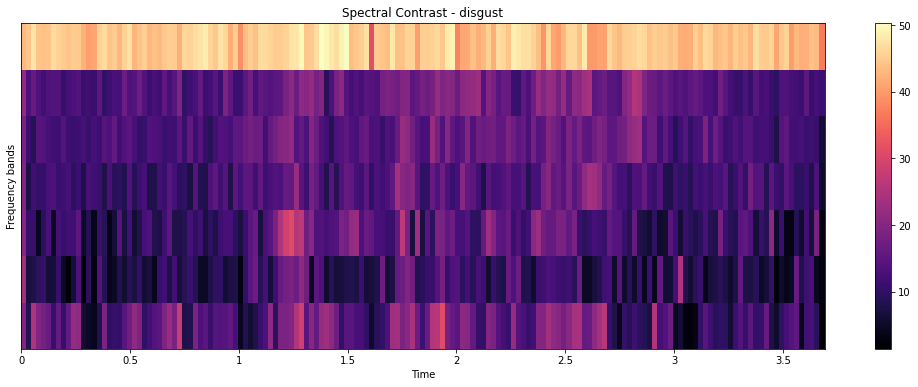


Shape of spectral contrast: (7, 133)


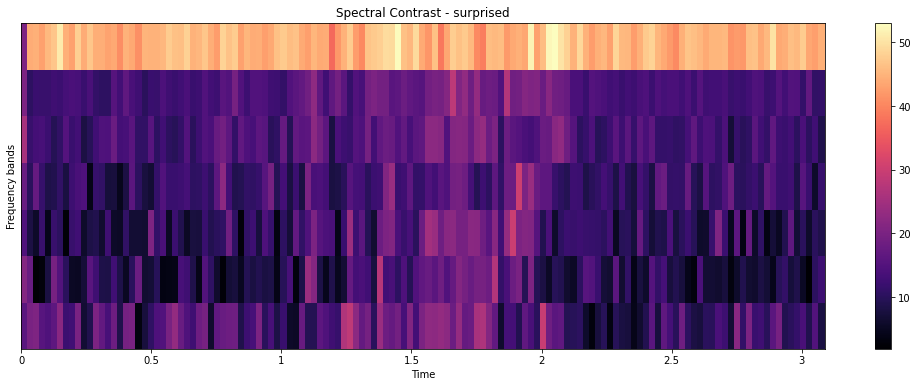

In [ ]:
# Transform example waveforms into spectral contrast spectrograms and visualize the result:
for key, value in path_labels.items():
    signal, sr = librosa.load(key, sr=SAMPLE_RATE, duration=DURATION)
    contrast = librosa.feature.spectral_contrast(signal,
                                             sr=SAMPLE_RATE,
                                             n_fft=N_FFT,
                                             hop_length=HOP_LEN,
                                             win_length=WIN_LEN,
                                             window=WINDOW,
                                             n_bands=N_BANDS)

    print(f"\nShape of spectral contrast: {contrast.shape}")

    plt.figure(figsize=(18,6))
    librosa.display.specshow(contrast, sr=SAMPLE_RATE, hop_length=HOP_LEN, x_axis='time')   # y_axis='chroma'
    plt.ylabel('Frequency bands')
    plt.title(f'Spectral Contrast - {value}')
    plt.colorbar()
    plt.show()


Shape of normalized contrast: (7, 136)


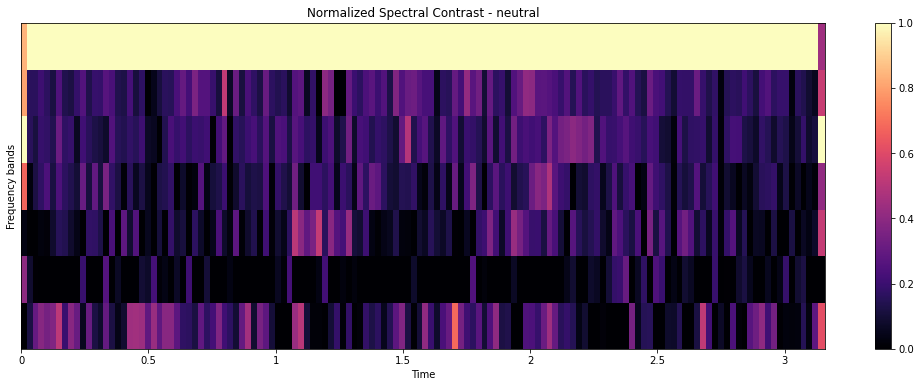


Shape of normalized contrast: (7, 141)


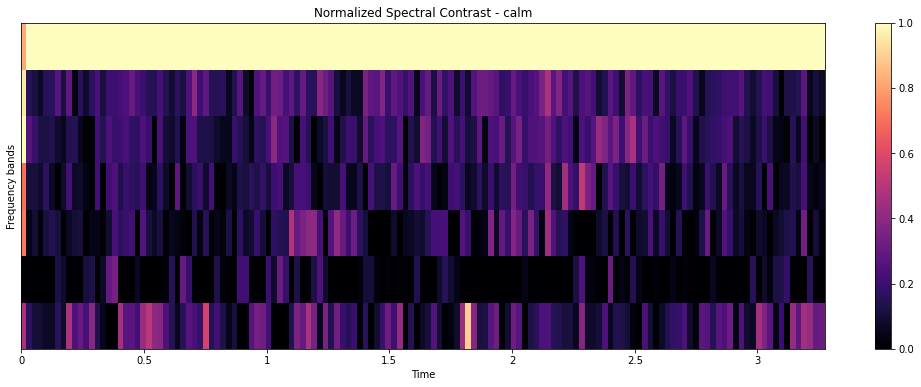


Shape of normalized contrast: (7, 134)


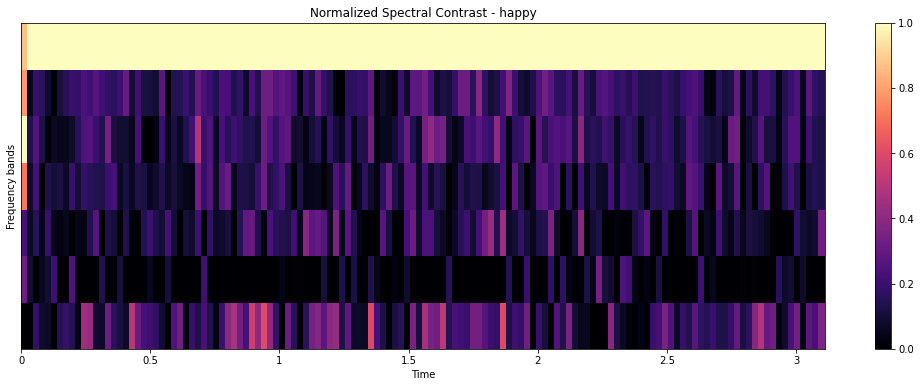


Shape of normalized contrast: (7, 144)


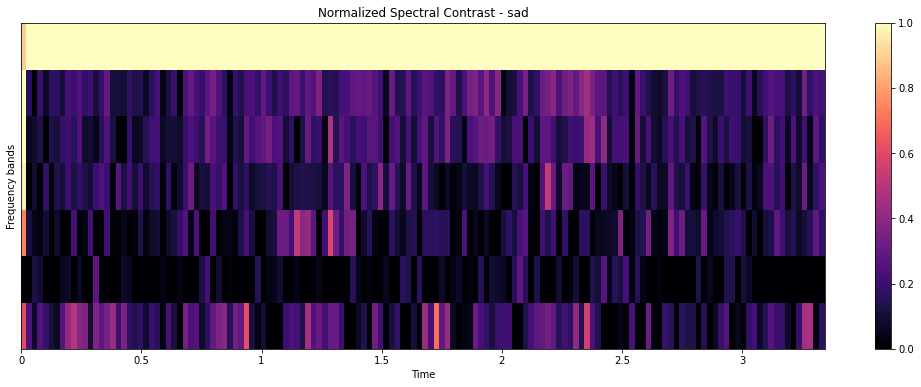


Shape of normalized contrast: (7, 156)


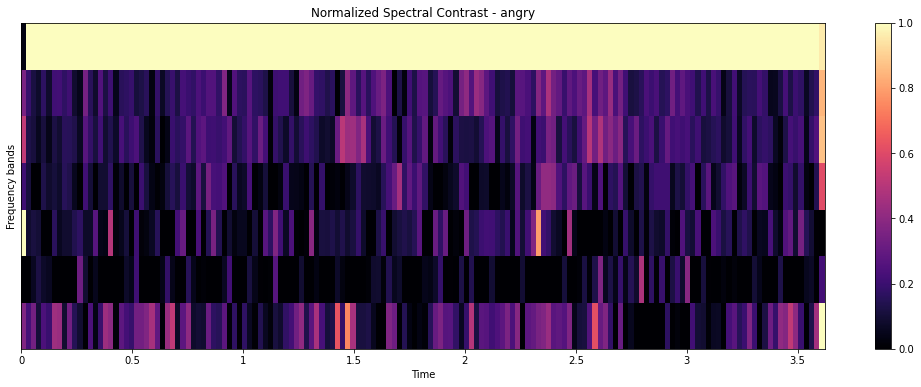


Shape of normalized contrast: (7, 150)


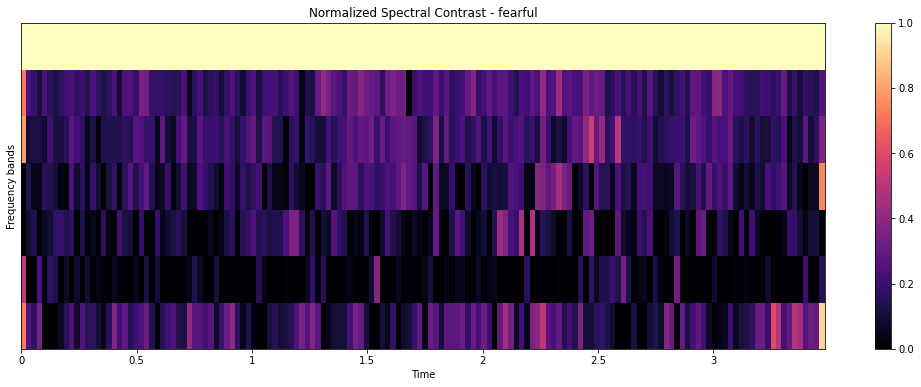


Shape of normalized contrast: (7, 159)


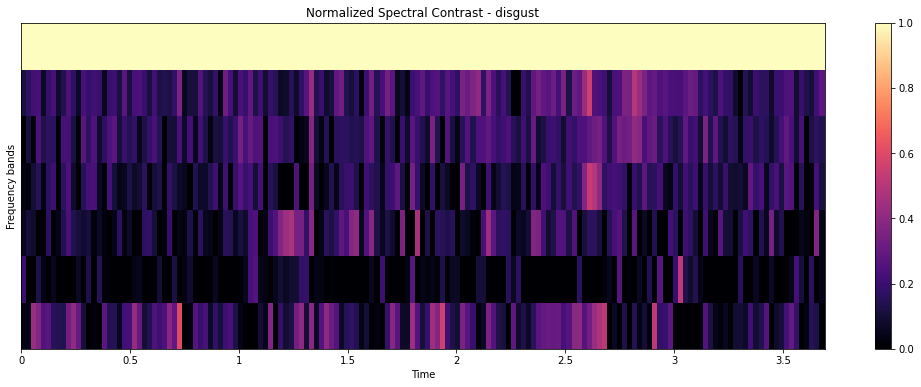


Shape of normalized contrast: (7, 133)


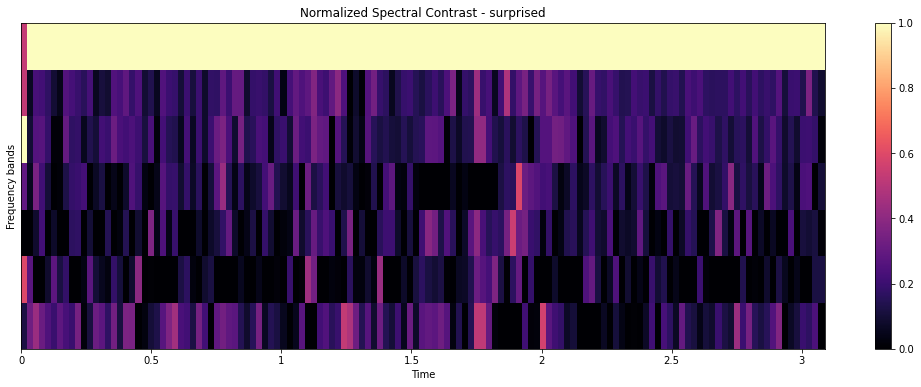

In [ ]:
# Transform example waveforms into nprmalized spectral contrast spectrograms and visualize the result:
for key, value in path_labels.items():
    signal, sr = librosa.load(key, sr=SAMPLE_RATE, duration=DURATION)
    contrast = librosa.feature.spectral_contrast(signal,
                                             sr=SAMPLE_RATE,
                                             n_fft=N_FFT,
                                             hop_length=HOP_LEN,
                                             win_length=WIN_LEN,
                                             window=WINDOW,
                                             n_bands=N_BANDS)
    contrast_norm = minmax_scale(contrast, feature_range=(0,1), axis=0)
    print(f"\nShape of normalized contrast: {contrast_norm.shape}")

    plt.figure(figsize=(18,6))
    librosa.display.specshow(contrast_norm, sr=SAMPLE_RATE, hop_length=HOP_LEN, x_axis='time')   # y_axis='chroma'
    plt.ylabel('Frequency bands')
    plt.title(f'Normalized Spectral Contrast - {value}')
    plt.colorbar()
    plt.show()

#### Tonnetz (Tonal centroids)


Shape of tonnetz: (6, 136)


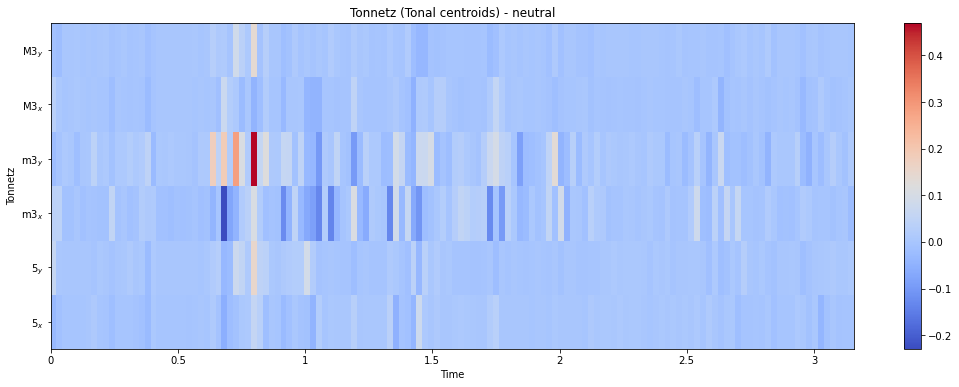


Shape of tonnetz: (6, 141)


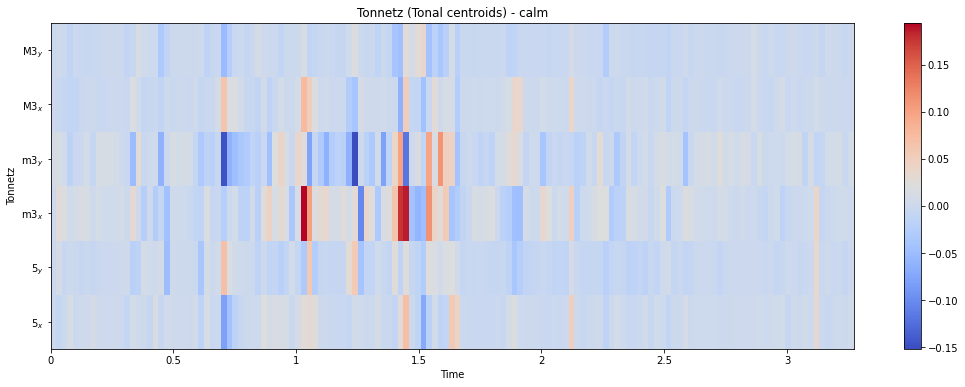


Shape of tonnetz: (6, 134)


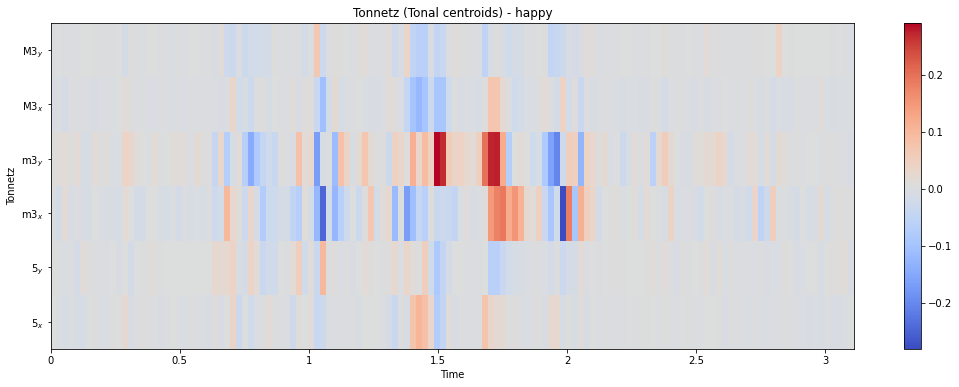


Shape of tonnetz: (6, 144)


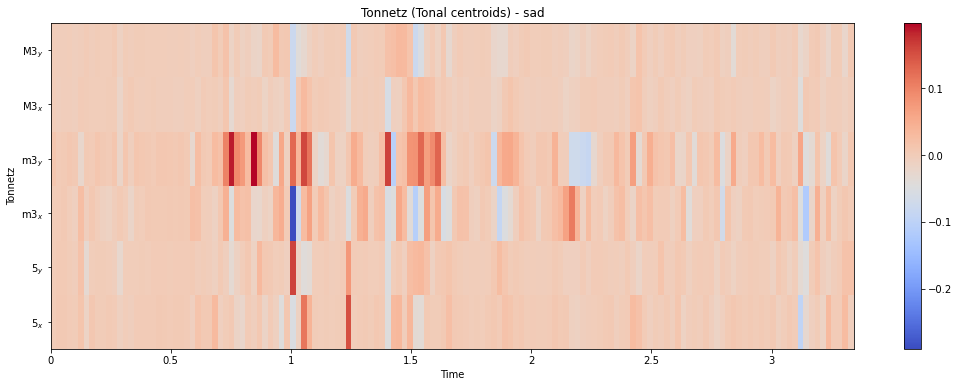


Shape of tonnetz: (6, 156)


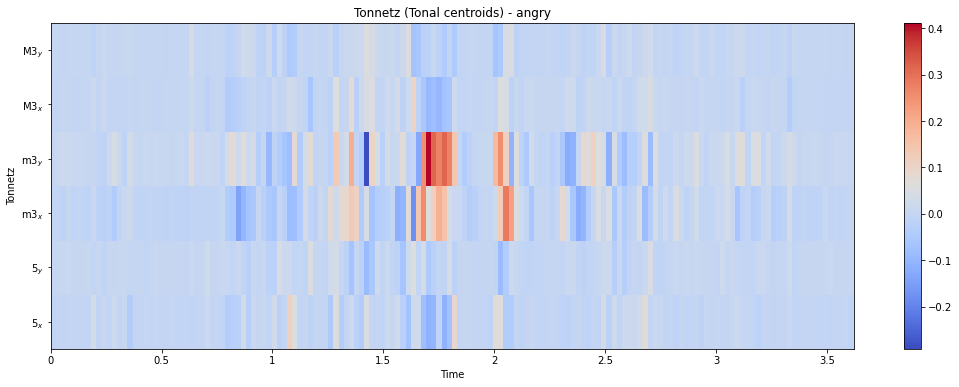


Shape of tonnetz: (6, 150)


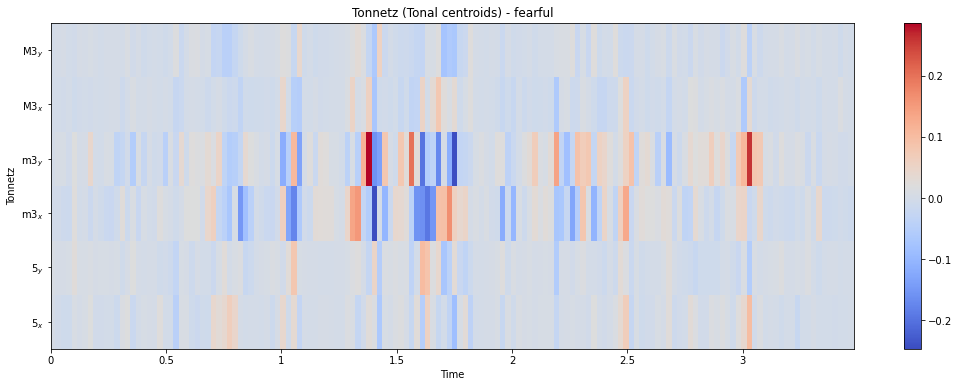


Shape of tonnetz: (6, 159)


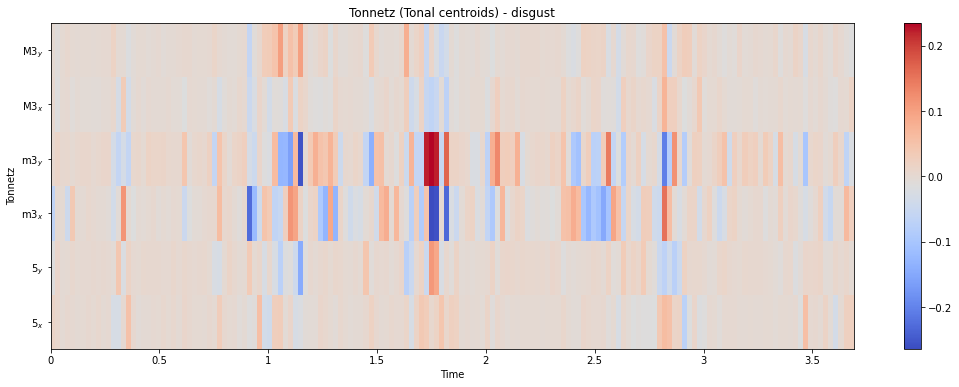


Shape of tonnetz: (6, 133)


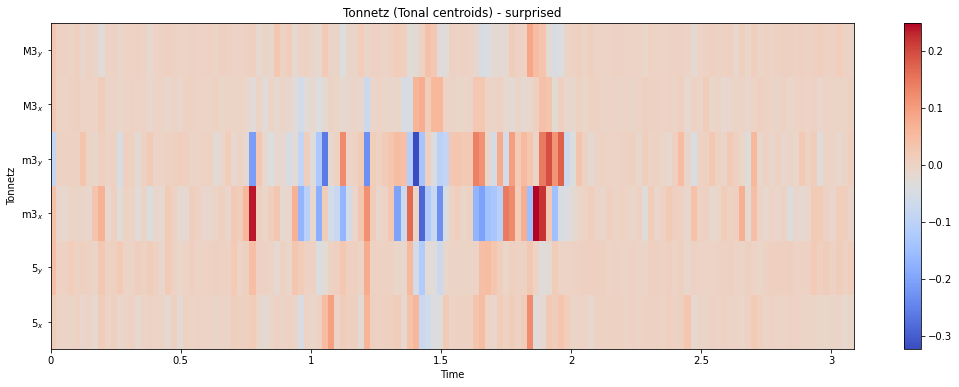

In [ ]:
# Transform example waveforms into tonnetz spectrograms and visualize the result:
for key, value in path_labels.items():
    signal, sr = librosa.load(key, sr=SAMPLE_RATE, duration=DURATION)
    chroma = librosa.feature.chroma_stft(signal,
                                         sr=SAMPLE_RATE,
                                         n_fft=N_FFT,
                                         hop_length=HOP_LEN,
                                         win_length=WIN_LEN,
                                         window=WINDOW,
                                         n_chroma=N_CHROMA)
    tonnetz = librosa.feature.tonnetz(signal,
                                      sr=SAMPLE_RATE,
                                      hop_length=HOP_LEN,
                                      chroma=chroma, 
                                      n_chroma=N_CHROMA)

    print(f"\nShape of tonnetz: {tonnetz.shape}")

    plt.figure(figsize=(18,6))
    librosa.display.specshow(tonnetz, sr=SAMPLE_RATE, hop_length=HOP_LEN, x_axis='time', y_axis='tonnetz')
    plt.title(f'Tonnetz (Tonal centroids) - {value}')
    plt.colorbar()
    plt.show()


Shape of normalized tonnetz: (6, 136)


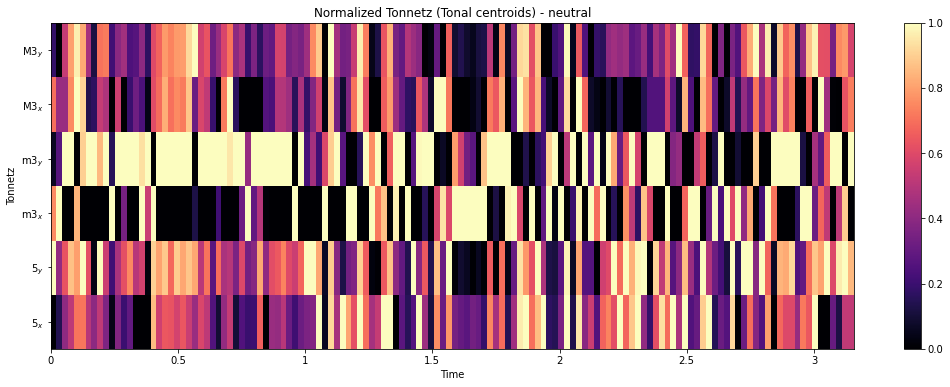


Shape of normalized tonnetz: (6, 141)


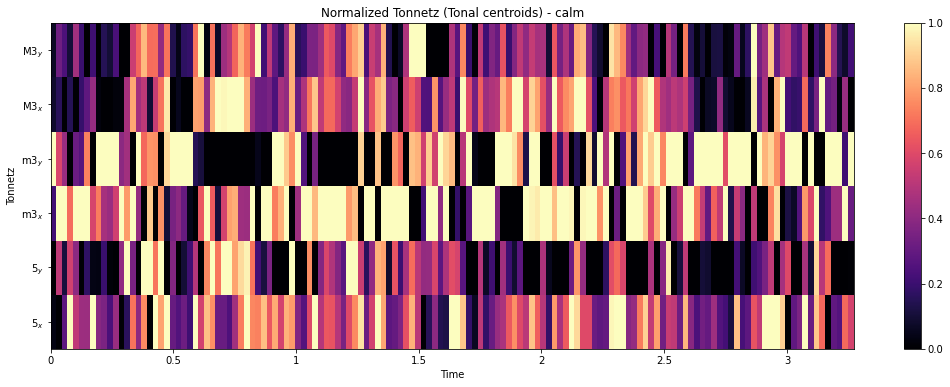


Shape of normalized tonnetz: (6, 134)


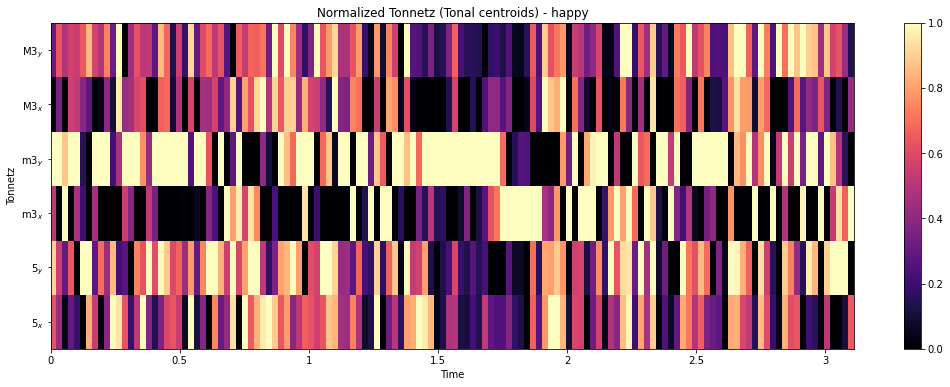


Shape of normalized tonnetz: (6, 144)


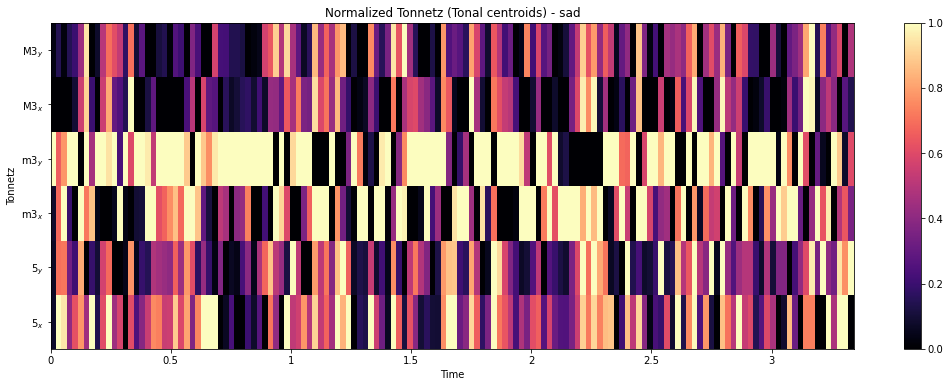


Shape of normalized tonnetz: (6, 156)


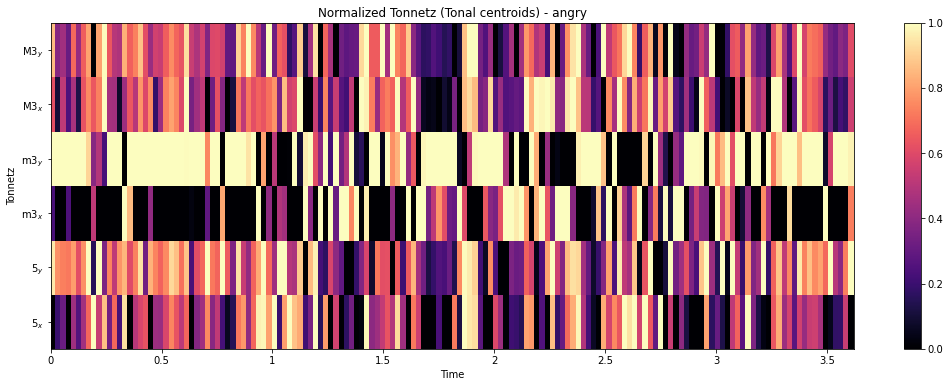


Shape of normalized tonnetz: (6, 150)


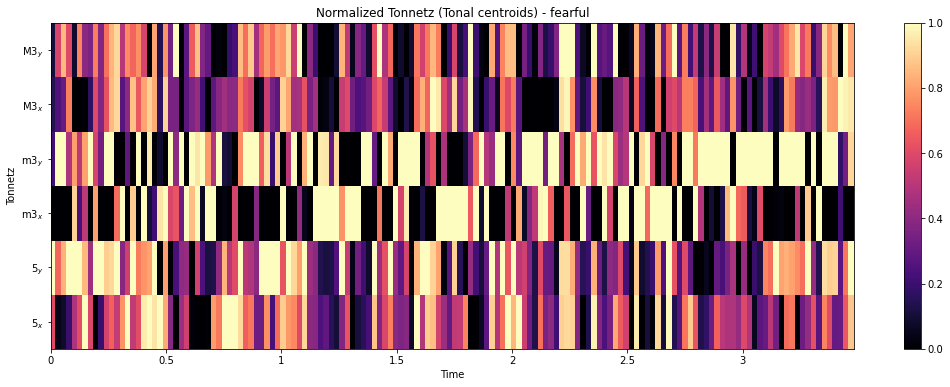


Shape of normalized tonnetz: (6, 159)


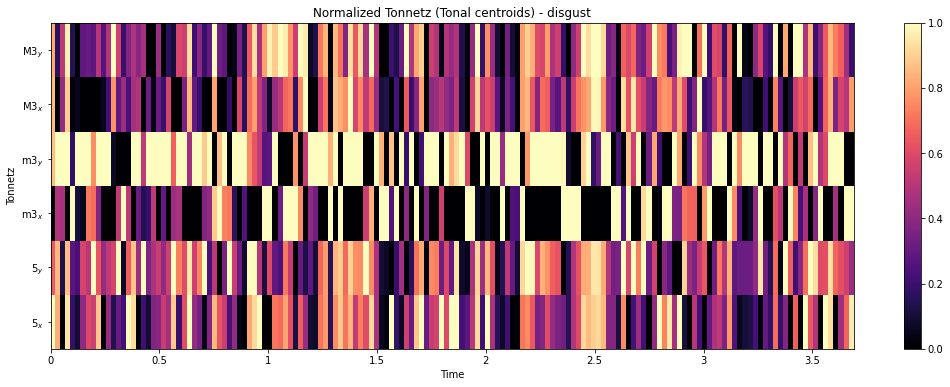


Shape of normalized tonnetz: (6, 133)


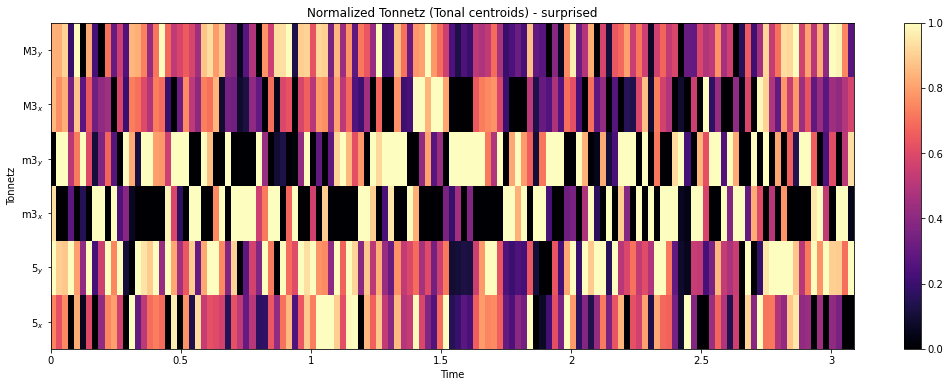

In [ ]:
# Transform example waveforms into normalized tonnetz spectrograms and visualize the result:
for key, value in path_labels.items():
    signal, sr = librosa.load(key, sr=SAMPLE_RATE, duration=DURATION)
    chroma = librosa.feature.chroma_stft(signal,
                                         sr=SAMPLE_RATE,
                                         n_fft=N_FFT,
                                         hop_length=HOP_LEN,
                                         win_length=WIN_LEN,
                                         window=WINDOW,
                                         n_chroma=N_CHROMA)
    tonnetz = librosa.feature.tonnetz(signal,
                                      sr=SAMPLE_RATE,
                                      hop_length=HOP_LEN,
                                      chroma=chroma, 
                                      n_chroma=N_CHROMA)
    tonnetz_norm = minmax_scale(tonnetz, feature_range=(0,1), axis=0)
    print(f"\nShape of normalized tonnetz: {tonnetz_norm.shape}")

    plt.figure(figsize=(18,6))
    librosa.display.specshow(tonnetz_norm, sr=SAMPLE_RATE, hop_length=HOP_LEN, x_axis='time', y_axis='tonnetz')
    plt.title(f'Normalized Tonnetz (Tonal centroids) - {value}')
    plt.colorbar()
    plt.show()

#### RMS energy


Shape of rms: (1, 132)


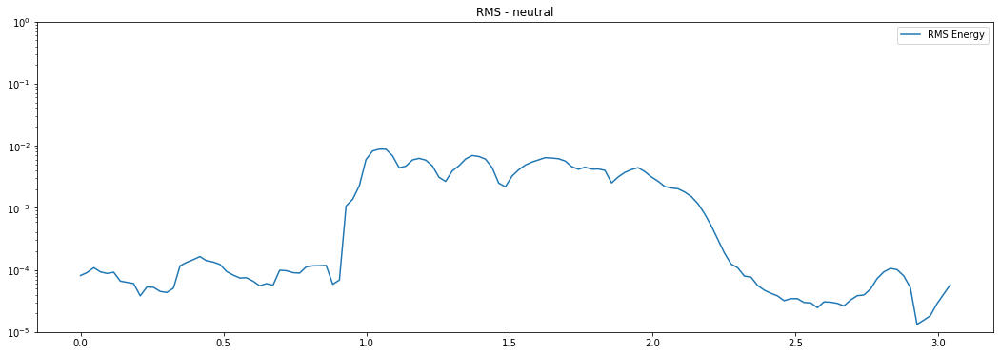


Shape of rms: (1, 137)


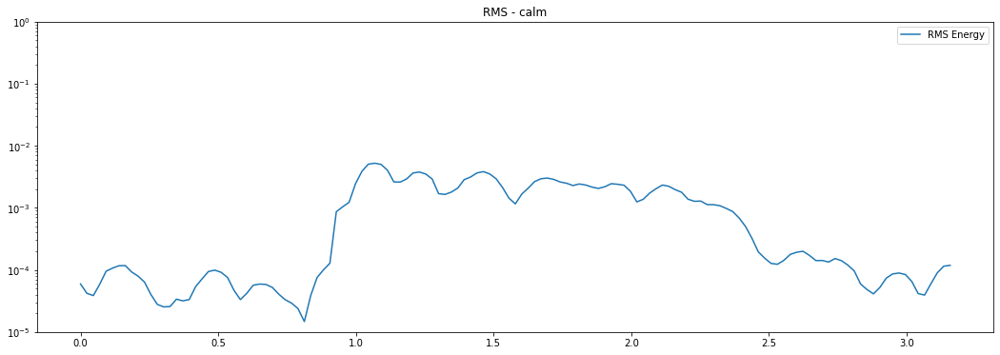


Shape of rms: (1, 130)


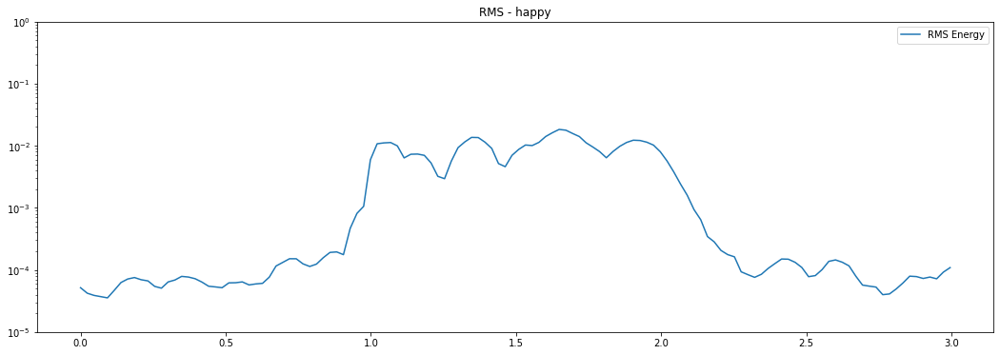


Shape of rms: (1, 140)


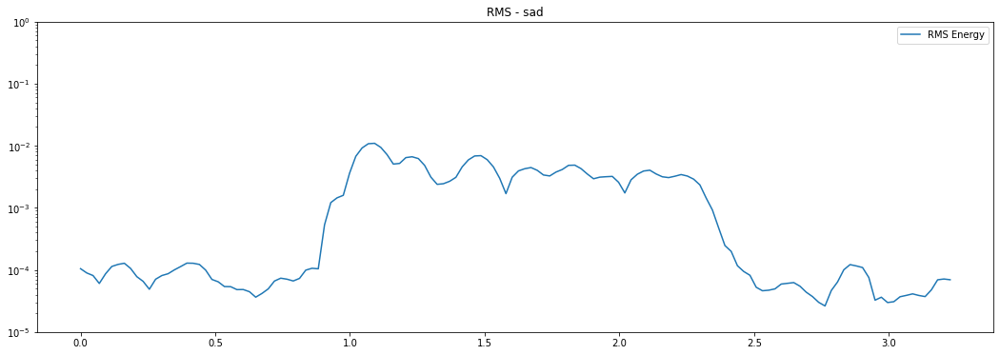


Shape of rms: (1, 152)


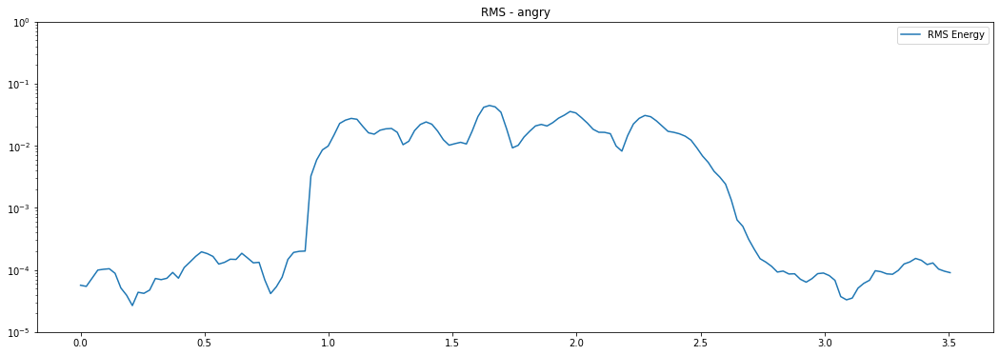


Shape of rms: (1, 146)


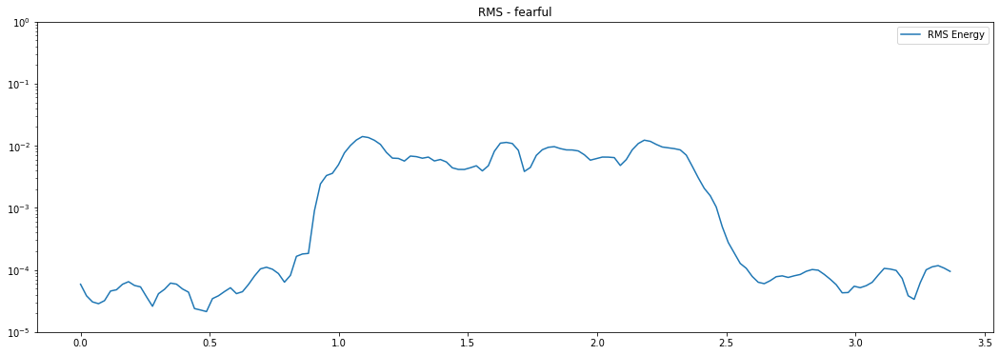


Shape of rms: (1, 155)


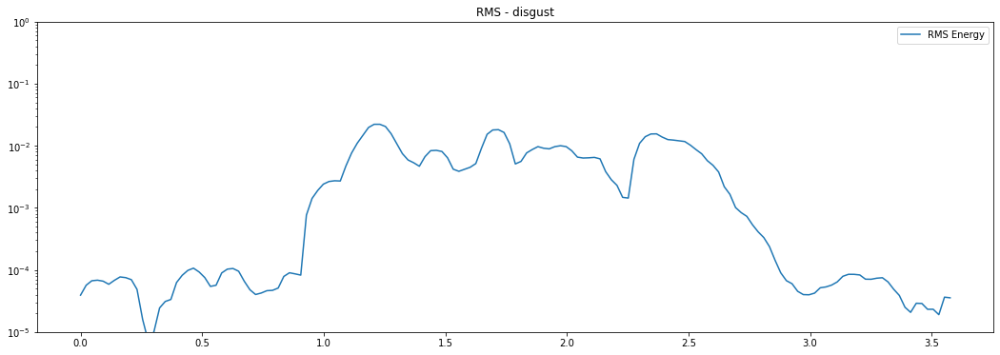


Shape of rms: (1, 129)


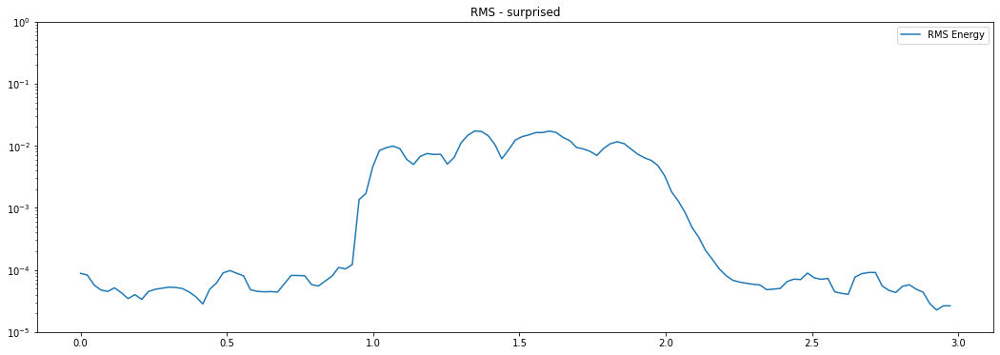

In [ ]:
# Transform example waveforms into RMS Energy and visualize the result:
for key, value in path_labels.items():
    signal, sr = librosa.load(key, sr=SAMPLE_RATE, duration=DURATION)
    sig_mag, phase = librosa.magphase(librosa.stft(signal, window=np.ones, center=False))
    rms = librosa.feature.rms(S=sig_mag, hop_length=HOP_LEN, frame_length=2048)

    print(f"\nShape of rms: {rms.shape}")

    plt.figure(figsize=(18,6))
    times = librosa.times_like(rms)
    plt.semilogy(times, rms[0], label='RMS Energy')
    plt.title(f'RMS - {value}')
    plt.ylim(10e-6, 10e-1)
    plt.legend()
    plt.show()

## Stage 6: Create train and test dataset

#### Define spectrogram augumentation class

In [ ]:
class SpecAugment():
    '''
    Augmentation Parameters for policies
    -----------------------------------------
    Policy | W  | F  | m_F |  T  |  p  | m_T
    -----------------------------------------
    None   |  0 |  0 |  -  |  0  |  -  |  -
    -----------------------------------------
    LB     | 80 | 27 |  1  | 100 | 1.0 | 1
    -----------------------------------------
    LD     | 80 | 27 |  2  | 100 | 1.0 | 2
    -----------------------------------------
    SM     | 40 | 15 |  2  |  70 | 0.2 | 2
    -----------------------------------------
    SS     | 40 | 27 |  2  |  70 | 0.2 | 2
    -----------------------------------------
    
    LB  : LibriSpeech basic
    LD  : LibriSpeech double
    SM  : Switchboard mild
    SS  : Switchboard strong
    F   : Frequency Mask parameter
    m_F : Number of Frequency masks
    T   : Time Mask parameter
    p   : Parameter for calculating upper bound for time mask
    m_T : Number of time masks
    '''
    
    def __init__(self, spectrogram, policy, replace_with_zero=False):
        self.spectrogram = spectrogram
        self.policy = policy
        self.replace_with_zero = replace_with_zero
        
        # Policy Specific Parameters
        if self.policy == 'LB':
            self.W, self.F, self.m_F, self.T, self.p, self.m_T = 80, 15, 1, 10, 1.0, 1
        elif self.policy == 'LD':
            self.W, self.F, self.m_F, self.T, self.p, self.m_T = 80, 15, 2, 10, 1.0, 2
        elif self.policy == 'SM':
            self.W, self.F, self.m_F, self.T, self.p, self.m_T = 40, 10, 2, 7, 0.2, 2
        elif self.policy == 'SS':
            self.W, self.F, self.m_F, self.T, self.p, self.m_T = 40, 15, 2, 7, 0.2, 2
        
    
    def freq_mask(self):
        # cloned = spectro.copy()
        v = self.spectrogram.shape[1] # no. of mel bins
        
        # apply m_F frequency masks to the mel spectrogram
        for i in range(self.m_F):
            f = int(np.random.uniform(0, self.F)) # [0, F)
            f0 = random.randint(0, v - f) # [0, v - f)
            if self.replace_with_zero:
                self.spectrogram[f0:f0 + f,:] = 0
            else:
                self.spectrogram[f0:f0 + f,:] = self.spectrogram.mean()
        return self.spectrogram
    
    
    def time_mask(self):
    
        tau = self.spectrogram.shape[0] # time frames
        
        # apply m_T time masks to the mel spectrogram
        for i in range(self.m_T):
            t = int(np.random.uniform(0, self.T)) # [0, T)
            t0 = random.randint(0, tau - t) # [0, tau - t)
            if self.replace_with_zero:
                self.spectrogram[:, t0:t0 + t] = 0
            else:
                self.spectrogram[:, t0:t0 + t] = self.spectrogram.mean()
        return self.spectrogram

#### Define dataset functions

In [ ]:
# MFCC
def fn_mfcc(signal, norm):
    mfcc = librosa.feature.mfcc(signal,
                            sr=SAMPLE_RATE,
                            n_fft=N_FFT,
                            hop_length=HOP_LEN,
                            win_length=WIN_LEN,
                            window=WINDOW,
                            n_mfcc=N_MFCC)
    if norm:
        mfcc = minmax_scale(mfcc, feature_range=(0,1), axis=0)
    # print(f'mfcc shape: {mfcc.shape}')
    return mfcc


# Chromagram
def fn_chroma(signal, norm):
    chroma = librosa.feature.chroma_stft(signal,
                                        sr=SAMPLE_RATE,
                                        n_fft=N_FFT,
                                        hop_length=HOP_LEN,
                                        win_length=WIN_LEN,
                                        window=WINDOW,
                                        n_chroma=N_CHROMA)
    # print(f'chroma shape: {chroma.shape}')
    return chroma


# Log Mel-scaled spectrogrom
def fn_mel_spectrogram_db(signal, norm):
    mel_spectrogram = librosa.feature.melspectrogram(signal, 
                                                        sr=SAMPLE_RATE,
                                                        n_fft=N_FFT,
                                                        hop_length=HOP_LEN,
                                                        win_length=WIN_LEN,
                                                        window=WINDOW,
                                                        n_mels=N_MELS,
                                                        fmax=FMAX)
    mel_spectrogram_db = librosa.power_to_db(mel_spectrogram, ref=np.max)

    if norm:
        mel_spectrogram_db = minmax_scale(mel_spectrogram_db, feature_range=(0,1), axis=0)
    # print(f'Log mel spectrogram shape: {mel_spectrogram_db.shape}')
    return mel_spectrogram_db


# Spectral contrast
def fn_contrast(signal, norm):
    contrast = librosa.feature.spectral_contrast(signal,
                                                sr=SAMPLE_RATE,
                                                n_fft=N_FFT,
                                                hop_length=HOP_LEN,
                                                win_length=WIN_LEN,
                                                window=WINDOW,
                                                n_bands=N_BANDS)
    if norm:
        contrast = minmax_scale(contrast, feature_range=(0,1), axis=0)
    # print(f'contrast shape: {contrast.shape}')
    return contrast


# Tonnetz
def fn_tonnetz(signal, norm):
    chroma = librosa.feature.chroma_stft(signal,
                                         sr=SAMPLE_RATE,
                                         n_fft=N_FFT,
                                         hop_length=HOP_LEN,
                                         win_length=WIN_LEN,
                                         window=WINDOW,
                                         n_chroma=N_CHROMA)        
    tonnetz = librosa.feature.tonnetz(signal,
                                      sr=SAMPLE_RATE,
                                      hop_length=HOP_LEN,
                                      chroma=chroma,
                                      n_chroma=N_CHROMA)
    if norm:
        tonnetz = minmax_scale(tonnetz, feature_range=(0,1), axis=0)
    # print(f'tonnetz shape: {tonnetz.shape}')
    return tonnetz

In [ ]:
def get_features(path, mode, feature_list=['mfcc'], norm=False, specaugment=False):
   
    """Function Extracts Features from WAV(aduio) file"""   
    # Load an audio file as a floating point time series
    # which returns audio time series and sampling rate 
    # duration and offset are used to take care of the no audio in start and the ending of each audio files as seen above.
    signal, sr = librosa.load(path, sr=SAMPLE_RATE, duration=DURATION, offset=OFFSET)

    # Available features: 'mfcc', 'chroma', 'logmelspectrogram', 'contrast', 'tonnetz'
    feature_dict = {'mfcc': fn_mfcc, 'chroma': fn_chroma, 'logmelspectrogram': fn_mel_spectrogram_db, 'contrast': fn_contrast, 'tonnetz': fn_tonnetz}

    # Stack features
    for i in range(len(feature_list)):
        fn_feature = feature_dict.get(feature_list[i])        
        feature = fn_feature(signal, norm)

        if i == 0:
            features_stack = feature

        if i > 0:
            features_stack = np.vstack((features_stack, feature))
    
    # print(f'Feature stack shape: {features_stack.shape}')

    # Get upto maximum length
    if features_stack.shape[1] >=  MAX_INPUT_LEN:
        features = features_stack[:,: MAX_INPUT_LEN]
    else:
        features = features_stack[:,:]
    
    # zero-pad all audio signals to max input length
    features_padded = np.zeros((features.shape[0], MAX_INPUT_LEN))
    features_padded[:, :features.shape[1]] = features

    # Spectrogram augmentation
    if specaugment and mode == 'train':
        policy = random.choice(['LB', 'LD', 'SM', 'SS', None])
        if policy == None:
            time_masked = features_padded
        else:
            apply = SpecAugment(features_padded, policy)
            freq_masked = apply.freq_mask() 
            time_masked = apply.time_mask()
 
    else: 
        time_masked = features_padded

    # print(f'Time masked: {time_masked.shape}')

    return time_masked

Feature shape: (42, 194)


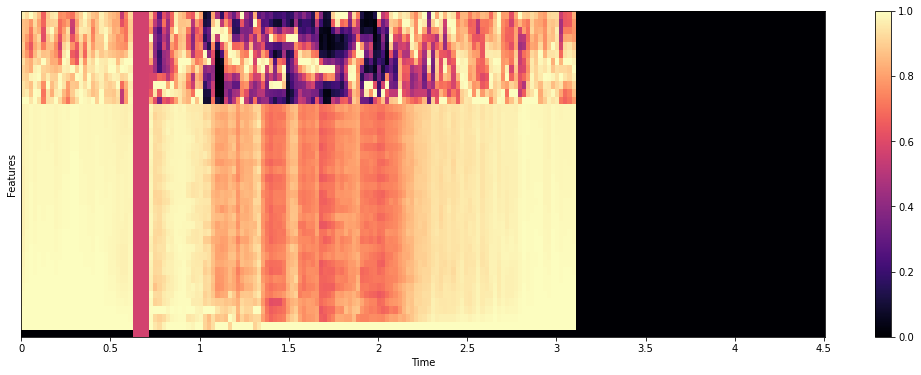

In [ ]:
# Test get_features
sample_path = sample_audio_files[2]
f_list = ['mfcc', 'chroma']       # 'logmelspectrogram', 'contrast', 'tonnetz'
feature = get_features(sample_path, mode='train', feature_list=f_list, norm=True, specaugment=True)
print(f'Feature shape: {feature.shape}')
plt.figure(figsize=(18,6))
librosa.display.specshow(feature, sr=SAMPLE_RATE, hop_length=HOP_LEN, x_axis='time')   
plt.ylabel('Features')
plt.colorbar()
plt.show()

In [ ]:
# ravdess_speech_df.head()

In [ ]:
labels_df = ravdess_speech_df[['Path','Emotions']]
labels_df.head()

,Path,Emotions
0,data/ravdess/speech/Actor_18/03-01-03-02-02-02...,happy
1,data/ravdess/speech/Actor_18/03-01-03-02-02-01...,happy
2,data/ravdess/speech/Actor_18/03-01-08-01-01-01...,surprised
3,data/ravdess/speech/Actor_18/03-01-06-02-01-02...,fearful
4,data/ravdess/speech/Actor_18/03-01-06-01-01-02...,fearful


In [ ]:
# Get all files from the augmented data folder
aug_files = get_files(Path(augumented_data_dir))
print(f'Number of augmented audio files: {len(aug_files)}')

# Assigning labels to each .wav file in augmented data folder
# Note: the label id starts from 0 to 7
aug_labels = [int(l.stem.split('-')[2][-1])-1 for l in aug_files]
aug_emotions = [label_id_rev.get(value) for value in aug_labels]

Number of augmented audio files: 1440


In [ ]:
aug_df = pd.DataFrame(list(zip(aug_files, aug_emotions)), columns=['Path', 'Emotions'])
aug_df.head()

,Path,Emotions
0,data/ravdess/speech/augment3/03-01-03-01-01-01...,happy
1,data/ravdess/speech/augment3/03-01-05-01-02-01...,angry
2,data/ravdess/speech/augment3/03-01-02-01-01-01...,calm
3,data/ravdess/speech/augment3/03-01-07-01-01-01...,disgust
4,data/ravdess/speech/augment3/03-01-04-01-01-02...,sad


## Stage 7: Create and train the model

In [ ]:
!mkdir -p /content/models

#### Run k fold cross validation training

In [ ]:
# skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True)

# inputs = np.array(ravdess_speech_df['Path'].tolist())
# targets = np.array(ravdess_speech_df['Emotions'].tolist())

# for train, val in skf.split(inputs, targets):
#     trainX, valX = inputs[train], inputs[val]
#     trainY, valY = targets[train], targets[val]

#     print(trainX.shape, valX.shape)
#     print(trainY.shape, valY.shape)

In [ ]:
# Define per-fold score containers
train_acc_per_fold, val_acc_per_fold = [], []
train_loss_per_fold, val_loss_per_fold = [], []

# Define the K-fold Cross Validator
# kfold = KFold(n_splits=N_FOLDS, shuffle=True)
skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True)

inputs = np.array(ravdess_speech_df['Path'].tolist())
targets = np.array(ravdess_speech_df['Emotions'].tolist())

aug_inputs = np.array(aug_files)
aug_targets = np.array(aug_emotions)

# K-fold Cross Validation model evaluation
fold_no = 1
for train, val in skf.split(inputs, targets):

    train_X, train_y = inputs[train], targets[train]
    val_X, val_y = inputs[val], targets[val]

    # Creat augmented dataframe
    aug_train_X = np.append(train_X, aug_inputs)
    aug_train_y = np.append(train_y, aug_targets)

    # Create features
    X_train_list, y_train_list = [], []

    if AUDIO_AUGMENT:
        for path, emotion in zip(aug_train_X, aug_train_y):
            feature = get_features(path, mode='train', feature_list=FEATURE_LIST, norm=NORM, specaugment=SPECAUGMENT)
            X_train_list.append(feature)
            y_train_list.append(emotion)
            
    elif not AUDIO_AUGMENT:
        for path, emotion in zip(train_X, train_y):
            feature = get_features(path, mode='train', feature_list=FEATURE_LIST, norm=NORM, specaugment=SPECAUGMENT)
            X_train_list.append(feature)
            y_train_list.append(emotion)

    X_val_list, y_val_list = [], []
    for path, emotion in zip(val_X, val_y):
        feature = get_features(path, mode='val', feature_list=FEATURE_LIST, norm=NORM, specaugment=SPECAUGMENT)
        X_val_list.append(feature)
        y_val_list.append(emotion)

    X_train, y_train = np.array(X_train_list), np.array(y_train_list)
    # print(X_train.shape, y_train.shape)

    X_val, y_val = np.array(X_val_list), np.array(y_val_list)
    # print(X_val.shape, y_val.shape)

    # As this is a multiclass classification problem onehotencoding our y.
    encoder = OneHotEncoder(categories=[categories])
    y_train = encoder.fit_transform(y_train.reshape(-1,1)).toarray()
    y_val = encoder.fit_transform(y_val.reshape(-1,1)).toarray()

    # making data compatible to model.
    X_train = np.expand_dims(X_train, axis=3)
    # print(X_train.shape)
    X_train = np.swapaxes(X_train, 1, 2)
    # print(X_train.shape)
    X_train = np.expand_dims(X_train, axis=2)

    X_val = np.expand_dims(X_val, axis=3)
    X_val = np.swapaxes(X_val, 1, 2)
    X_val = np.expand_dims(X_val, axis=2)

    print(X_train.shape, y_train.shape, X_val.shape, y_val.shape)

    # Prepare the training dataset.
    train_dataset = tf.data.Dataset.from_tensor_slices((X_train, y_train))
    train_dataset = train_dataset.shuffle(buffer_size=1024).batch(BATCH_SIZE)

    # Prepare the validation dataset.
    val_dataset = tf.data.Dataset.from_tensor_slices((X_val, y_val))
    val_dataset = val_dataset.batch(BATCH_SIZE)

    input_shape = X_train.shape[1:]

    # Build model
    model=Sequential(name="Seq_LSTMNet_V0")
    model.add(TimeDistributed(Conv1D(FILTERS, KERNEL_SIZE, padding='same', activation='relu'),
                                input_shape=input_shape))
    model.add(TimeDistributed(BatchNormalization()))
    model.add(TimeDistributed(Flatten()))
    model.add(LSTM(LSTM_OUT))
    model.add(Dropout(DP))
    model.add(Dense(units=LSTM_OUT, activation='relu'))
    model.add(Dropout(DP))
    model.add(Dense(units=len(categories), activation='softmax'))
    model.summary()


    optimizer = adam_v2.Adam()
    model.compile(optimizer=optimizer,
                loss = 'categorical_crossentropy',
                metrics=['accuracy'])
    rlrp = ReduceLROnPlateau(monitor='val_loss', factor=0.5, verbose=1, patience=4, min_lr=0.0000001)

    train_start_time = time.time()
    
    history = model.fit(X_train, y_train, batch_size=BATCH_SIZE, epochs=max_epochs, validation_data=(X_val, y_val), callbacks=[rlrp])
    train_time = round((time.time() - train_start_time) / 60, 2)

    # Prediction on train data
    y_train_pred = model.predict(X_train, verbose=1)
    y_train_pred = np.argmax(y_train_pred, axis=1)
    y_train_true = np.argmax(y_train, axis=1)

    # Prediction on validation data
    y_val_pred = model.predict(X_val, verbose=1)
    y_val_pred = np.argmax(y_val_pred, axis=1)
    y_val_true = np.argmax(y_val, axis=1)

    # Calculate accuracies
    cm_train = metrics.confusion_matrix(y_train_true, y_train_pred)
    cm_val = metrics.confusion_matrix(y_val_true, y_val_pred)
    accuracy_train = cm_train.diagonal().sum() / cm_train.sum()
    accuracy_val = cm_val.diagonal().sum() / cm_val.sum()

    # Get current date and time
    ct = datetime.now(IST)
    ct = ct.strftime("%Y-%m-%d_%H-%M-%S")

    # Save model
    file_name_model = ct + "_model_" + type(model).__name__ + '_EP_' + str(max_epochs) + '_Fold_' + str(fold_no)
    model.save('models/' + file_name_model, save_format='tf')
    shutil.copytree('models/' + file_name_model,
                    '/content/drive/MyDrive/Colab Notebooks/IISC_DL/05_CapstoneProject_SER/04_Code&Data/Models/' + file_name_model)
    
    ## Save training data
    # Create file name
    file_name_train_data = ct + "_training_data_" + type(model).__name__ + '_EP_' + str(max_epochs) + '_Fold_' + str(fold_no) + '.csv'

    # Create dataframe
    train_history = pd.DataFrame(history.history)
    # Prepare csv file
    train_history.to_csv(file_name_train_data, index=True)
    # Save csv file
    shutil.copy(file_name_train_data, 
                '/content/drive/MyDrive/Colab Notebooks/IISC_DL/05_CapstoneProject_SER/04_Code&Data/train_data')
    
    # Confusion matrix - Train Dataset
    confusion_matrix_train = metrics.confusion_matrix(y_train_true, y_train_pred, normalize='true') * 100
    confusion_matrix_train_df = pd.DataFrame(confusion_matrix_train,
                                             index = [i for i in encoder.categories_] , columns = [i for i in encoder.categories_])
    
    # Confusion matrix - Validation Dataset
    confusion_matrix_val = metrics.confusion_matrix(y_val_true, y_val_pred, normalize='true') * 100
    confusion_matrix_val_df = pd.DataFrame(confusion_matrix_val, 
                                           index = [i for i in encoder.categories_] , columns = [i for i in encoder.categories_])

    # Create file names
    file_name_train_confusion_matrix = ct + "_train_confusion_matrix_" + type(model).__name__ + '_EP_' + str(max_epochs) + '_Fold_' + str(fold_no) + '.csv'
    file_name_val_confusion_matrix = ct + "_val_confusion_matrix_" + type(model).__name__ + '_EP_' + str(max_epochs) + '_Fold_' + str(fold_no) + '.csv'

    confusion_matrix_train_df.to_csv(file_name_train_confusion_matrix, index=True)
    confusion_matrix_val_df.to_csv(file_name_val_confusion_matrix, index=True)

    # Save csv files
    shutil.copy(file_name_train_confusion_matrix, '/content/drive/MyDrive/Colab Notebooks/IISC_DL/05_CapstoneProject_SER/04_Code&Data/train_data')
    shutil.copy(file_name_val_confusion_matrix, '/content/drive/MyDrive/Colab Notebooks/IISC_DL/05_CapstoneProject_SER/04_Code&Data/train_data')
    
    # Configuration
    configuration_dict = {'DateTime': ct,
                          'Dataset': 'Ravdess Speech',
                          'SampleRate': SAMPLE_RATE,
                          'AudioDuration': DURATION, 
                          'offset': OFFSET,
                          'HopLength': HOP_LEN,
                          'WinLength': WIN_LEN,
                          'Window': WINDOW,
                          'n_fft': N_FFT,
                          'n_mfcc': N_MFCC,
                          'n_chroma': N_CHROMA,
                          'n_mels': N_MELS,
                          'n_bands': N_BANDS,
                          'fmax': FMAX,
                          'MaxInputLength': MAX_INPUT_LEN,
                          'features': feature_list_converted,
                          'normalization': NORM,
                          'AudioAugmentation': AUDIO_AUGMENT,
                          'SpecAugmentation': SPECAUGMENT,
                          'n_folds': N_FOLDS,
                          'TestSize': TEST_SIZE,
                          'BatchSize': BATCH_SIZE,
                          'NumEpochs': max_epochs,
                          'InitialLearningRate': initial_lr, 
                          'WeightDecay': weight_decay, 
                          'Momentum': momentum,
                          'Model': type(model).__name__,
                          'n_Classes': len(categories),
                          'n_filters': FILTERS,
                          'kernel_size': KERNEL_SIZE,
                          'lstm_out': LSTM_OUT,
                          'Dropout': DP,
                          'LossFunction': 'categorical_crossentropy',   #type(loss_fn).__name__,
                          'Optimizer': type(optimizer).__name__,
                          'TrainingTime': train_time,
                          'TrainingAccuracy': accuracy_train,
                          'ValidationAccuracy': accuracy_val,
                          'TrainingLoss': train_history['loss'].iloc[-1],
                          'ValidationLoss': train_history['val_loss'].iloc[-1]
                          }

    configuration = pd.DataFrame(configuration_dict, index=[0])

    # Save configuration
    file_name_config = ct + "_config_" + type(model).__name__ + '_EP_' + str(max_epochs) + '_Fold_' + str(fold_no) + '.csv'
    configuration.to_csv(file_name_config, index=True)
    shutil.copy(file_name_config, '/content/drive/MyDrive/Colab Notebooks/IISC_DL/05_CapstoneProject_SER/04_Code&Data/train_data')

    # Generate generalization metrics
    train_acc_per_fold.append(accuracy_train)
    val_acc_per_fold.append(accuracy_val)
    train_loss_per_fold.append(train_history['loss'].iloc[-1])
    val_loss_per_fold.append(train_history['val_loss'].iloc[-1])

    print(f"fold: {fold_no:02} | Training Loss: {train_history['loss'].iloc[-1]:.5f} | Training Acc: {accuracy_train:.4f} | Validation loss: {train_history['val_loss'].iloc[-1]:.5f} | Validation acc: {accuracy_val:.4f}\n")

    # Increase fold number
    fold_no = fold_no + 1

(2592, 194, 1, 30, 1) (2592, 8) (288, 194, 1, 30, 1) (288, 8)
Model: "Seq_LSTMNet_V0"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed (TimeDistr  (None, 194, 1, 30, 16)   64        
 ibuted)                                                         
                                                                 
 time_distributed_1 (TimeDis  (None, 194, 1, 30, 16)   64        
 tributed)                                                       
                                                                 
 time_distributed_2 (TimeDis  (None, 194, 480)         0         
 tributed)                                                       
                                                                 
 lstm (LSTM)                 (None, 512)               2033664   
                                                                 
 dropout (Dropout)           (None, 512)               0

fold: 01 | Training Loss: 0.00093 | Training Acc: 1.0000 | Validation loss: 0.29742 | Validation acc: 0.9410

(2592, 194, 1, 30, 1) (2592, 8) (288, 194, 1, 30, 1) (288, 8)
Model: "Seq_LSTMNet_V0"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_3 (TimeDis  (None, 194, 1, 30, 16)   64        
 tributed)                                                       
                                                                 
 time_distributed_4 (TimeDis  (None, 194, 1, 30, 16)   64        
 tributed)                                                       
                                                                 
 time_distributed_5 (TimeDis  (None, 194, 480)         0         
 tributed)                                                       
                                                                 
 lstm_1 (LSTM)               (None, 512)               2033664   
            

fold: 02 | Training Loss: 0.00302 | Training Acc: 1.0000 | Validation loss: 0.38834 | Validation acc: 0.9201

(2592, 194, 1, 30, 1) (2592, 8) (288, 194, 1, 30, 1) (288, 8)
Model: "Seq_LSTMNet_V0"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_6 (TimeDis  (None, 194, 1, 30, 16)   64        
 tributed)                                                       
                                                                 
 time_distributed_7 (TimeDis  (None, 194, 1, 30, 16)   64        
 tributed)                                                       
                                                                 
 time_distributed_8 (TimeDis  (None, 194, 480)         0         
 tributed)                                                       
                                                                 
 lstm_2 (LSTM)               (None, 512)               2033664   
            

fold: 03 | Training Loss: 0.00154 | Training Acc: 1.0000 | Validation loss: 0.34303 | Validation acc: 0.9514

(2592, 194, 1, 30, 1) (2592, 8) (288, 194, 1, 30, 1) (288, 8)
Model: "Seq_LSTMNet_V0"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_9 (TimeDis  (None, 194, 1, 30, 16)   64        
 tributed)                                                       
                                                                 
 time_distributed_10 (TimeDi  (None, 194, 1, 30, 16)   64        
 stributed)                                                      
                                                                 
 time_distributed_11 (TimeDi  (None, 194, 480)         0         
 stributed)                                                      
                                                                 
 lstm_3 (LSTM)               (None, 512)               2033664   
            

fold: 04 | Training Loss: 0.00601 | Training Acc: 0.9992 | Validation loss: 0.33437 | Validation acc: 0.9444

(2592, 194, 1, 30, 1) (2592, 8) (288, 194, 1, 30, 1) (288, 8)
Model: "Seq_LSTMNet_V0"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 time_distributed_12 (TimeDi  (None, 194, 1, 30, 16)   64        
 stributed)                                                      
                                                                 
 time_distributed_13 (TimeDi  (None, 194, 1, 30, 16)   64        
 stributed)                                                      
                                                                 
 time_distributed_14 (TimeDi  (None, 194, 480)         0         
 stributed)                                                      
                                                                 
 lstm_4 (LSTM)               (None, 512)               2033664   
            

fold: 05 | Training Loss: 0.00205 | Training Acc: 1.0000 | Validation loss: 0.29265 | Validation acc: 0.9340



#### View metrics of k fold cross validation

##### Print metrics

In [ ]:
# == Provide average scores ==
print('-----------------------------------------------------------------------------------------------------------')
print('Score per fold')
for i in range(N_FOLDS):
    print('-----------------------------------------------------------------------------------------------------------')
    print(f"fold: {i+1} | Training Loss: {train_loss_per_fold[i]:.5f} | Training Acc: {train_acc_per_fold[i]:.4f} | Validation loss: {val_loss_per_fold[i]:0.5f} | Validation acc: {val_acc_per_fold[i]:.4f}")
print('-----------------------------------------------------------------------------------------------------------')
print('Average scores for all folds:')
print(f'> Train Accuracy     : {np.mean(train_acc_per_fold):.4f} (+- {np.std(train_acc_per_fold):.4f})')
print(f'> Validation Accuracy: {np.mean(val_acc_per_fold):.4f} (+- {np.std(val_acc_per_fold):.4f})')
print(f'> Train Loss         : {np.mean(train_loss_per_fold):.5f}')
print(f'> Validation Loss    : {np.mean(val_loss_per_fold):.5f}')
print('-----------------------------------------------------------------------------------------------------------')

-----------------------------------------------------------------------------------------------------------
Score per fold
-----------------------------------------------------------------------------------------------------------
fold: 1 | Training Loss: 0.00093 | Training Acc: 1.0000 | Validation loss: 0.29742 | Validation acc: 0.9410
-----------------------------------------------------------------------------------------------------------
fold: 2 | Training Loss: 0.00302 | Training Acc: 1.0000 | Validation loss: 0.38834 | Validation acc: 0.9201
-----------------------------------------------------------------------------------------------------------
fold: 3 | Training Loss: 0.00154 | Training Acc: 1.0000 | Validation loss: 0.34303 | Validation acc: 0.9514
-----------------------------------------------------------------------------------------------------------
fold: 4 | Training Loss: 0.00601 | Training Acc: 0.9992 | Validation loss: 0.33437 | Validation acc: 0.9444
-------------

##### Plot training history of last fold

In [ ]:
def plot_training_hist(history):
    '''Function to plot history for accuracy and loss'''
    
    epochs = [i for i in range(len(history.accuracy))]
    fig , ax = plt.subplots(1,2)
    train_acc = history['accuracy']
    train_loss = history['loss']
    val_acc = history['val_accuracy']
    val_loss = history['val_loss']

    fig.set_size_inches(20,6)
    ax[0].plot(epochs , train_acc , label = 'Training Accuracy')
    ax[0].plot(epochs , val_acc , label = 'Validation Accuracy')
    ax[0].set_title('Training and Validation Accuracy')
    ax[0].legend()
    ax[0].set_xlabel("Epochs")

    ax[1].plot(epochs , train_loss , label = 'Training Loss')
    ax[1].plot(epochs , val_loss , label = 'Validation Loss')
    ax[1].set_title('Training and Validation Loss')
    ax[1].legend()
    ax[1].set_xlabel("Epochs")
    plt.show()

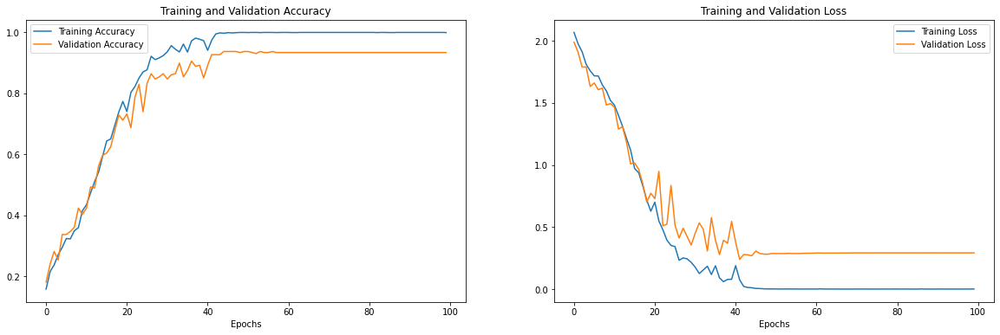

In [ ]:
# Visualization of Training and Validation Accuracy
plot_training_hist(train_history)

## Stage 8: Test predictions

##### Load best model

In [ ]:
## shutil.rmtree("/content/models")

In [ ]:
model_file_path = "2023-01-28_10-20-48_model_Sequential_EP_100_Fold_3"
# shutil.copytree('/content/drive/MyDrive/Colab Notebooks/IISC_DL/05_CapstoneProject_SER/04_Code&Data/Models/' + model_file_path, 'models/' + model_file_path)

In [ ]:
new_model = load_model('models/' + model_file_path, compile=False)

#### Predictions on train and val set of last fold

In [ ]:
# Prediction on train data
y_train_pred = np.argmax(new_model.predict(X_train, verbose=1), axis=1)
y_train_true = np.argmax(y_train, axis=1)

y_train_pred_array = new_model.predict(X_train, verbose=1)
y_train_true_array = y_train

y_train_pred_inv_tr = encoder.inverse_transform(y_train_pred_array)
y_train_true_inv_tr = encoder.inverse_transform(y_train_true_array)

81/81 [==============================] - 1s 13ms/step


In [ ]:
# Prediction on validation data
y_val_pred = np.argmax(new_model.predict(X_val, verbose=1), axis=1)
y_val_true = np.argmax(y_val, axis=1)

y_val_pred_array = new_model.predict(X_val, verbose=1)
y_val_true_array = y_val

y_val_pred_inv_tr = encoder.inverse_transform(y_val_pred_array)
y_val_true_inv_tr = encoder.inverse_transform(y_val_true_array)

9/9 [==============================] - 0s 11ms/step


In [ ]:
df = pd.DataFrame(columns=['Predicted Labels', 'Actual Labels'])
df['Predicted Labels'] = y_val_pred_inv_tr.flatten()
df['Actual Labels'] = y_val_true_inv_tr.flatten()

df.head(10)

,Predicted Labels,Actual Labels
0,neutral,neutral
1,disgust,disgust
2,happy,happy
3,calm,calm
4,neutral,neutral
5,surprised,surprised
6,fearful,fearful
7,calm,calm
8,happy,happy
9,disgust,disgust


##### View metrics of best model

###### Confusion matrix

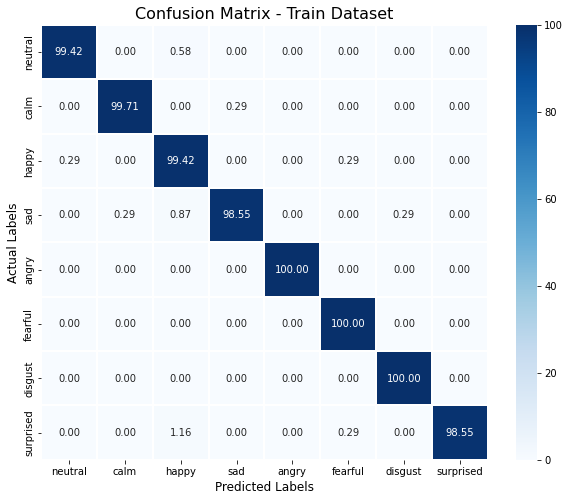

In [ ]:
# Confusion matrix - Train Dataset
confusion_matrix_train = metrics.confusion_matrix(y_train_true, y_train_pred, normalize='true') * 100
confusion_matrix_train_df = pd.DataFrame(confusion_matrix_train, index = [i for i in encoder.categories_] , columns = [i for i in encoder.categories_])

plt.figure(figsize = (10, 8))
sns.heatmap(confusion_matrix_train_df, linecolor='white', cmap='Blues', linewidth=1, annot=True, fmt='.2f')
plt.title('Confusion Matrix - Train Dataset', size=16)
plt.xlabel('Predicted Labels', size=12)
plt.ylabel('Actual Labels', size=12)
# plt.savefig('ConfusionMatrixTrain.png')
plt.show()

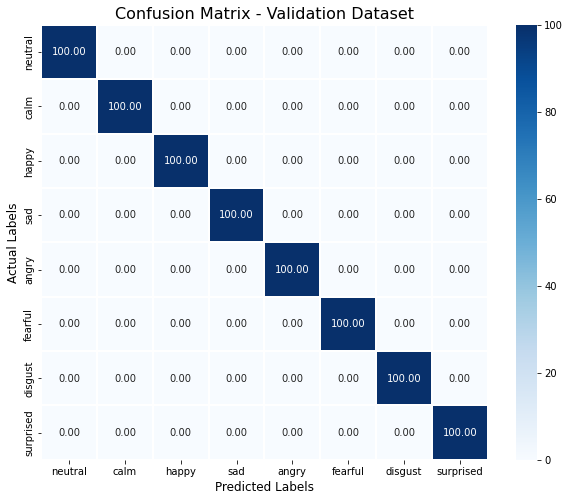

In [ ]:
# Confusion matrix - Validation Dataset
confusion_matrix_val = metrics.confusion_matrix(y_val_true, y_val_pred, normalize='true') * 100
confusion_matrix_val_df = pd.DataFrame(confusion_matrix_val , index = [i for i in encoder.categories_] , columns = [i for i in encoder.categories_])
                      
plt.figure(figsize = (10, 8))
sns.heatmap(confusion_matrix_val_df, linecolor='white', cmap='Blues', linewidth=1, annot=True, fmt='.2f')
plt.title('Confusion Matrix - Validation Dataset', size=16)
plt.xlabel('Predicted Labels', size=12)
plt.ylabel('Actual Labels', size=12)
# plt.savefig('ConfusionMatrixValidation.png')
plt.show()

###### Classwise accuracy

In [ ]:
cm_train = metrics.confusion_matrix(y_train_true, y_train_pred)
cm_val = metrics.confusion_matrix(y_val_true, y_val_pred)

class_accuracy_train = cm_train.diagonal() / cm_train.sum(1)
class_accuracy_val = cm_val.diagonal() / cm_val.sum(1)

accuracy_train = cm_train.diagonal().sum() / cm_train.sum()
accuracy_val = cm_val.diagonal().sum() / cm_val.sum()

print(f"Classwise accuracy for train dataset: {class_accuracy_train}")
print(f"Classwise accuracy for val dataset: {class_accuracy_val}")

print(f"\nAccuracy for train dataset: {accuracy_train:.4f}")
print(f"Accuracy for val dataset: {accuracy_val:.4f}")

Classwise accuracy for train dataset: [0.99421965 0.99710983 0.99421965 0.98550725 1.         1.
 1.         0.98554913]
Classwise accuracy for val dataset: [1. 1. 1. 1. 1. 1. 1. 1.]

Accuracy for train dataset: 0.9946
Accuracy for val dataset: 1.0000


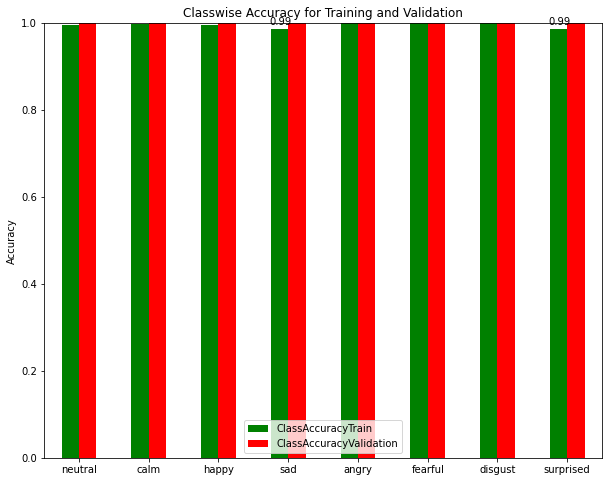

In [ ]:
class_accuracy = pd.DataFrame({'ClassAccuracyTrain': class_accuracy_train,
                               'ClassAccuracyValidation': class_accuracy_val}, index=categories)   

ax = class_accuracy.plot.bar(rot=0, color={'ClassAccuracyTrain': 'green', 'ClassAccuracyValidation': 'red'}, figsize=(10,8), ylim=(0, 1))
ax.set_ylabel('Accuracy')
ax.set_title('Classwise Accuracy for Training and Validation')
x_offset = -0.15
y_offset = 0.01
for p in ax.patches:
    b = p.get_bbox()
    val = "{:.2f}".format(b.y1 + b.y0)        
    ax.annotate(val, ((b.x0 + b.x1)/2 + x_offset, b.y1 + y_offset))
plt.show()

###### Classification report

In [ ]:
print("Classification report - Train Dataset\n")
print(metrics.classification_report(y_train_true, y_train_pred, target_names=categories))

Classification report - Train Dataset

              precision    recall  f1-score   support

     neutral       0.99      0.99      0.99       173
        calm       1.00      1.00      1.00       346
       happy       0.98      0.99      0.99       346
         sad       1.00      0.99      0.99       345
       angry       1.00      1.00      1.00       346
     fearful       0.99      1.00      1.00       345
     disgust       1.00      1.00      1.00       345
   surprised       1.00      0.99      0.99       346

    accuracy                           0.99      2592
   macro avg       0.99      0.99      0.99      2592
weighted avg       0.99      0.99      0.99      2592



In [ ]:
print("Classification report - Validation Dataset\n")
print(metrics.classification_report(y_val_true, y_val_pred, target_names=categories))

Classification report - Validation Dataset

              precision    recall  f1-score   support

     neutral       1.00      1.00      1.00        19
        calm       1.00      1.00      1.00        38
       happy       1.00      1.00      1.00        38
         sad       1.00      1.00      1.00        39
       angry       1.00      1.00      1.00        38
     fearful       1.00      1.00      1.00        39
     disgust       1.00      1.00      1.00        39
   surprised       1.00      1.00      1.00        38

    accuracy                           1.00       288
   macro avg       1.00      1.00      1.00       288
weighted avg       1.00      1.00      1.00       288



#### Predictions on all data

##### Prepare features and dataset

In [ ]:
# Create features
X_all_list, y_all_list = [], []
 
for path, emotion in zip(inputs, targets):
    feature = get_features(path, mode='val', feature_list=FEATURE_LIST, norm=NORM, specaugment=SPECAUGMENT)
    X_all_list.append(feature)
    y_all_list.append(emotion)

X_all, y_all = np.array(X_all_list), np.array(y_all_list)
# print(X_all.shape, y_all.shape)

# As this is a multiclass classification problem onehotencoding our y.
# encoder = OneHotEncoder(categories=[categories])
y_all = encoder.fit_transform(y_all.reshape(-1,1)).toarray()

# making data compatible to model.
X_all = np.expand_dims(X_all, axis=3)
# print(X_all.shape)
X_all = np.swapaxes(X_all, 1, 2)
# print(X_all.shape)
X_all = np.expand_dims(X_all, axis=2)

print(X_all.shape, y_all.shape)

# Prepare the training dataset.
all_dataset = tf.data.Dataset.from_tensor_slices((X_all, y_all))
all_dataset = all_dataset.batch(BATCH_SIZE)

input_shape = X_all.shape[1:]

(1440, 194, 1, 30, 1) (1440, 8)


In [ ]:
# Prediction on all data
y_all_pred = np.argmax(new_model.predict(X_all, verbose=1), axis=1)
y_all_true = np.argmax(y_all, axis=1)

y_all_pred_array = new_model.predict(X_all, verbose=1)
y_all_true_array = y_all

y_all_pred_inv_tr = encoder.inverse_transform(y_all_pred_array)
y_all_true_inv_tr = encoder.inverse_transform(y_all_true_array)

45/45 [==============================] - 1s 12ms/step


In [ ]:
df1 = pd.DataFrame(columns=['Predicted Labels', 'Actual Labels'])
df1['Predicted Labels'] = y_all_pred_inv_tr.flatten()
df1['Actual Labels'] = y_all_true_inv_tr.flatten()

df1.head(10)

,Predicted Labels,Actual Labels
0,happy,happy
1,happy,happy
2,surprised,surprised
3,fearful,fearful
4,fearful,fearful
5,calm,calm
6,fearful,fearful
7,neutral,neutral
8,disgust,disgust
9,angry,angry


##### View metrics of best model

###### Confusion matrix

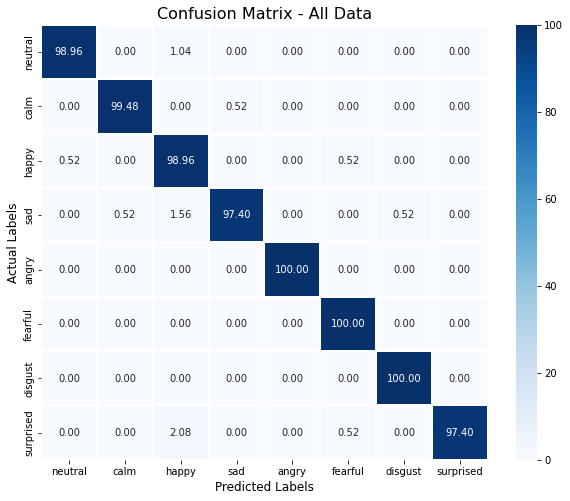

In [ ]:
# Confusion matrix - all data
confusion_matrix_all = metrics.confusion_matrix(y_all_true, y_all_pred, normalize='true') * 100
confusion_matrix_all_df = pd.DataFrame(confusion_matrix_all, index = [i for i in encoder.categories_] , columns = [i for i in encoder.categories_])

plt.figure(figsize = (10, 8))
sns.heatmap(confusion_matrix_all_df, linecolor='white', cmap='Blues', linewidth=1, annot=True, fmt='.2f')
plt.title('Confusion Matrix - All Data', size=16)
plt.xlabel('Predicted Labels', size=12)
plt.ylabel('Actual Labels', size=12)
# plt.savefig('ConfusionMatrixAlldata.png')
plt.show()

###### Classwise accuracy

In [ ]:
cm_all = metrics.confusion_matrix(y_all_true, y_all_pred)
class_accuracy_all = cm_all.diagonal() / cm_all.sum(1)
accuracy_all = cm_all.diagonal().sum() / cm_all.sum()

print(f"Classwise accuracy for all data: {class_accuracy_all}")
print(f"\nAccuracy for all data: {accuracy_all:.4f}")

Classwise accuracy for all data: [0.98958333 0.99479167 0.98958333 0.97395833 1.         1.
 1.         0.97395833]

Accuracy for all data: 0.9903


###### Classification report

In [ ]:
print("Classification report - All Data\n")
print(metrics.classification_report(y_all_true, y_all_pred, target_names=categories))

Classification report - All Data

              precision    recall  f1-score   support

     neutral       0.99      0.99      0.99        96
        calm       0.99      0.99      0.99       192
       happy       0.96      0.99      0.97       192
         sad       0.99      0.97      0.98       192
       angry       1.00      1.00      1.00       192
     fearful       0.99      1.00      0.99       192
     disgust       0.99      1.00      1.00       192
   surprised       1.00      0.97      0.99       192

    accuracy                           0.99      1440
   macro avg       0.99      0.99      0.99      1440
weighted avg       0.99      0.99      0.99      1440



# THE END